<a href="https://colab.research.google.com/github/RajArPatra/Synthetic-Data-Generation/blob/main/GAN_data_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install tensorflow==1.3 keras==2.0.9 numpy==1.17 hdbscan==0.8.26 matplotlib==3.2.2 pandas==1.0.5 psutil==5.7.0 scikit-learn==0.23.1 xgboost==1.1.1

     |████████████████████████████████| 43.6MB 84kB/s 
     |████████████████████████████████| 307kB 26.6MB/s 
     |████████████████████████████████| 20.4MB 54.0MB/s 
     |████████████████████████████████| 4.7MB 40.0MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 10.1MB 28.8MB/s 
     |████████████████████████████████| 450kB 37.4MB/s 
     |████████████████████████████████| 6.9MB 35.3MB/s 
     |████████████████████████████████| 127.6MB 57kB/s 
     |████████████████████████████████| 1.6MB 50.9MB/s 
     |████████████████████████████████| 890kB 37.7MB/s 
  Created wheel for hdbscan: filename=hdbscan-0.8.26-cp36-cp36m-linux_x86_64.whl size=2301789 sha256=25830e8b37da38d51d88748ca26bc1e8830a183b3191656f813e208b6318e682
  Stored in directory: /root/.cache/pip/wheels/82/38/41/372f034d8abd271ef7787a681e0a47fc05d472683a7eb088ed
Successfully built hdbscan
  Created whe

In [ ]:
%cp /content/drive/My\ Drive/Datasets/Friday-23-02-2018_TrafficForML_CICFlowMeter.csv /content
!mv Friday-23-02-2018_TrafficForML_CICFlowMeter.csv data.csv

In [ ]:
%cp /content/drive/My\ Drive/Datasets/generated_files/Brute_Force_web.csv /content

In [ ]:
df=pd.read_csv('/content/data.csv')
print(df.head())

   Dst Port  Protocol            Timestamp  ...  Idle Max  Idle Min   Label
0        22         6  23/02/2018 08:18:29  ...         0         0  Benign
1       500        17  23/02/2018 08:17:45  ...  75583006  41990849  Benign
2       500        17  23/02/2018 08:17:45  ...  75583007  41990841  Benign
3        22         6  23/02/2018 08:19:55  ...         0         0  Benign
4       500        17  23/02/2018 08:18:17  ...  41989576   7200485  Benign

[5 rows x 80 columns]


In [ ]:
#df=pd.read_csv('/content/data.csv')
df1=pd.to_datetime(df['Timestamp'])
df['Timestamp']=df1.astype(np.int64) 
print(df.head())

   Dst Port  Protocol            Timestamp  ...  Idle Max  Idle Min   Label
0        22         6  1519373909000000000  ...         0         0  Benign
1       500        17  1519373865000000000  ...  75583006  41990849  Benign
2       500        17  1519373865000000000  ...  75583007  41990841  Benign
3        22         6  1519373995000000000  ...         0         0  Benign
4       500        17  1519373897000000000  ...  41989576   7200485  Benign

[5 rows x 80 columns]


In [ ]:
df_Brute_web=df[df['Label']=='Brute Force -Web']
print(df_Brute_web.head())

     Dst Port  Protocol  ...  Idle Min             Label
339        80         6  ...         0  Brute Force -Web
340        80         6  ...         0  Brute Force -Web
341        80         6  ...         0  Brute Force -Web
342         0         0  ...  56320440  Brute Force -Web
343       500        17  ...   7200399  Brute Force -Web

[5 rows x 80 columns]


In [ ]:
df_Brute_web['Label'].replace(['Brute Force -Web'],1,inplace=True)

df_Brute_web=df_Brute_web[~df_Brute_web.isin([np.nan, np.inf, -np.inf]).any(1)]
print(df_Brute_web.head())

     Dst Port  Protocol            Timestamp  ...  Idle Max  Idle Min  Label
339        80         6  1519380270000000000  ...         0         0      1
340        80         6  1519380270000000000  ...         0         0      1
341        80         6  1519380325000000000  ...         0         0      1
342         0         0  1519380157000000000  ...  56320516  56320440      1
343       500        17  1519380170000000000  ...  41990219   7200399      1

[5 rows x 80 columns]


/usr/local/lib/python3.6/dist-packages/pandas/core/generic.py:6746: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


In [ ]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
scaler = MinMaxScaler()
data_cols = [ i for i in df_Brute_web.columns if i not in ['Label'] ]
for i in data_cols:
  
   df_Brute_web[[i]]=scaler.fit_transform(df_Brute_web[[i]])

In [ ]:
for i in data_cols:
  
   df_Brute_web[[i]]=scaler.fit_transform(df_Brute_web[[i]])

In [ ]:
df_gen=pd.read_csv('/content/Brute_Force_web.csv',index_col=0)
df_gen.reset_index(drop=True, inplace=True)
print(df_gen.head())

       Dst Port   Protocol  ...      Idle Min                   Timestamp
0    170.076980   5.970266  ... -4.821933e+05  2018-02-23 10:36:30.388488
1  34772.169501   3.518056  ...  3.916935e+07  2018-02-23 10:06:32.903692
2 -20652.544677  18.616043  ...  4.107296e+07  2018-02-23 10:08:07.043492
3     17.785231  17.930056  ...  1.004081e+07  2018-02-23 10:39:12.108241
4    386.530903   6.141378  ... -1.290396e+06  2018-02-23 10:10:53.672750

[5 rows x 79 columns]


In [ ]:
cols = df_gen.columns.tolist()
cols=cols[:2]+cols[-1:]+cols[2:-1]
df_gen=df_gen[cols]
print(df_gen.head())

NameError: ignored

In [ ]:
df1=pd.to_datetime(df_gen['Timestamp'])
df_gen['Timestamp']=df1.astype(np.int64) 
print(df_gen.head())

       Dst Port   Protocol  ...      Idle Max      Idle Min
0    170.076980   5.970266  ...  6.732832e+07 -4.821933e+05
1  34772.169501   3.518056  ... -1.626484e+06  3.916935e+07
2 -20652.544677  18.616043  ...  3.035897e+07  4.107296e+07
3     17.785231  17.930056  ...  3.808789e+07  1.004081e+07
4    386.530903   6.141378  ... -1.664434e+05 -1.290396e+06

[5 rows x 79 columns]


In [ ]:
print(cols)

['Dst Port', 'Protocol', 'Timestamp', 'Flow Duration', 'Tot Fwd Pkts', 'Tot Bwd Pkts', 'TotLen Fwd Pkts', 'TotLen Bwd Pkts', 'Fwd Pkt Len Max', 'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std', 'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean', 'Bwd Pkt Len Std', 'Flow Byts/s', 'Flow Pkts/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Len', 'Bwd Header Len', 'Fwd Pkts/s', 'Bwd Pkts/s', 'Pkt Len Min', 'Pkt Len Max', 'Pkt Len Mean', 'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt', 'SYN Flag Cnt', 'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'URG Flag Cnt', 'CWE Flag Count', 'ECE Flag Cnt', 'Down/Up Ratio', 'Pkt Size Avg', 'Fwd Seg Size Avg', 'Bwd Seg Size Avg', 'Fwd Byts/b Avg', 'Fwd Pkts/b Avg', 'Fwd Blk Rate Avg', 'Bwd By

In [ ]:
cols_r = df.columns.tolist()
for i in cols_r:
  if i not in cols:
    print(i)



Label


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# %matplotlib inline
plt.style.use('ggplot')

import xgboost as xgb

import pickle
import gc
import os
import sys

from keras import applications
from keras import backend as K
from keras import layers
from keras import models
from keras import optimizers
import tensorflow as tf


def BaseMetrics(y_pred,y_true):
    TP = np.sum( (y_pred == 1) & (y_true == 1) )
    TN = np.sum( (y_pred == 0) & (y_true == 0) )
    FP = np.sum( (y_pred == 1) & (y_true == 0) )
    FN = np.sum( (y_pred == 0) & (y_true == 1) )
    return TP, TN, FP, FN

def SimpleMetrics(y_pred,y_true):
    TP, TN, FP, FN = BaseMetrics(y_pred,y_true)
    ACC = ( TP + TN ) / ( TP + TN + FP + FN )
    
    # Reporting
    from IPython.display import display
    print( 'Confusion Matrix')
    display( pd.DataFrame( [[TN,FP],[FN,TP]], columns=['Pred 0','Pred 1'], index=['True 0', 'True 1'] ) )
    print( 'Accuracy : {}'.format( ACC ))
    
def SimpleAccuracy(y_pred,y_true):
    TP, TN, FP, FN = BaseMetrics(y_pred,y_true)
    ACC = ( TP + TN ) / ( TP + TN + FP + FN )
    return ACC


    
def get_data_batch(train, batch_size, seed=0):
    # # random sampling - some samples will have excessively low or high sampling, but easy to implement
    # np.random.seed(seed)
    # x = train.loc[ np.random.choice(train.index, batch_size) ].values
    
    # iterate through shuffled indices, so every sample gets covered evenly
    start_i = (batch_size * seed) % len(train)
    stop_i = start_i + batch_size
    shuffle_seed = (batch_size * seed) // len(train)
    np.random.seed(shuffle_seed)
    train_ix = np.random.choice( list(train.index), replace=False, size=len(train) ) # wasteful to shuffle every time
    train_ix = list(train_ix) + list(train_ix) # duplicate to cover ranges past the end of the set
    x = train.loc[ train_ix[ start_i: stop_i ] ].values
    
    return np.reshape(x, (batch_size, -1) )


    
def CheckAccuracy( x, g_z, data_cols, label_cols=[], seed=0, with_class=False, data_dim=2 ):

    # Slightly slower code to create dataframes to feed into the xgboost dmatrix formats
    
    # real_samples = pd.DataFrame(x, columns=data_cols+label_cols)
    # gen_samples = pd.DataFrame(g_z, columns=data_cols+label_cols)
    # real_samples['syn_label'] = 0
    # gen_samples['syn_label'] = 1
    
    # training_fraction = 0.5
    # n_real, n_gen = int(len(real_samples)*training_fraction), int(len(gen_samples)*training_fraction)
    # train_df = pd.concat([real_samples[:n_real],gen_samples[:n_gen]],axis=0)
    # test_df = pd.concat([real_samples[n_real:],gen_samples[n_gen:]],axis=0)

    # X_col = test_df.columns[:-1]
    # y_col = test_df.columns[-1]
    # dtrain = xgb.DMatrix(train_df[X_col], train_df[y_col], feature_names=X_col)
    # dtest = xgb.DMatrix(test_df[X_col], feature_names=X_col)
    # y_true = test_df['syn_label']

    dtrain = np.vstack( [ x[:int(len(x)/2)], g_z[:int(len(g_z)/2)] ] ) # Use half of each real and generated set for training
    dlabels = np.hstack( [ np.zeros(int(len(x)/2)), np.ones(int(len(g_z)/2)) ] ) # synthetic labels
    dtest = np.vstack( [ x[int(len(x)/2):], g_z[int(len(g_z)/2):] ] ) # Use the other half of each set for testing
    y_true = dlabels # Labels for test samples will be the same as the labels for training samples, assuming even batch sizes
    
    dtrain = xgb.DMatrix(dtrain, dlabels, feature_names=data_cols+label_cols)
    dtest = xgb.DMatrix(dtest, feature_names=data_cols+label_cols)
    
    xgb_params = {
        # 'tree_method': 'hist', # for faster evaluation
        'max_depth': 4, # for faster evaluation
        'objective': 'binary:logistic',
        'random_state': 0,
        'eval_metric': 'auc', # allows for balanced or unbalanced classes 
        }
    xgb_test = xgb.train(xgb_params, dtrain, num_boost_round=10) # limit to ten rounds for faster evaluation

    y_pred = np.round(xgb_test.predict(dtest))

    # return '{:.2f}'.format(SimpleAccuracy(y_pred, y_true)) # assumes balanced real and generated datasets
    return SimpleAccuracy(y_pred, y_true) # assumes balanced real and generated datasets
    
def PlotData( x, g_z, data_cols, label_cols=[], seed=0, with_class=False, data_dim=2, save=False, prefix='' ):
    
    real_samples = pd.DataFrame(x, columns=data_cols+label_cols)
    gen_samples = pd.DataFrame(g_z, columns=data_cols+label_cols)
    
    f, axarr = plt.subplots(1, 2, figsize=(6,2) )
    if with_class:
        axarr[0].scatter( real_samples[data_cols[0]], real_samples[data_cols[1]], c=real_samples[label_cols[0]]/2 ) #, cmap='plasma'  )
        axarr[1].scatter( gen_samples[ data_cols[0]], gen_samples[ data_cols[1]], c=gen_samples[label_cols[0]]/2 ) #, cmap='plasma'  )
        
        # For when there are multiple one-hot encoded label columns
        # for i in range(len(label_cols)):
            # temp = real_samples.loc[ real_samples[ label_cols[i] ] == 1 ]
            # axarr[0].scatter( temp[data_cols[0]], temp[data_cols[1]], c='C'+str(i), label=i )
            # temp = gen_samples.loc[ gen_samples[ label_cols[i] ] == 1 ]
            # axarr[1].scatter( temp[data_cols[0]], temp[data_cols[1]], c='C'+str(i), label=i )
        
    else:
        axarr[0].scatter( real_samples[data_cols[0]], real_samples[data_cols[1]]) #, cmap='plasma'  )
        axarr[1].scatter( gen_samples[data_cols[0]], gen_samples[data_cols[1]]) #, cmap='plasma'  )
    axarr[0].set_title('real')
    axarr[1].set_title('generated')   
    axarr[0].set_ylabel(data_cols[1]) # Only add y label to left plot
    for a in axarr: a.set_xlabel(data_cols[0]) # Add x label to both plots
    axarr[1].set_xlim(axarr[0].get_xlim()), axarr[1].set_ylim(axarr[0].get_ylim()) # Use axes ranges from real data for generated data
    
    if save:
        plt.save( prefix + '.xgb_check.png' )
        
    plt.show()

    

#### Functions to define the layers of the networks used in the 'define_models' functions below
    
def generator_network(x, data_dim, base_n_count): 
    x = layers.Dense(base_n_count, activation='relu')(x)
    x = layers.Dense(base_n_count*2, activation='relu')(x)
    x = layers.Dense(base_n_count*4, activation='relu')(x)
    x = layers.Dense(data_dim)(x)    
    return x
    
def generator_network_w_label(x, labels, data_dim, label_dim, base_n_count): 
    x = layers.concatenate([x,labels])
    x = layers.Dense(base_n_count*1, activation='relu')(x) # 1
    x = layers.Dense(base_n_count*2, activation='relu')(x) # 2
    x = layers.Dense(base_n_count*4, activation='relu')(x)
    # x = layers.Dense(base_n_count*4, activation='relu')(x) # extra
    # x = layers.Dense(base_n_count*4, activation='relu')(x) # extra
    x = layers.Dense(data_dim)(x)    
    x = layers.concatenate([x,labels])
    return x
    
def discriminator_network(x, data_dim, base_n_count):
    x = layers.Dense(base_n_count*4, activation='relu')(x)
    # x = layers.Dropout(0.1)(x)
    x = layers.Dense(base_n_count*2, activation='relu')(x)
    # x = layers.Dropout(0.1)(x)
    x = layers.Dense(base_n_count, activation='relu')(x)
    x = layers.Dense(1, activation='sigmoid')(x)
    # x = layers.Dense(1)(x)
    return x
    
def critic_network(x, data_dim, base_n_count):
    x = layers.Dense(base_n_count*4, activation='relu')(x)
    # x = layers.Dropout(0.1)(x)
    x = layers.Dense(base_n_count*2, activation='relu')(x) # 2
    # x = layers.Dropout(0.1)(x)
    x = layers.Dense(base_n_count*1, activation='relu')(x) # 1
    # x = layers.Dense(base_n_count*4, activation='relu')(x) # extra
    # x = layers.Dense(base_n_count*4, activation='relu')(x) # extra
    # x = layers.Dense(1, activation='sigmoid')(x)
    x = layers.Dense(1)(x)
    return x

    
    
#### Functions to define the keras network models    
    
def define_models_GAN(rand_dim, data_dim, base_n_count, type=None):
    generator_input_tensor = layers.Input(shape=(rand_dim, ))
    generated_image_tensor = generator_network(generator_input_tensor, data_dim, base_n_count)

    generated_or_real_image_tensor = layers.Input(shape=(data_dim,))
    
    if type == 'Wasserstein':
        discriminator_output = critic_network(generated_or_real_image_tensor, data_dim, base_n_count)
    else:
        discriminator_output = discriminator_network(generated_or_real_image_tensor, data_dim, base_n_count)

    generator_model = models.Model(inputs=[generator_input_tensor], outputs=[generated_image_tensor], name='generator')
    discriminator_model = models.Model(inputs=[generated_or_real_image_tensor],
                                       outputs=[discriminator_output],
                                       name='discriminator')

    combined_output = discriminator_model(generator_model(generator_input_tensor))
    combined_model = models.Model(inputs=[generator_input_tensor], outputs=[combined_output], name='combined')
    
    return generator_model, discriminator_model, combined_model

def define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count, type=None):
    generator_input_tensor = layers.Input(shape=(rand_dim, ))
    labels_tensor = layers.Input(shape=(label_dim,)) # updated for class
    generated_image_tensor = generator_network_w_label(generator_input_tensor, labels_tensor, data_dim, label_dim, base_n_count) # updated for class

    generated_or_real_image_tensor = layers.Input(shape=(data_dim + label_dim,)) # updated for class
    
    if type == 'Wasserstein':
        discriminator_output = critic_network(generated_or_real_image_tensor, data_dim + label_dim, base_n_count) # updated for class
    else:
        discriminator_output = discriminator_network(generated_or_real_image_tensor, data_dim + label_dim, base_n_count) # updated for class

    generator_model = models.Model(inputs=[generator_input_tensor, labels_tensor], outputs=[generated_image_tensor], name='generator') # updated for class
    discriminator_model = models.Model(inputs=[generated_or_real_image_tensor],
                                       outputs=[discriminator_output],
                                       name='discriminator')

    combined_output = discriminator_model(generator_model([generator_input_tensor, labels_tensor])) # updated for class
    combined_model = models.Model(inputs=[generator_input_tensor, labels_tensor], outputs=[combined_output], name='combined') # updated for class
    
    return generator_model, discriminator_model, combined_model



#### Functions specific to the WGAN architecture
#### The train discrimnator step is separated out to facilitate pre-training of the discriminator by itself

def em_loss(y_coefficients, y_pred):
    # define earth mover distance (wasserstein loss)
    # literally the weighted average of the critic network output
    # this is defined separately so it can be fed as a loss function to the optimizer in the WGANs
    return tf.reduce_mean(tf.multiply(y_coefficients, y_pred))

def train_discriminator_step(model_components, seed=0):
    
    [ cache_prefix, with_class, starting_step,
                        train, data_cols, data_dim,
                        label_cols, label_dim,
                        generator_model, discriminator_model, combined_model,
                        rand_dim, nb_steps, batch_size, 
                        k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
                        data_dir, generator_model_path, discriminator_model_path,

                        sess, _z, _x, _labels, _g_z, epsilon, x_hat, gradients, _gradient_penalty,
                        _disc_loss_generated, _disc_loss_real, _disc_loss, disc_optimizer,
                        show,
                        combined_loss, disc_loss_generated, disc_loss_real, xgb_losses
                        ] = model_components
    
    if with_class:
        d_l_g, d_l_r, _ = sess.run([_disc_loss_generated, _disc_loss_real, disc_optimizer], feed_dict={
            _z: np.random.normal(size=(batch_size, rand_dim)),
            _x: get_data_batch(train, batch_size, seed=seed),
            _labels: get_data_batch(train, batch_size, seed=seed)[:,-label_dim:], # .reshape(-1,label_dim), # updated for class            
            epsilon: np.random.uniform(low=0.0, high=1.0, size=(batch_size, 1))
        })
    else:
        d_l_g, d_l_r, _ = sess.run([_disc_loss_generated, _disc_loss_real, disc_optimizer], feed_dict={
            _z: np.random.normal(size=(batch_size, rand_dim)),
            _x: get_data_batch(train, batch_size, seed=seed),
            epsilon: np.random.uniform(low=0.0, high=1.0, size=(batch_size, 1))
        })
    return d_l_g, d_l_r

def training_steps_WGAN(model_components):
    
    [ cache_prefix, with_class, starting_step,
                        train, data_cols, data_dim,
                        label_cols, label_dim,
                        generator_model, discriminator_model, combined_model,
                        rand_dim, nb_steps, batch_size, 
                        k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
                        data_dir, generator_model_path, discriminator_model_path,

                        sess, _z, _x, _labels, _g_z, epsilon, x_hat, gradients, _gradient_penalty,
                        _disc_loss_generated, _disc_loss_real, _disc_loss, disc_optimizer,
                        show,
                        combined_loss, disc_loss_generated, disc_loss_real, xgb_losses
                        ] = model_components
    
    for i in range(starting_step, starting_step+nb_steps):
        K.set_learning_phase(1) # 1 = train

        # train the discriminator
        for j in range(k_d):
            d_l_g, d_l_r = train_discriminator_step(model_components, seed=i+j)
        disc_loss_generated.append(d_l_g)
        disc_loss_real.append(d_l_r)

        # train the generator
        for j in range(k_g):
            np.random.seed(i+j)
            z = np.random.normal(size=(batch_size, rand_dim))
            if with_class:
                labels = get_data_batch(train, batch_size, seed=i+j)[:,-label_dim:] # updated for class
                loss = combined_model.train_on_batch([z, labels], [-np.ones(batch_size)]) # updated for class
            else:
                loss = combined_model.train_on_batch(z, [-np.ones(batch_size)])
        combined_loss.append(loss)

        # Determine xgb loss each step, after training generator and discriminator
        if not i % 10: # 2x faster than testing each step...
            K.set_learning_phase(0) # 0 = test
            test_size = 362 # test using all of the actual fraud data
            x = get_data_batch(train, test_size, seed=i)
            z = np.random.normal(size=(test_size, rand_dim))
            if with_class:
                labels = x[:,-label_dim:]
                g_z = generator_model.predict([z, labels])
            else:
                g_z = generator_model.predict(z)
            xgb_loss = CheckAccuracy( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim )
            xgb_losses = np.append(xgb_losses, xgb_loss)
        
        if not i % log_interval:
            print('Step: {} of {}.'.format(i, starting_step + nb_steps))
            # K.set_learning_phase(0) # 0 = test
                        
            # loss summaries   
            print( 'Losses: G, D Gen, D Real, Xgb: {:.4f}, {:.4f}, {:.4f}, {:.4f}'.format(combined_loss[-1], disc_loss_generated[-1], disc_loss_real[-1], xgb_losses[-1]) )
            print( 'D Real - D Gen: {:.4f}'.format(disc_loss_real[-1]-disc_loss_generated[-1]) )
            # print('Generator model loss: {}.'.format(combined_loss[-1]))
            # print('Discriminator model loss gen: {}.'.format(disc_loss_generated[-1]))
            # print('Discriminator model loss real: {}.'.format(disc_loss_real[-1]))
            # print('xgboost accuracy: {}'.format(xgb_losses[-1]) )
            
            if show:
                PlotData( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim, 
                            save=False, prefix= data_dir + cache_prefix + '_' + str(i) )

            # save model checkpoints
            model_checkpoint_base_name = data_dir + cache_prefix + '_{}_model_weights_step_{}.h5'
            generator_model.save_weights(model_checkpoint_base_name.format('generator', i))
            discriminator_model.save_weights(model_checkpoint_base_name.format('discriminator', i))
            pickle.dump([combined_loss, disc_loss_generated, disc_loss_real, xgb_losses], 
                open( data_dir + cache_prefix + '_losses_step_{}.pkl'.format(i) ,'wb'))
    
    return [combined_loss, disc_loss_generated, disc_loss_real, xgb_losses]

def adversarial_training_WGAN(arguments, train, data_cols, label_cols=[], seed=0, starting_step=0):

    [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ] = arguments
            
    np.random.seed(seed)     # set random seed
    
    data_dim = len(data_cols)
    print('data_dim: ', data_dim)
    print('data_cols: ', data_cols)
    
    label_dim = 0
    with_class = False
    if len(label_cols) > 0: 
        with_class = True
        label_dim = len(label_cols)
        print('label_dim: ', label_dim)
        print('label_cols: ', label_cols)
      
    # define network models
    
    K.set_learning_phase(1) # 1 = train
    
    if with_class:
        cache_prefix = 'WCGAN'
        generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count, type='Wasserstein')
    else:
        cache_prefix = 'WGAN'
        generator_model, discriminator_model, combined_model = define_models_GAN(rand_dim, data_dim, base_n_count, type='Wasserstein')
    
    
    # construct computation graph for calculating the gradient penalty (improved WGAN) and training the discriminator

    _z = tf.placeholder(tf.float32, shape=(batch_size, rand_dim))
    
    _labels = None
    if with_class:  
        _x = tf.placeholder(tf.float32, shape=(batch_size, data_dim + label_dim))    
        _labels = tf.placeholder(tf.float32, shape=(batch_size, label_dim)) # updated for class
        _g_z = generator_model(inputs=[_z, _labels]) # updated for class    
    else:      
        _x = tf.placeholder(tf.float32, shape=(batch_size, data_dim))
        _g_z = generator_model(_z)
    
    epsilon = tf.placeholder(tf.float32, shape=(batch_size, 1))
    
    x_hat = epsilon * _x + (1.0 - epsilon) * _g_z
    gradients = tf.gradients(discriminator_model(x_hat), [x_hat])
    _gradient_penalty = 10.0 * tf.square(tf.norm(gradients[0], ord=2) - 1.0)

    # calculate discriminator's loss
    _disc_loss_generated = em_loss(tf.ones(batch_size), discriminator_model(_g_z))
    _disc_loss_real = em_loss(tf.ones(batch_size), discriminator_model(_x))
    _disc_loss = _disc_loss_generated - _disc_loss_real + _gradient_penalty

    # update f by taking an SGD step on mini-batch loss LD(f)
    disc_optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=0.5, beta2=0.9).minimize(
        _disc_loss, var_list=discriminator_model.trainable_weights)

    sess = K.get_session()

    # compile models

    adam = optimizers.Adam(lr=learning_rate, beta_1=0.5, beta_2=0.9)

    discriminator_model.trainable = False
    combined_model.compile(optimizer=adam, loss=[em_loss])

    combined_loss, disc_loss_generated, disc_loss_real, xgb_losses = [], [], [], []
    
    model_components = [ cache_prefix, with_class, starting_step,
                        train, data_cols, data_dim,
                        label_cols, label_dim,
                        generator_model, discriminator_model, combined_model,
                        rand_dim, nb_steps, batch_size, 
                        k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
                        data_dir, generator_model_path, discriminator_model_path,

                        sess, _z, _x, _labels, _g_z, epsilon, x_hat, gradients, _gradient_penalty,
                        _disc_loss_generated, _disc_loss_real, _disc_loss, disc_optimizer,
                        show,
                        combined_loss, disc_loss_generated, disc_loss_real, xgb_losses
                        ]

    if show:
        print(generator_model.summary())
        print(discriminator_model.summary())
        print(combined_model.summary())

    if loss_pickle_path:
        print('Loading loss pickles')
        [combined_loss, disc_loss_generated, disc_loss_real, xgb_losses] = pickle.load(open(loss_pickle_path,'rb'))
    if generator_model_path:
        print('Loading generator model')
        generator_model.load_weights(generator_model_path) #, by_name=True)
    if discriminator_model_path:
        print('Loading discriminator model')
        discriminator_model.load_weights(discriminator_model_path) #, by_name=True)
    else:
        print('pre-training the critic...')
        K.set_learning_phase(1) # 1 = train
        for i in range(critic_pre_train_steps):
            if i%20==0:
                print('Step: {} of {} critic pre-training.'.format(i, critic_pre_train_steps))
            loss = train_discriminator_step(model_components, seed=i)
        print('Last batch of critic pre-training disc_loss: {}.'.format(loss))

    model_components = [ cache_prefix, with_class, starting_step,
                        train, data_cols, data_dim,
                        label_cols, label_dim,
                        generator_model, discriminator_model, combined_model,
                        rand_dim, nb_steps, batch_size, 
                        k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
                        data_dir, generator_model_path, discriminator_model_path,

                        sess, _z, _x, _labels, _g_z, epsilon, x_hat, gradients, _gradient_penalty,
                        _disc_loss_generated, _disc_loss_real, _disc_loss, disc_optimizer,
                        show,
                        combined_loss, disc_loss_generated, disc_loss_real, xgb_losses
                        ]
        
    [combined_loss, disc_loss_generated, disc_loss_real, xgb_losses] = training_steps_WGAN(model_components)
   


#### Functions specific to the vanilla GAN architecture   
        
def training_steps_GAN(model_components):
    
    [ cache_prefix, with_class, starting_step,
                        train, data_cols, data_dim,
                        label_cols, label_dim,
                        generator_model, discriminator_model, combined_model,
                        rand_dim, nb_steps, batch_size, 
                        k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
                        data_dir, generator_model_path, discriminator_model_path, show,
                        combined_loss, disc_loss_generated, disc_loss_real, xgb_losses ] = model_components  
    
    for i in range(starting_step, starting_step+nb_steps):
        K.set_learning_phase(1) # 1 = train

        # train the discriminator
        for j in range(k_d):
            np.random.seed(i+j)
            z = np.random.normal(size=(batch_size, rand_dim))
            x = get_data_batch(train, batch_size, seed=i+j)
            
            if with_class:
                labels = x[:,-label_dim:]
                g_z = generator_model.predict([z, labels])
            else:
                g_z = generator_model.predict(z)
#             x = np.vstack([x,g_z]) # code to train the discriminator on real and generated data at the same time, but you have to run network again for separate losses
#             classes = np.hstack([np.zeros(batch_size),np.ones(batch_size)])
#             d_l_r = discriminator_model.train_on_batch(x, classes)
            
            d_l_r = discriminator_model.train_on_batch(x, np.random.uniform(low=0.999, high=1.0, size=batch_size)) # 0.7, 1.2 # GANs need noise to prevent loss going to zero
            d_l_g = discriminator_model.train_on_batch(g_z, np.random.uniform(low=0.0, high=0.001, size=batch_size)) # 0.0, 0.3 # GANs need noise to prevent loss going to zero
            # d_l_r = discriminator_model.train_on_batch(x, np.ones(batch_size)) # without noise
            # d_l_g = discriminator_model.train_on_batch(g_z, np.zeros(batch_size)) # without noise
        disc_loss_real.append(d_l_r)
        disc_loss_generated.append(d_l_g)
        
        # train the generator
        for j in range(k_g):
            np.random.seed(i+j)
            z = np.random.normal(size=(batch_size, rand_dim))
            if with_class:
                # loss = combined_model.train_on_batch([z, labels], np.ones(batch_size)) # without noise
                loss = combined_model.train_on_batch([z, labels], np.random.uniform(low=0.999, high=1.0, size=batch_size)) # 0.7, 1.2 # GANs need noise to prevent loss going to zero
            else:
                # loss = combined_model.train_on_batch(z, np.ones(batch_size)) # without noise
                loss = combined_model.train_on_batch(z, np.random.uniform(low=0.999, high=1.0, size=batch_size)) # 0.7, 1.2 # GANs need noise to prevent loss going to zero
        combined_loss.append(loss)
        
        # Determine xgb loss each step, after training generator and discriminator
        if not i % 10: # 2x faster than testing each step...
            K.set_learning_phase(0) # 0 = test
            test_size = 362 # test using all of the actual fraud data
            x = get_data_batch(train, test_size, seed=i)
            z = np.random.normal(size=(test_size, rand_dim))
            if with_class:
                labels = x[:,-label_dim:]
                g_z = generator_model.predict([z, labels])
            else:
                g_z = generator_model.predict(z)
            xgb_loss = CheckAccuracy( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim )
            xgb_losses = np.append(xgb_losses, xgb_loss)

        # Saving weights and plotting images
        if not i % log_interval:
            print('Step: {} of {}.'.format(i, starting_step + nb_steps))
            K.set_learning_phase(0) # 0 = test
                        
            # loss summaries      
            print( 'Losses: G, D Gen, D Real, Xgb: {:.4f}, {:.4f}, {:.4f}, {:.4f}'.format(combined_loss[-1], disc_loss_generated[-1], disc_loss_real[-1], xgb_losses[-1]) )
            print( 'D Real - D Gen: {:.4f}'.format(disc_loss_real[-1]-disc_loss_generated[-1]) )            
            # print('Generator model loss: {}.'.format(combined_loss[-1]))
            # print('Discriminator model loss gen: {}.'.format(disc_loss_generated[-1]))
            # print('Discriminator model loss real: {}.'.format(disc_loss_real[-1]))
            # print('xgboost accuracy: {}'.format(xgb_losses[-1]) )
            
            if show:
                PlotData( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim, 
                            save=False, prefix= data_dir + cache_prefix + '_' + str(i) )
            
            # save model checkpoints
            model_checkpoint_base_name = data_dir + cache_prefix + '_{}_model_weights_step_{}.h5'
            generator_model.save_weights(model_checkpoint_base_name.format('generator', i))
            discriminator_model.save_weights(model_checkpoint_base_name.format('discriminator', i))
            pickle.dump([combined_loss, disc_loss_generated, disc_loss_real, xgb_losses], 
                open( data_dir + cache_prefix + '_losses_step_{}.pkl'.format(i) ,'wb'))
    
    return [combined_loss, disc_loss_generated, disc_loss_real, xgb_losses]
    
def adversarial_training_GAN(arguments, train, data_cols, label_cols=[], seed=0, starting_step=0):

    [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ] = arguments
    
    np.random.seed(seed)     # set random seed
    
    data_dim = len(data_cols)
    print('data_dim: ', data_dim)
    print('data_cols: ', data_cols)
    
    label_dim = 0
    with_class = False
    if len(label_cols) > 0: 
        with_class = True
        label_dim = len(label_cols)
        print('label_dim: ', label_dim)
        print('label_cols: ', label_cols)
    
    # define network models
    
    K.set_learning_phase(1) # 1 = train
    
    if with_class:
        cache_prefix = 'CGAN'
        generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count)
    else:
        cache_prefix = 'GAN'
        generator_model, discriminator_model, combined_model = define_models_GAN(rand_dim, data_dim, base_n_count)
    
    # compile models

    adam = optimizers.Adam(lr=learning_rate, beta_1=0.5, beta_2=0.9)

    generator_model.compile(optimizer=adam, loss='binary_crossentropy')
    discriminator_model.compile(optimizer=adam, loss='binary_crossentropy')
    discriminator_model.trainable = False
    combined_model.compile(optimizer=adam, loss='binary_crossentropy')
    
    if show:
        print(generator_model.summary())
        print(discriminator_model.summary())
        print(combined_model.summary())

    combined_loss, disc_loss_generated, disc_loss_real, xgb_losses = [], [], [], []
    
    if loss_pickle_path:
        print('Loading loss pickles')
        [combined_loss, disc_loss_generated, disc_loss_real, xgb_losses] = pickle.load(open(loss_pickle_path,'rb'))
    if generator_model_path:
        print('Loading generator model')
        generator_model.load_weights(generator_model_path, by_name=True)
    if discriminator_model_path:
        print('Loading discriminator model')
        discriminator_model.load_weights(discriminator_model_path, by_name=True)

    model_components = [ cache_prefix, with_class, starting_step,
                        train, data_cols, data_dim,
                        label_cols, label_dim,
                        generator_model, discriminator_model, combined_model,
                        rand_dim, nb_steps, batch_size, 
                        k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
                        data_dir, generator_model_path, discriminator_model_path, show,
                        combined_loss, disc_loss_generated, disc_loss_real, xgb_losses ]
        
    [combined_loss, disc_loss_generated, disc_loss_real, xgb_losses] = training_steps_GAN(model_components)
        


#### Functions specific to the DRAGAN architecture
#### Note the DRAGAN is implemented in tensorflow without Keras libraries 
#### https://github.com/kodalinaveen3/DRAGAN
        
def sample_z(m, n): # updated to normal distribution
#     return np.random.uniform(-1., 1., size=[m, n])
    return np.random.normal(size=[m, n])

def xavier_init(size): # updated to uniform distribution using standard xavier formulation
#     in_dim = size[0]
#     xavier_stddev = 1. / tf.sqrt(in_dim / 2.)
#     return tf.random_normal(shape=size, stddev=xavier_stddev, seed=global_seed)
    xavier_range = tf.sqrt( 6 / ( size[0] + size[1] ) )
    return tf.random_uniform(shape=size, minval=-xavier_range, maxval=xavier_range)

def get_perturbed_batch(minibatch):
    return minibatch + 0.5 * minibatch.std() * np.random.random(minibatch.shape)

     
def G(z, G_W, G_b): # The Generator Network
    # for i in range(len(G_layer_dims)-2):
    for i in range(len(G_W)-1):
        z = tf.nn.relu(tf.matmul(z, G_W[i]) + G_b[i])
#         print(i,G_W[i],z)
    return tf.matmul(z, G_W[-1]) + G_b[-1]     
    
def D(x, D_W, D_b): # The Discriminator Network
    # for i in range(len(D_layer_dims)-2):
    for i in range(len(D_W)-1):
        x = tf.nn.relu(tf.matmul(x, D_W[i]) + D_b[i])
    return tf.nn.sigmoid(tf.matmul(x, D_W[-1]) + D_b[-1])
     
     
def define_DRAGAN_network( X_dim=2, h_dim=128, z_dim=2, lambda0=10, learning_rate=1e-4, mb_size=128, seed=0 ):
    
    X = tf.placeholder(tf.float32, shape=[None, X_dim], name='X' )
    X_p = tf.placeholder(tf.float32, shape=[None, X_dim], name='X_p' )
    z = tf.placeholder(tf.float32, shape=[None, z_dim], name='z' )

    D_layer_dims = [X_dim, h_dim*4, h_dim*2, h_dim, 1 ]
    D_W, D_b = [], []   
    for i in range(len(D_layer_dims)-1):
        D_W.append( tf.Variable( xavier_init([D_layer_dims[i], D_layer_dims[i+1]] ), name='D_W'+str(i) ) )
    #     D_W.append( tf.Variable(  initializer=tf.contrib.layers.xavier_initializer(seed=global_seed) ) # working towards using tf's own xavier initializer
        D_b.append( tf.Variable( tf.zeros(shape=[D_layer_dims[i+1]]), name='D_b'+str(i) ) )
    theta_D = D_W + D_b

    G_layer_dims = [z_dim, h_dim, h_dim*2, h_dim*4, X_dim ]
    G_W, G_b = [], []
    for i in range(len(G_layer_dims)-1):
        G_W.append( tf.Variable( xavier_init([G_layer_dims[i], G_layer_dims[i+1]] ), name='G_W'+str(i) ) )
        G_b.append( tf.Variable( tf.zeros(shape=[G_layer_dims[i+1]]), name='g_b'+str(i) ) )
    theta_G = G_W + G_b
    # print( theta_D + theta_G )
        
    G_sample = G(z, G_W, G_b)
    D_real = D(X, D_W, D_b)
    D_fake = D(G_sample, D_W, D_b)
    D_real_perturbed = D(X_p, D_W, D_b)

    # D_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_real, labels=tf.ones_like(D_real)))
    # D_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_fake, labels=tf.zeros_like(D_fake)))
    # disc_cost = D_loss_real + D_loss_fake 
    # gen_cost = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_fake, labels=tf.ones_like(D_fake)))
    D_loss_real = tf.reduce_mean(tf.log( D_real ))
    D_loss_fake = tf.reduce_mean(tf.log( 1 - D_fake ))
    disc_cost = - D_loss_real - D_loss_fake
    gen_cost = D_loss_fake

    #Gradient penalty
    alpha = tf.random_uniform(
        shape=[mb_size,1], 
        minval=0.,
        maxval=1.) # do not set seed
        
    differences = X_p - X
    interpolates = X + (alpha*differences)
    gradients = tf.gradients(D(interpolates, D_W, D_b), [interpolates])[0]
    # slopes = tf.sqrt(tf.reduce_sum(tf.square(gradients), reduction_indices=[1]))
    # gradient_penalty = tf.reduce_mean((slopes-1.)**2)
    gradient_penalty = tf.square(tf.norm(gradients, ord=2) - 1.0 )  # corrected?

    disc_cost += lambda0 * gradient_penalty / mb_size # corrected?

    G_solver = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=0.5, beta2=0.9).minimize(gen_cost, var_list=theta_G)
    D_solver = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=0.5, beta2=0.9).minimize(disc_cost, var_list=theta_D)
    
    return [ D_solver, disc_cost, D_loss_real, D_loss_fake,
                X, X_p, z,
                G_solver, gen_cost, G_sample ]
    


 
# End of function list

In [ ]:
rand_dim = 80 # 32 # needs to be ~data_dim
base_n_count = 128 # 128

nb_steps = 50000 + 1 # 50000 # Add one for logging of the last interval
batch_size = 128 # 64

k_d = 1  # number of critic network updates per adversarial training step
k_g = 1  # number of generator network updates per adversarial training step
critic_pre_train_steps = 100 # 100  # number of steps to pre-train the critic before starting adversarial training
log_interval = 100 # 100  # interval (in steps) at which to log loss summaries and save plots of image samples to disc
learning_rate = 5e-5 # 5e-5
data_dir = '/content/weights/'
generator_model_path, discriminator_model_path, loss_pickle_path = None, None, None

# show = False
show = True 

# train = create_toy_spiral_df(1000)
# train = create_toy_df(n=1000,n_dim=2,n_classes=4,seed=0)
train = df_Brute_web.copy().reset_index(drop=True) # fraud only with labels from classification

# train = pd.get_dummies(train, columns=['Class'], prefix='Class', drop_first=True)
label_cols = [ i for i in train.columns if 'Label' in i ]
data_cols = [ i for i in train.columns if i not in label_cols ]
train[ data_cols ] = train[ data_cols ] / 10 # scale to random noise size, one less thing to learn
train_no_label = train[ data_cols ]

data_dim:  79
data_cols:  ['Dst Port', 'Protocol', 'Timestamp', 'Flow Duration', 'Tot Fwd Pkts', 'Tot Bwd Pkts', 'TotLen Fwd Pkts', 'TotLen Bwd Pkts', 'Fwd Pkt Len Max', 'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std', 'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean', 'Bwd Pkt Len Std', 'Flow Byts/s', 'Flow Pkts/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Len', 'Bwd Header Len', 'Fwd Pkts/s', 'Bwd Pkts/s', 'Pkt Len Min', 'Pkt Len Max', 'Pkt Len Mean', 'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt', 'SYN Flag Cnt', 'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'URG Flag Cnt', 'CWE Flag Count', 'ECE Flag Cnt', 'Down/Up Ratio', 'Pkt Size Avg', 'Fwd Seg Size Avg', 'Bwd Seg Size Avg', 'Fwd Byts/b Avg', 'Fwd Pkts/b Avg', '

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:973: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Step: 0 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.6443, 0.7551, 0.6859, 1.0000
D Real - D Gen: -0.0691


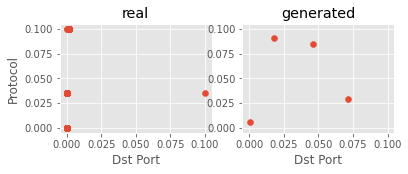

Step: 100 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.9851, 0.4743, 0.6970, 0.9945
D Real - D Gen: 0.2228


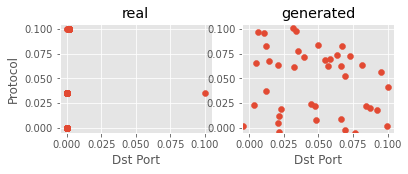

Step: 200 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.1965, 0.3695, 0.6253, 1.0000
D Real - D Gen: 0.2558


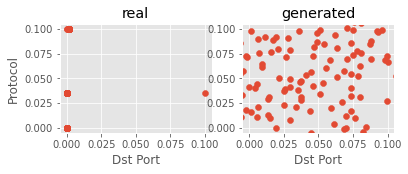

Step: 300 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.2015, 0.3717, 0.5205, 1.0000
D Real - D Gen: 0.1487


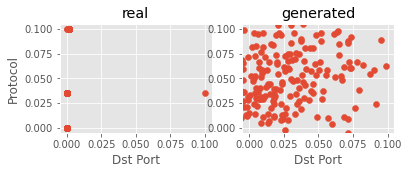

Step: 400 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.0501, 0.4520, 0.4301, 0.9945
D Real - D Gen: -0.0218


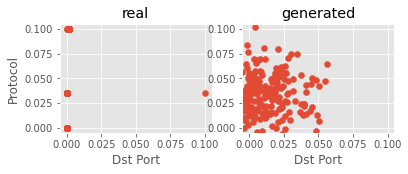

Step: 500 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.9940, 0.4774, 0.4196, 0.9834
D Real - D Gen: -0.0578


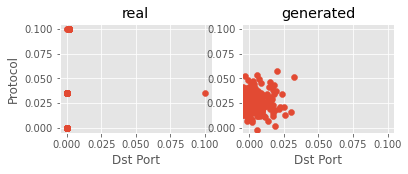

Step: 600 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.2548, 0.3458, 0.3584, 1.0000
D Real - D Gen: 0.0126


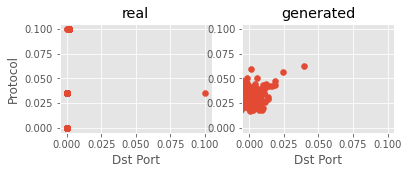

Step: 700 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.5158, 0.2634, 0.2675, 0.9917
D Real - D Gen: 0.0041


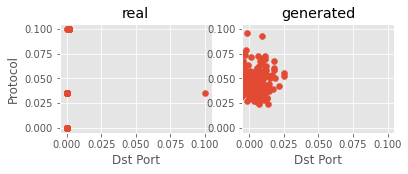

Step: 800 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8241, 0.1887, 0.2023, 1.0000
D Real - D Gen: 0.0136


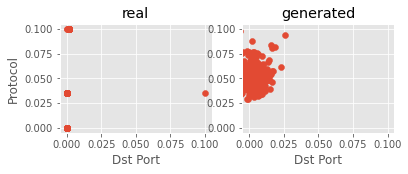

Step: 900 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0975, 0.1438, 0.1159, 0.9972
D Real - D Gen: -0.0279


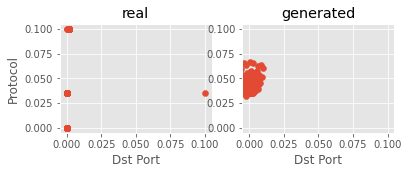

Step: 1000 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0622, 0.1617, 0.2315, 1.0000
D Real - D Gen: 0.0698


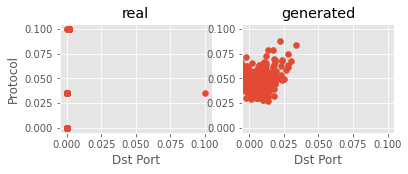

Step: 1100 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.3729, 0.1152, 0.1679, 0.9945
D Real - D Gen: 0.0527


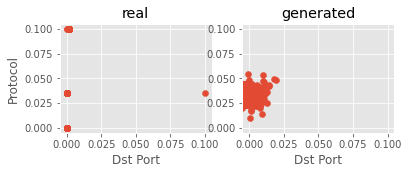

Step: 1200 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.2575, 0.1264, 0.1941, 1.0000
D Real - D Gen: 0.0678


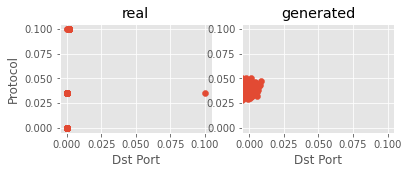

Step: 1300 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0726, 0.1560, 0.1465, 0.9834
D Real - D Gen: -0.0095


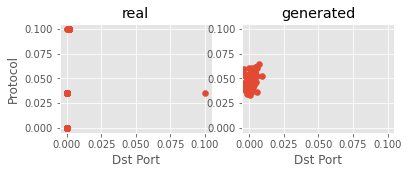

Step: 1400 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0171, 0.1721, 0.1785, 1.0000
D Real - D Gen: 0.0065


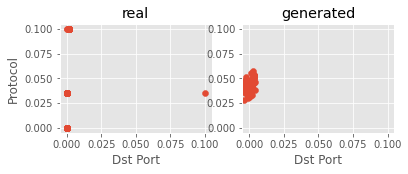

Step: 1500 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8881, 0.1939, 0.2183, 0.9972
D Real - D Gen: 0.0244


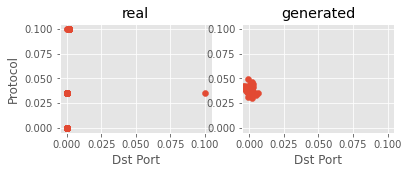

Step: 1600 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8732, 0.1963, 0.3433, 0.9917
D Real - D Gen: 0.1471


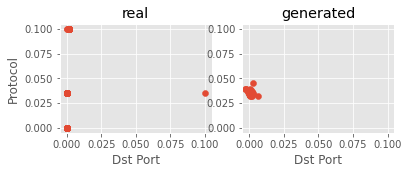

Step: 1700 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.7872, 0.2127, 0.3699, 0.9972
D Real - D Gen: 0.1572


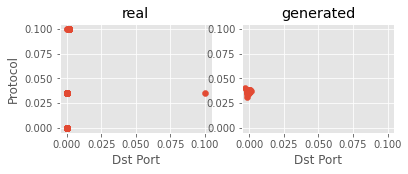

Step: 1800 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8162, 0.2081, 0.3038, 0.9945
D Real - D Gen: 0.0957


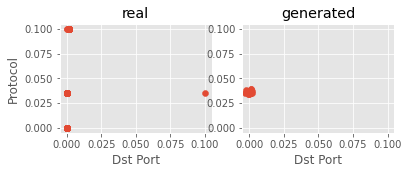

Step: 1900 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9067, 0.1864, 0.3068, 0.9917
D Real - D Gen: 0.1204


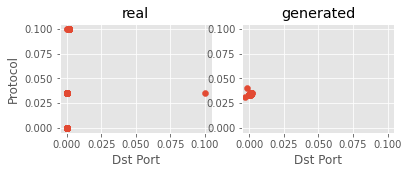

Step: 2000 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8551, 0.1973, 0.3282, 0.9972
D Real - D Gen: 0.1309


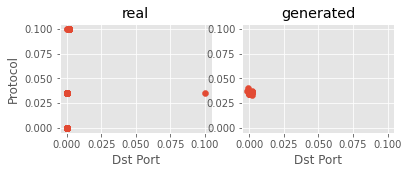

Step: 2100 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9373, 0.1835, 0.2381, 0.9972
D Real - D Gen: 0.0546


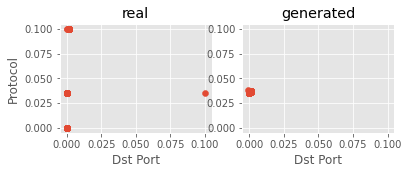

Step: 2200 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8336, 0.1997, 0.3489, 0.9945
D Real - D Gen: 0.1492


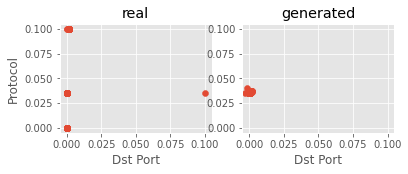

Step: 2300 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8852, 0.1864, 0.3601, 0.9972
D Real - D Gen: 0.1737


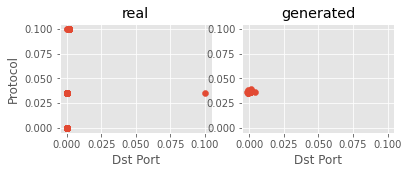

Step: 2400 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.7624, 0.2100, 0.3603, 0.9945
D Real - D Gen: 0.1503


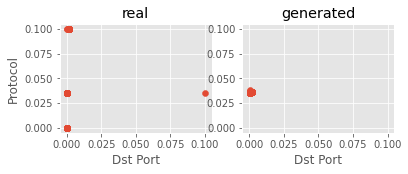

Step: 2500 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8794, 0.1823, 0.4043, 0.9945
D Real - D Gen: 0.2220


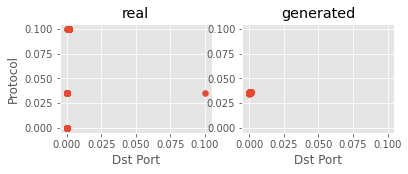

Step: 2600 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8344, 0.1943, 0.3854, 1.0000
D Real - D Gen: 0.1911


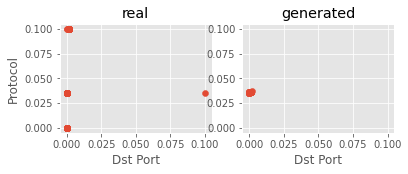

Step: 2700 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9006, 0.1790, 0.3490, 1.0000
D Real - D Gen: 0.1700


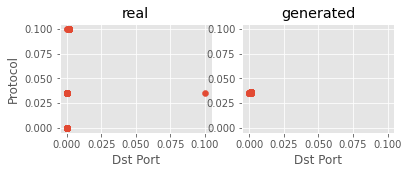

Step: 2800 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8935, 0.1839, 0.2780, 1.0000
D Real - D Gen: 0.0941


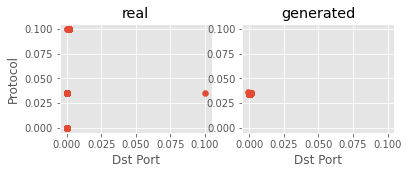

Step: 2900 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8382, 0.1911, 0.3858, 0.9972
D Real - D Gen: 0.1947


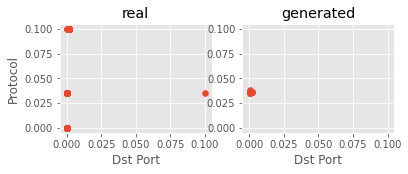

Step: 3000 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8861, 0.1834, 0.2993, 1.0000
D Real - D Gen: 0.1159


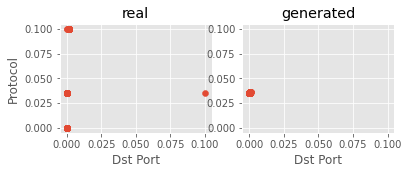

Step: 3100 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8300, 0.1940, 0.3860, 1.0000
D Real - D Gen: 0.1920


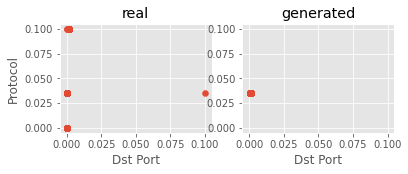

Step: 3200 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9280, 0.1737, 0.3665, 1.0000
D Real - D Gen: 0.1929


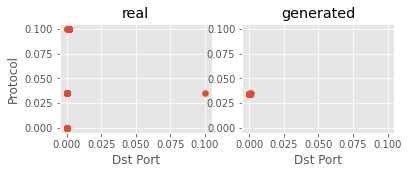

Step: 3300 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8936, 0.1795, 0.3601, 1.0000
D Real - D Gen: 0.1806


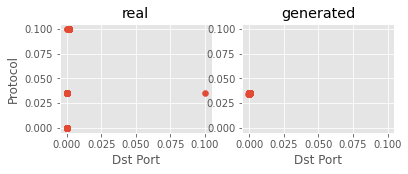

Step: 3400 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.8876, 0.1840, 0.3036, 1.0000
D Real - D Gen: 0.1196


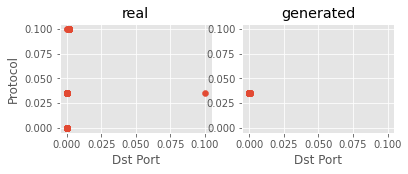

Step: 3500 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9286, 0.1798, 0.2191, 1.0000
D Real - D Gen: 0.0393


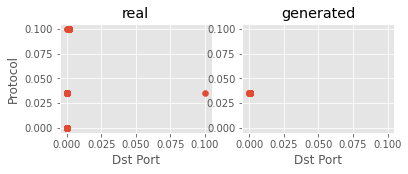

Step: 3600 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9094, 0.1825, 0.2921, 1.0000
D Real - D Gen: 0.1096


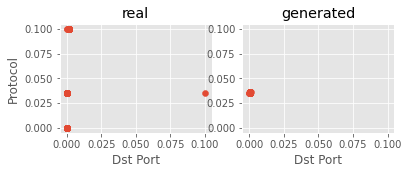

Step: 3700 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9024, 0.1790, 0.3476, 1.0000
D Real - D Gen: 0.1686


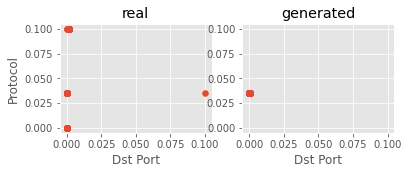

Step: 3800 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9227, 0.1757, 0.3534, 0.9972
D Real - D Gen: 0.1777


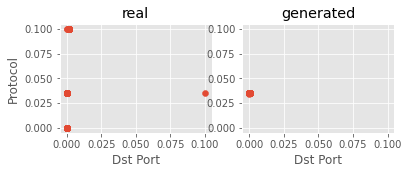

Step: 3900 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9901, 0.1658, 0.2721, 1.0000
D Real - D Gen: 0.1063


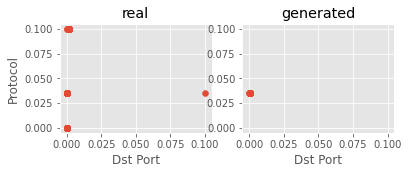

Step: 4000 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0082, 0.1591, 0.3400, 1.0000
D Real - D Gen: 0.1809


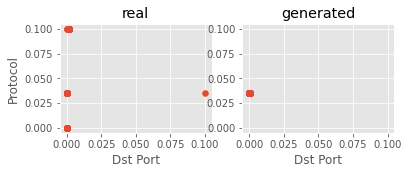

Step: 4100 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9409, 0.1723, 0.3651, 1.0000
D Real - D Gen: 0.1928


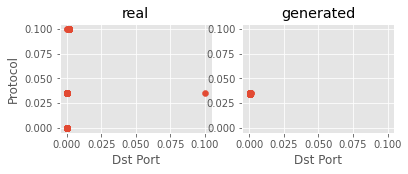

Step: 4200 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9663, 0.1703, 0.3103, 0.9917
D Real - D Gen: 0.1400


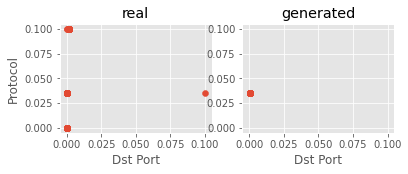

Step: 4300 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0151, 0.1605, 0.3202, 0.9972
D Real - D Gen: 0.1597


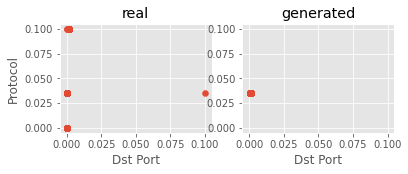

Step: 4400 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9830, 0.1680, 0.2913, 1.0000
D Real - D Gen: 0.1234


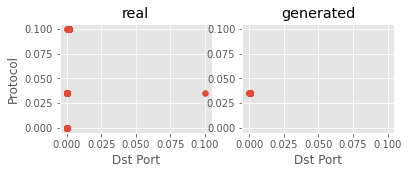

Step: 4500 of 50001.
Losses: G, D Gen, D Real, Xgb: 1.9548, 0.1753, 0.3188, 1.0000
D Real - D Gen: 0.1436


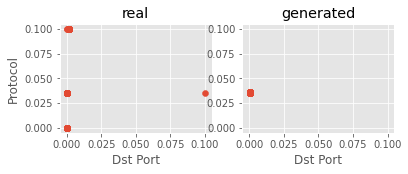

Step: 4600 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0265, 0.1567, 0.3784, 1.0000
D Real - D Gen: 0.2216


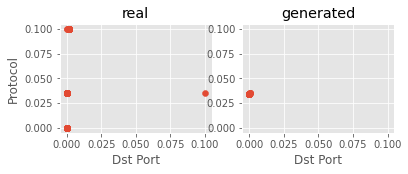

Step: 4700 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0746, 0.1503, 0.3458, 1.0000
D Real - D Gen: 0.1955


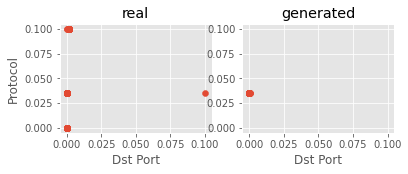

Step: 4800 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0414, 0.1577, 0.3796, 0.9862
D Real - D Gen: 0.2219


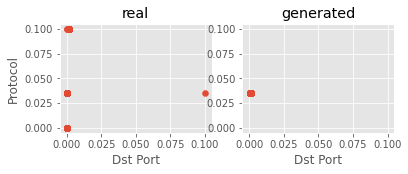

Step: 4900 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.1250, 0.1491, 0.2644, 1.0000
D Real - D Gen: 0.1152


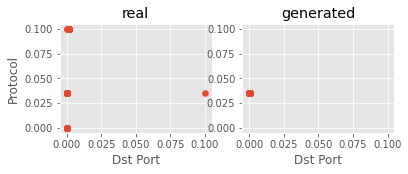

Step: 5000 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0755, 0.1544, 0.2678, 1.0000
D Real - D Gen: 0.1134


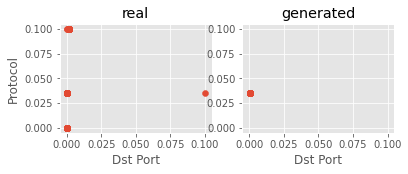

Step: 5100 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0758, 0.1564, 0.2881, 1.0000
D Real - D Gen: 0.1316


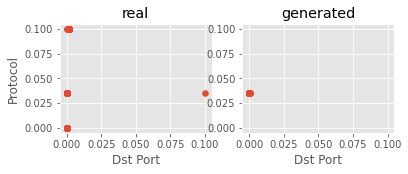

Step: 5200 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.0875, 0.1557, 0.2289, 1.0000
D Real - D Gen: 0.0732


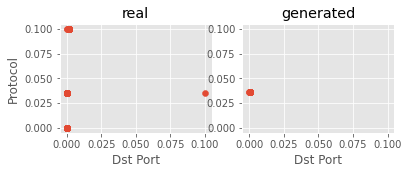

Step: 5300 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.1305, 0.1465, 0.2712, 1.0000
D Real - D Gen: 0.1247


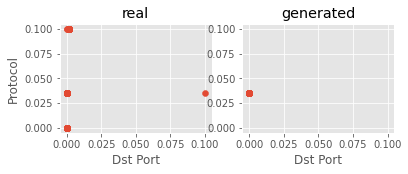

Step: 5400 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.1654, 0.1440, 0.2294, 1.0000
D Real - D Gen: 0.0854


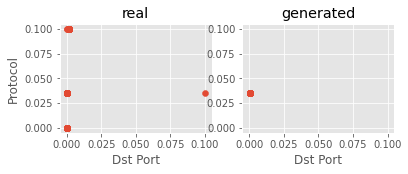

Step: 5500 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.1358, 0.1480, 0.2498, 1.0000
D Real - D Gen: 0.1018


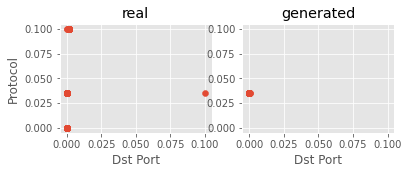

Step: 5600 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.2319, 0.1338, 0.2432, 1.0000
D Real - D Gen: 0.1094


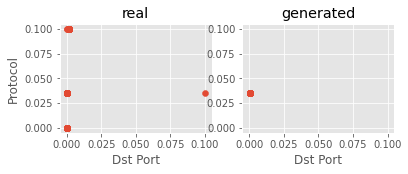

Step: 5700 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.2677, 0.1307, 0.2169, 1.0000
D Real - D Gen: 0.0863


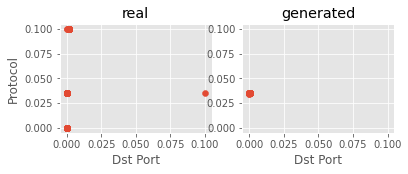

Step: 5800 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.1907, 0.1412, 0.2289, 0.9972
D Real - D Gen: 0.0877


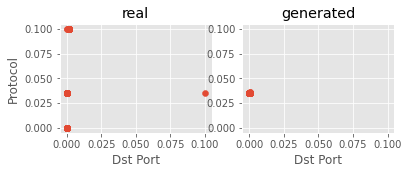

Step: 5900 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.2481, 0.1358, 0.2599, 1.0000
D Real - D Gen: 0.1240


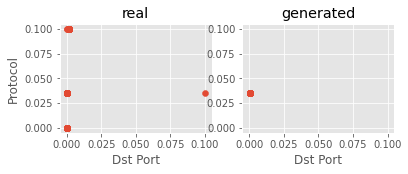

Step: 6000 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.2256, 0.1394, 0.2374, 1.0000
D Real - D Gen: 0.0980


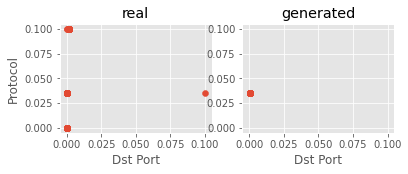

Step: 6100 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.2342, 0.1375, 0.2485, 1.0000
D Real - D Gen: 0.1110


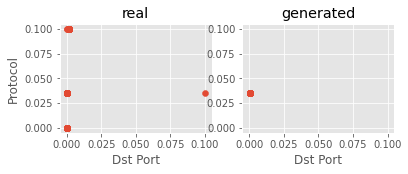

Step: 6200 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.2396, 0.1334, 0.2503, 1.0000
D Real - D Gen: 0.1169


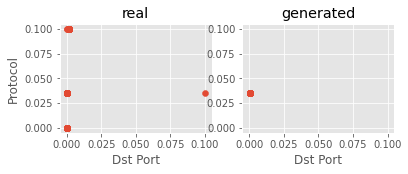

Step: 6300 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.3168, 0.1269, 0.2194, 1.0000
D Real - D Gen: 0.0925


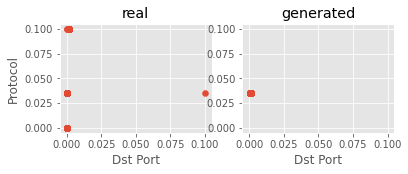

Step: 6400 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.2710, 0.1270, 0.2513, 1.0000
D Real - D Gen: 0.1242


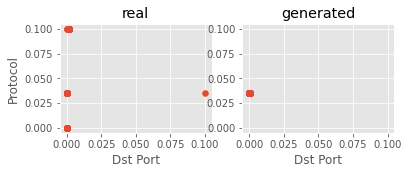

Step: 6500 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.3436, 0.1244, 0.1835, 1.0000
D Real - D Gen: 0.0591


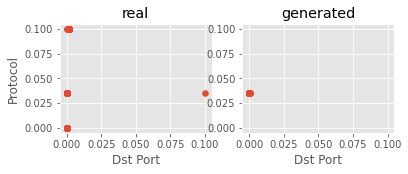

Step: 6600 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.4068, 0.1245, 0.1365, 1.0000
D Real - D Gen: 0.0120


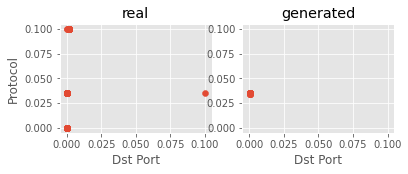

Step: 6700 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.3137, 0.1302, 0.2081, 1.0000
D Real - D Gen: 0.0779


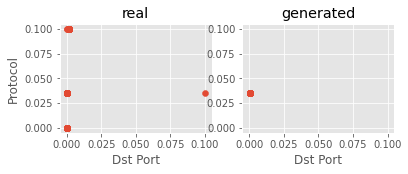

Step: 6800 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.3868, 0.1172, 0.2115, 1.0000
D Real - D Gen: 0.0943


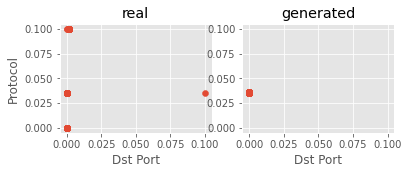

Step: 6900 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.5057, 0.1145, 0.1054, 1.0000
D Real - D Gen: -0.0091


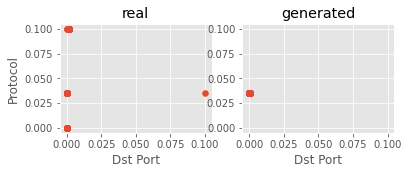

Step: 7000 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.6207, 0.0990, 0.1423, 1.0000
D Real - D Gen: 0.0433


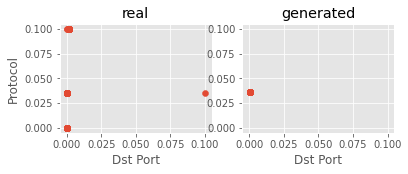

Step: 7100 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.4812, 0.1077, 0.2678, 1.0000
D Real - D Gen: 0.1601


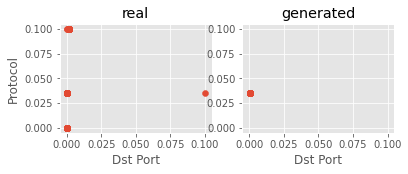

Step: 7200 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.4812, 0.1125, 0.1694, 1.0000
D Real - D Gen: 0.0569


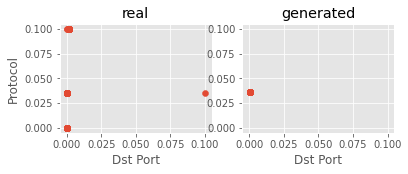

Step: 7300 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.5860, 0.1005, 0.1936, 1.0000
D Real - D Gen: 0.0931


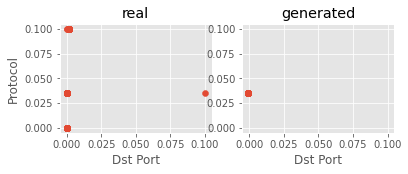

Step: 7400 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.6333, 0.1005, 0.1229, 1.0000
D Real - D Gen: 0.0224


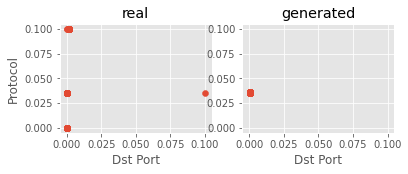

Step: 7500 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.6575, 0.0969, 0.1240, 1.0000
D Real - D Gen: 0.0272


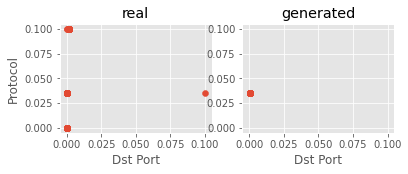

Step: 7600 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.6419, 0.0988, 0.1072, 0.9945
D Real - D Gen: 0.0085


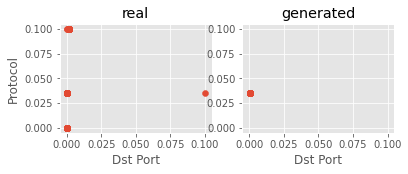

Step: 7700 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.8601, 0.0822, 0.0964, 0.9945
D Real - D Gen: 0.0141


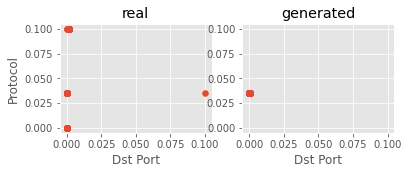

Step: 7800 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.8501, 0.0797, 0.1787, 1.0000
D Real - D Gen: 0.0991


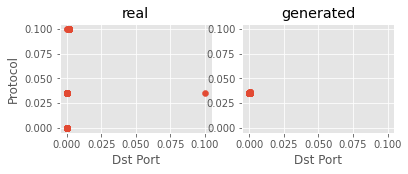

Step: 7900 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.8162, 0.0795, 0.1438, 0.9972
D Real - D Gen: 0.0643


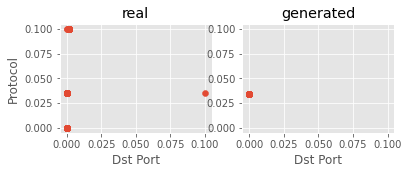

Step: 8000 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.8187, 0.0797, 0.1599, 1.0000
D Real - D Gen: 0.0802


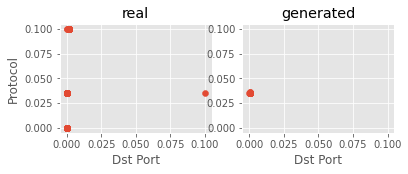

Step: 8100 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.9426, 0.0752, 0.1256, 1.0000
D Real - D Gen: 0.0504


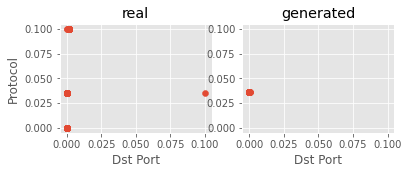

Step: 8200 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.9063, 0.0818, 0.0972, 1.0000
D Real - D Gen: 0.0154


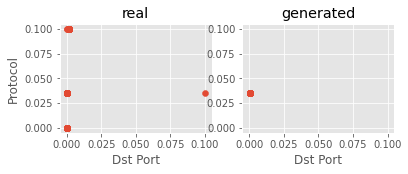

Step: 8300 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.9329, 0.0818, 0.0995, 1.0000
D Real - D Gen: 0.0177


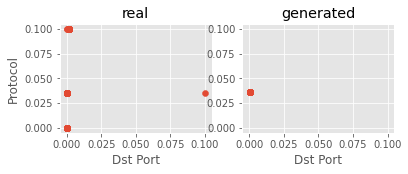

Step: 8400 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.9753, 0.0787, 0.0823, 1.0000
D Real - D Gen: 0.0036


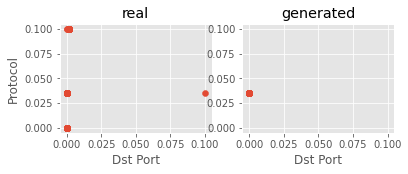

Step: 8500 of 50001.
Losses: G, D Gen, D Real, Xgb: 3.2054, 0.0563, 0.0828, 1.0000
D Real - D Gen: 0.0265


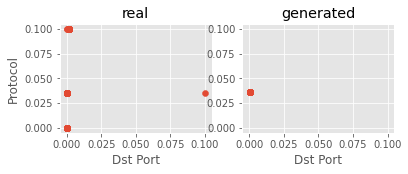

Step: 8600 of 50001.
Losses: G, D Gen, D Real, Xgb: 3.0996, 0.0721, 0.1484, 1.0000
D Real - D Gen: 0.0763


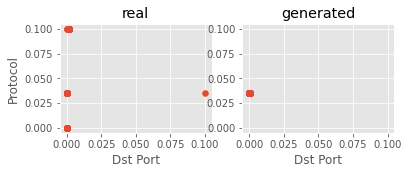

Step: 8700 of 50001.
Losses: G, D Gen, D Real, Xgb: 3.2499, 0.0629, 0.0672, 1.0000
D Real - D Gen: 0.0043


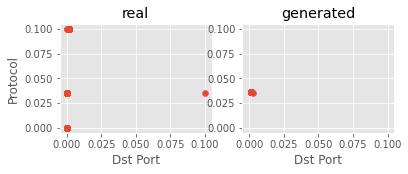

Step: 8800 of 50001.
Losses: G, D Gen, D Real, Xgb: 3.1792, 0.0617, 0.1228, 1.0000
D Real - D Gen: 0.0611


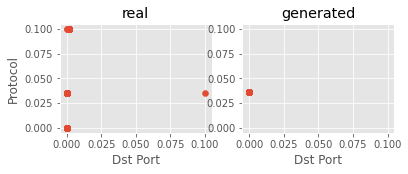

Step: 8900 of 50001.
Losses: G, D Gen, D Real, Xgb: 3.0826, 0.0714, 0.1063, 1.0000
D Real - D Gen: 0.0349


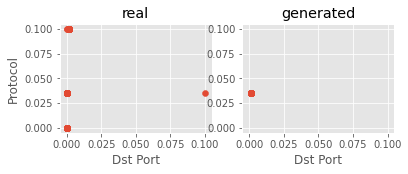

Step: 9000 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.9846, 0.0789, 0.1303, 1.0000
D Real - D Gen: 0.0514


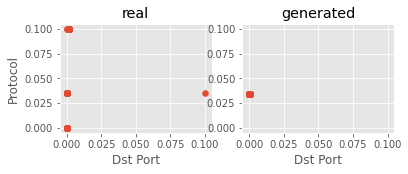

Step: 9100 of 50001.
Losses: G, D Gen, D Real, Xgb: 3.0710, 0.0769, 0.1221, 1.0000
D Real - D Gen: 0.0452


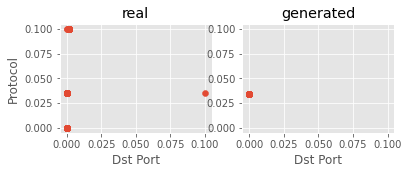

Step: 9200 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.9329, 0.0842, 0.1603, 1.0000
D Real - D Gen: 0.0761


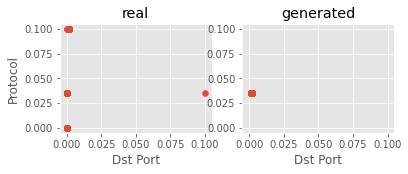

Step: 9300 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.9900, 0.0716, 0.1637, 1.0000
D Real - D Gen: 0.0921


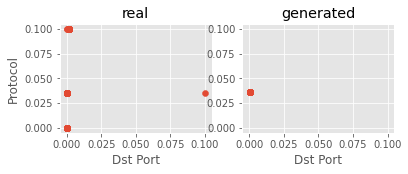

Step: 9400 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.9923, 0.0789, 0.1619, 1.0000
D Real - D Gen: 0.0830


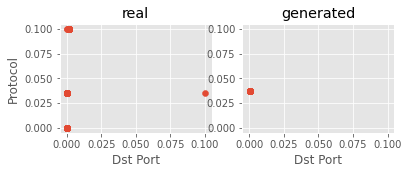

Step: 9500 of 50001.
Losses: G, D Gen, D Real, Xgb: 3.3940, 0.0484, 0.0955, 1.0000
D Real - D Gen: 0.0472


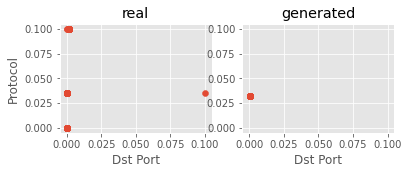

Step: 9600 of 50001.
Losses: G, D Gen, D Real, Xgb: 3.5711, 0.0456, 0.0570, 1.0000
D Real - D Gen: 0.0114


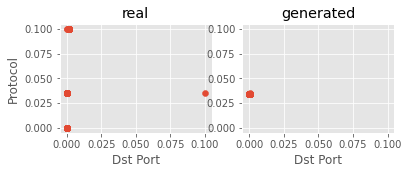

Step: 9700 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.5702, 0.1499, 0.1465, 0.9972
D Real - D Gen: -0.0035


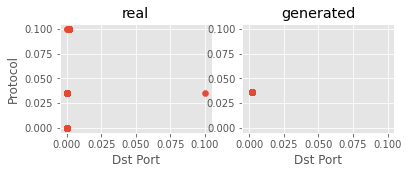

Step: 9800 of 50001.
Losses: G, D Gen, D Real, Xgb: 3.4225, 0.0592, 0.0721, 1.0000
D Real - D Gen: 0.0129


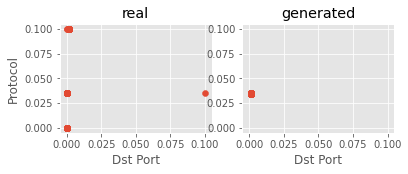

Step: 9900 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.8659, 0.0841, 0.1800, 1.0000
D Real - D Gen: 0.0959


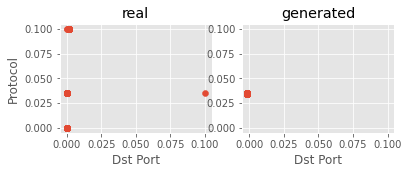

Step: 10000 of 50001.
Losses: G, D Gen, D Real, Xgb: 4.9839, 0.0103, 0.0065, 1.0000
D Real - D Gen: -0.0038


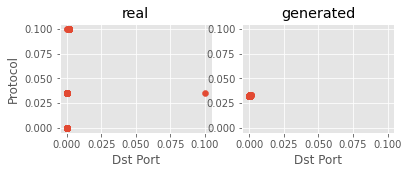

Step: 10100 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.3061, 0.1697, 0.5034, 1.0000
D Real - D Gen: 0.3336


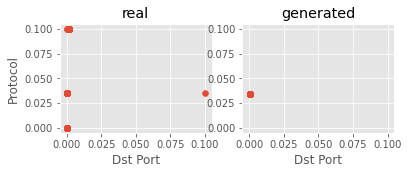

Step: 10200 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.2996, 0.1649, 0.4199, 1.0000
D Real - D Gen: 0.2549


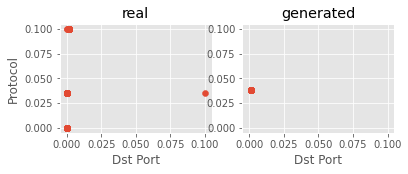

Step: 10300 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.6134, 0.1309, 0.1864, 1.0000
D Real - D Gen: 0.0555


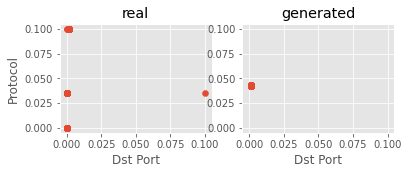

Step: 10400 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.7556, 0.1211, 0.1687, 1.0000
D Real - D Gen: 0.0476


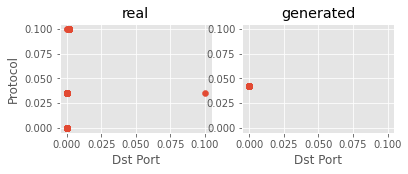

Step: 10500 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.4433, 0.1381, 0.3936, 1.0000
D Real - D Gen: 0.2555


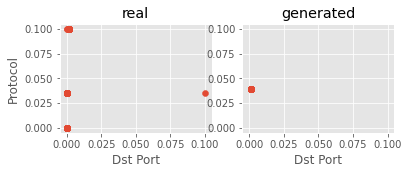

Step: 10600 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.4692, 0.1499, 0.3086, 1.0000
D Real - D Gen: 0.1586


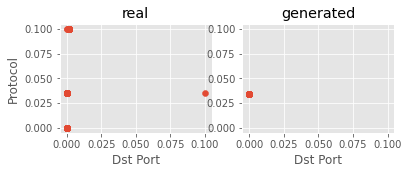

Step: 10700 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.8920, 0.0996, 0.1239, 1.0000
D Real - D Gen: 0.0243


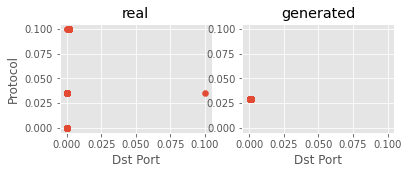

Step: 10800 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.7046, 0.1137, 0.2168, 1.0000
D Real - D Gen: 0.1031


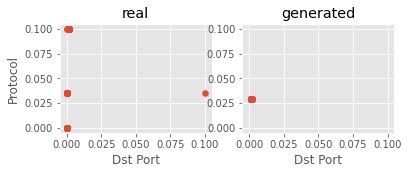

Step: 10900 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.3839, 0.1535, 0.3456, 1.0000
D Real - D Gen: 0.1921


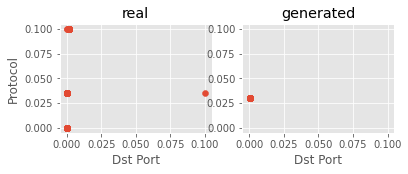

Step: 11000 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.8533, 0.0994, 0.2060, 1.0000
D Real - D Gen: 0.1066


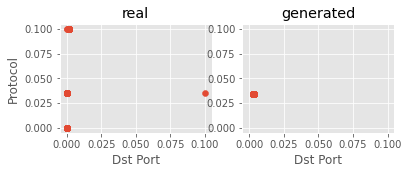

Step: 11100 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.6521, 0.1174, 0.2473, 1.0000
D Real - D Gen: 0.1299


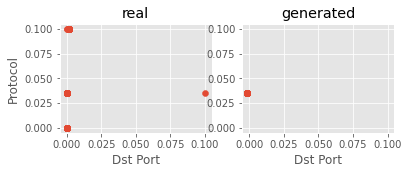

Step: 11200 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.4984, 0.1518, 0.2332, 0.9972
D Real - D Gen: 0.0814


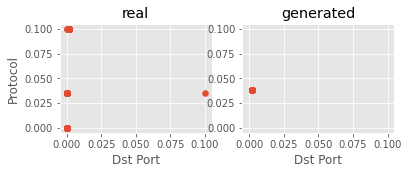

Step: 11300 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.7407, 0.1123, 0.2109, 1.0000
D Real - D Gen: 0.0986


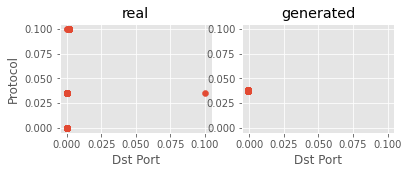

Step: 11400 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.6941, 0.1313, 0.1883, 1.0000
D Real - D Gen: 0.0570


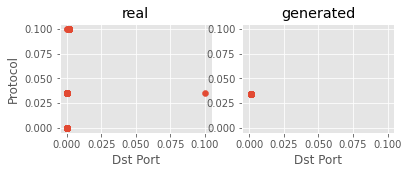

Step: 11500 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.7482, 0.1121, 0.2162, 1.0000
D Real - D Gen: 0.1040


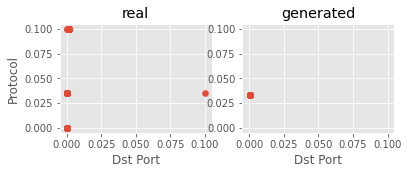

Step: 11600 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.7281, 0.1231, 0.1721, 1.0000
D Real - D Gen: 0.0491


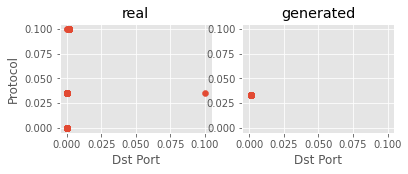

Step: 11700 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.9238, 0.0938, 0.1480, 1.0000
D Real - D Gen: 0.0542


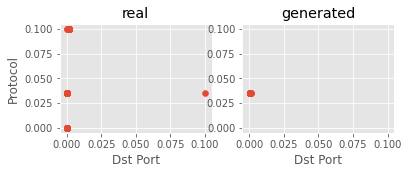

Step: 11800 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.5641, 0.1149, 0.3513, 1.0000
D Real - D Gen: 0.2364


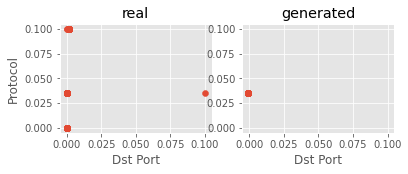

Step: 11900 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.7285, 0.1116, 0.1988, 1.0000
D Real - D Gen: 0.0872


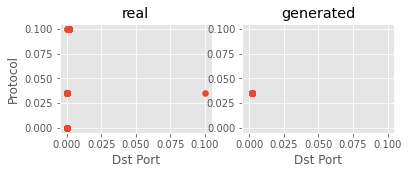

Step: 12000 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.5509, 0.1427, 0.3120, 1.0000
D Real - D Gen: 0.1693


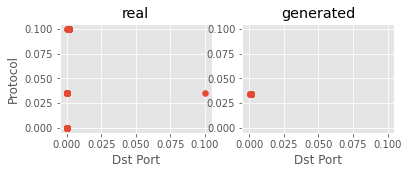

Step: 12100 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.6045, 0.1260, 0.3004, 1.0000
D Real - D Gen: 0.1745


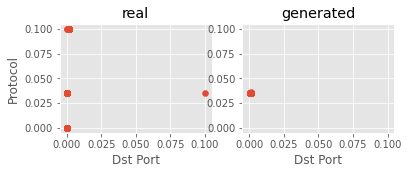

Step: 12200 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.4469, 0.1579, 0.3563, 1.0000
D Real - D Gen: 0.1984


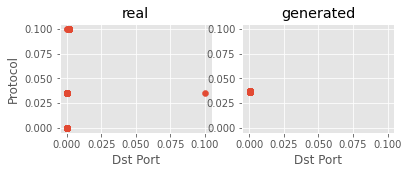

Step: 12300 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.6671, 0.1263, 0.2348, 1.0000
D Real - D Gen: 0.1085


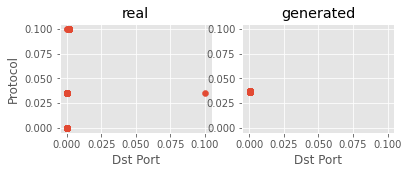

Step: 12400 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.6912, 0.1330, 0.2616, 0.9945
D Real - D Gen: 0.1286


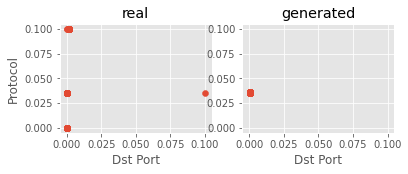

Step: 12500 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.7866, 0.1098, 0.2186, 0.9972
D Real - D Gen: 0.1088


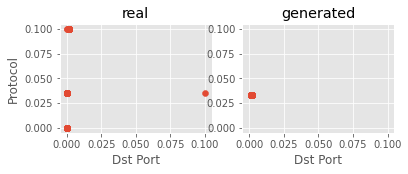

Step: 12600 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.7975, 0.0948, 0.2693, 1.0000
D Real - D Gen: 0.1745


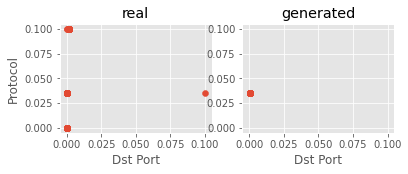

Step: 12700 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.5927, 0.1346, 0.2892, 1.0000
D Real - D Gen: 0.1546


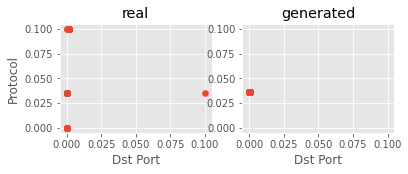

Step: 12800 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.9478, 0.0873, 0.1999, 1.0000
D Real - D Gen: 0.1126


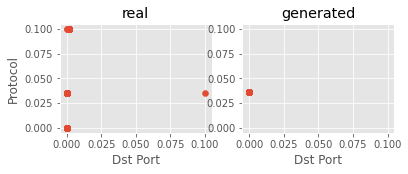

Step: 12900 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.7392, 0.1257, 0.2005, 1.0000
D Real - D Gen: 0.0749


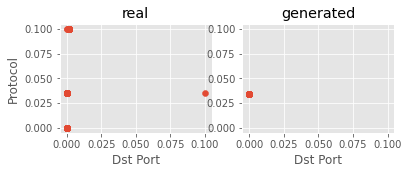

Step: 13000 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.7884, 0.1206, 0.2264, 1.0000
D Real - D Gen: 0.1057


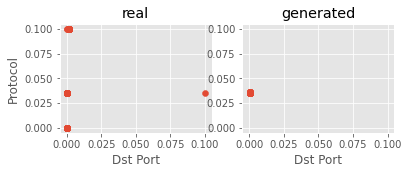

Step: 13100 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.8268, 0.1148, 0.1759, 1.0000
D Real - D Gen: 0.0612


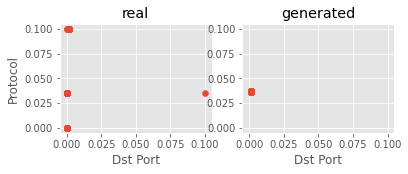

Step: 13200 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.5600, 0.1379, 0.3276, 1.0000
D Real - D Gen: 0.1897


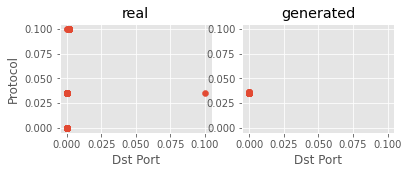

Step: 13300 of 50001.
Losses: G, D Gen, D Real, Xgb: 2.9507, 0.1018, 0.1794, 1.0000
D Real - D Gen: 0.0777


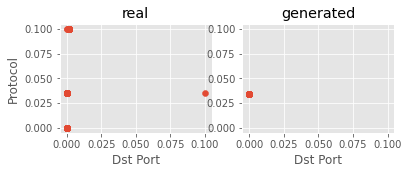

Step: 13400 of 50001.
Losses: G, D Gen, D Real, Xgb: 3.5097, 0.1474, 0.1722, 1.0000
D Real - D Gen: 0.0247


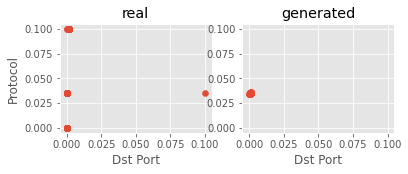

Step: 13500 of 50001.
Losses: G, D Gen, D Real, Xgb: 7.2297, 0.0045, 0.0045, 1.0000
D Real - D Gen: 0.0000


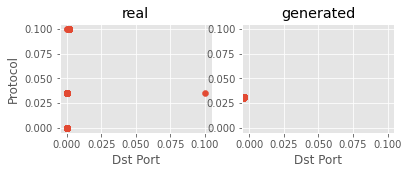

Step: 13600 of 50001.
Losses: G, D Gen, D Real, Xgb: 7.8822, 0.0039, 0.0046, 1.0000
D Real - D Gen: 0.0007


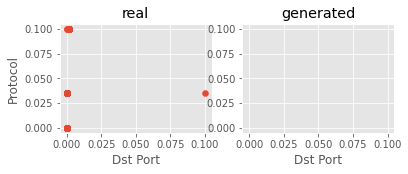

Step: 13700 of 50001.
Losses: G, D Gen, D Real, Xgb: 7.9678, 0.0045, 0.0045, 1.0000
D Real - D Gen: 0.0001


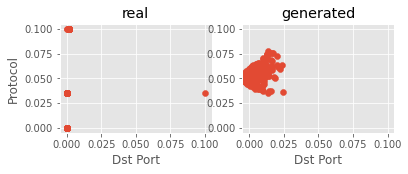

Step: 13800 of 50001.
Losses: G, D Gen, D Real, Xgb: 7.4431, 0.0045, 0.0050, 1.0000
D Real - D Gen: 0.0005


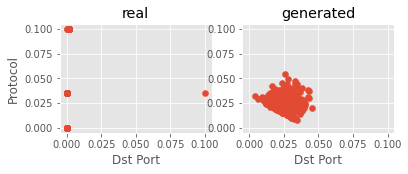

Step: 13900 of 50001.
Losses: G, D Gen, D Real, Xgb: 7.4151, 0.0046, 0.0046, 1.0000
D Real - D Gen: -0.0000


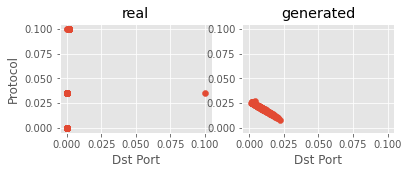

Step: 14000 of 50001.
Losses: G, D Gen, D Real, Xgb: 7.4019, 0.0044, 0.0043, 1.0000
D Real - D Gen: -0.0001


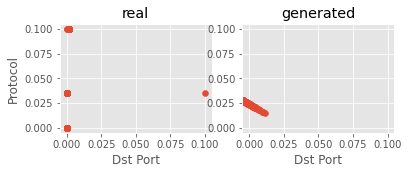

Step: 14100 of 50001.
Losses: G, D Gen, D Real, Xgb: 7.5678, 0.0045, 0.0042, 0.9945
D Real - D Gen: -0.0003


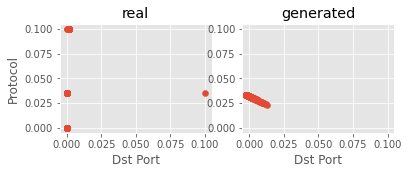

Step: 14200 of 50001.
Losses: G, D Gen, D Real, Xgb: 7.4581, 0.0040, 0.0045, 0.9972
D Real - D Gen: 0.0005


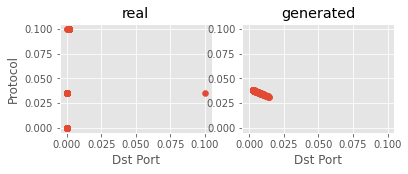

In [ ]:
%%time

# Training the vanilla GAN and CGAN architectures

k_d = 1  # number of critic network updates per adversarial training step
learning_rate = 5e-5 # 5e-5
arguments = [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ]

adversarial_training_GAN(arguments, train_no_label, data_cols ) # GAN
#adversarial_training_GAN(arguments, train, data_cols=data_cols, label_cols=label_cols ) # CGAN

data_dim:  79
data_cols:  ['Dst Port', 'Protocol', 'Timestamp', 'Flow Duration', 'Tot Fwd Pkts', 'Tot Bwd Pkts', 'TotLen Fwd Pkts', 'TotLen Bwd Pkts', 'Fwd Pkt Len Max', 'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std', 'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean', 'Bwd Pkt Len Std', 'Flow Byts/s', 'Flow Pkts/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Len', 'Bwd Header Len', 'Fwd Pkts/s', 'Bwd Pkts/s', 'Pkt Len Min', 'Pkt Len Max', 'Pkt Len Mean', 'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt', 'SYN Flag Cnt', 'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'URG Flag Cnt', 'CWE Flag Count', 'ECE Flag Cnt', 'Down/Up Ratio', 'Pkt Size Avg', 'Fwd Seg Size Avg', 'Bwd Seg Size Avg', 'Fwd Byts/b Avg', 'Fwd Pkts/b Avg', '

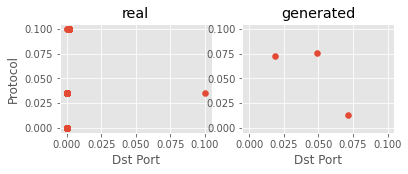

Step: 100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0026, 0.0088, 0.0380, 0.9945
D Real - D Gen: 0.0291


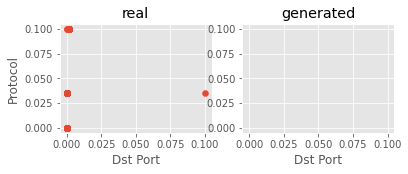

Step: 200 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.0031, -0.0020, 0.0461, 1.0000
D Real - D Gen: 0.0481


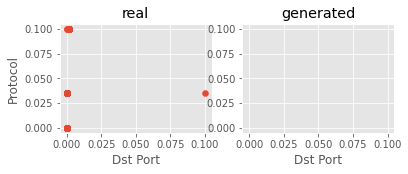

Step: 300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0251, 0.0248, 0.0624, 0.9972
D Real - D Gen: 0.0376


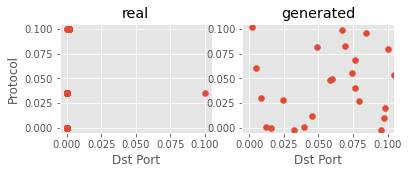

Step: 400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0401, 0.0378, 0.0746, 1.0000
D Real - D Gen: 0.0368


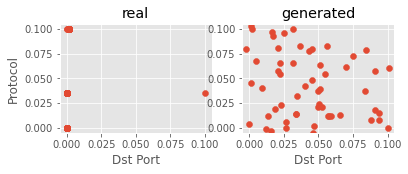

Step: 500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0589, 0.0588, 0.0835, 1.0000
D Real - D Gen: 0.0248


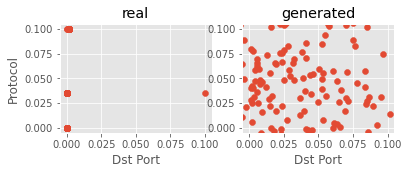

Step: 600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0681, 0.0678, 0.0862, 1.0000
D Real - D Gen: 0.0184


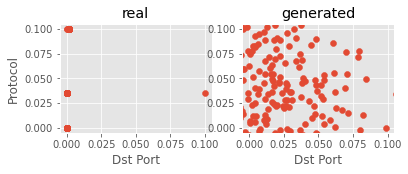

Step: 700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0738, 0.0736, 0.0882, 0.9972
D Real - D Gen: 0.0146


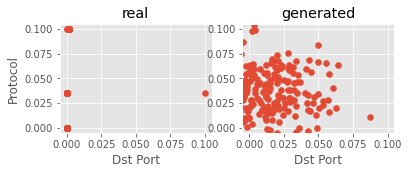

Step: 800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0751, 0.0749, 0.0878, 0.9862
D Real - D Gen: 0.0129


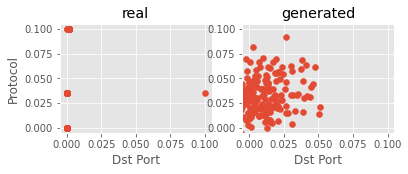

Step: 900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0733, 0.0731, 0.0882, 1.0000
D Real - D Gen: 0.0150


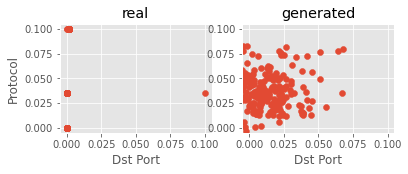

Step: 1000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0725, 0.0726, 0.0867, 0.9862
D Real - D Gen: 0.0142


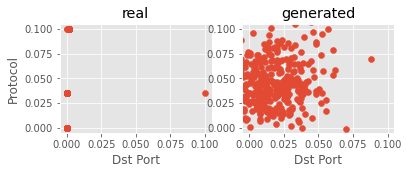

Step: 1100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0726, 0.0723, 0.0854, 1.0000
D Real - D Gen: 0.0131


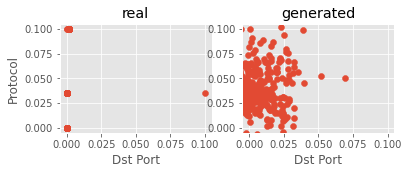

Step: 1200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0716, 0.0713, 0.0843, 1.0000
D Real - D Gen: 0.0130


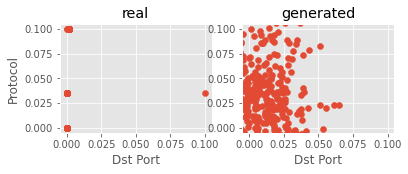

Step: 1300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0734, 0.0733, 0.0863, 0.9890
D Real - D Gen: 0.0130


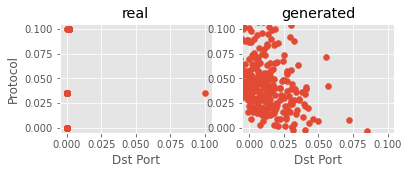

Step: 1400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0729, 0.0850, 1.0000
D Real - D Gen: 0.0121


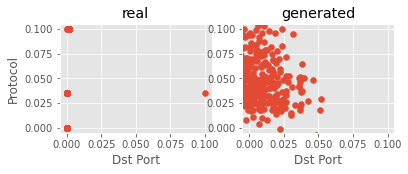

Step: 1500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0725, 0.0725, 0.0842, 1.0000
D Real - D Gen: 0.0117


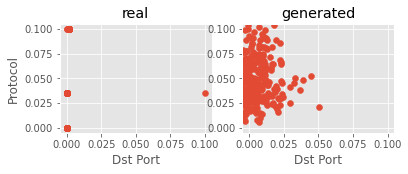

Step: 1600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0731, 0.0726, 0.0836, 0.9972
D Real - D Gen: 0.0110


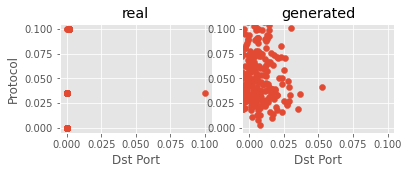

Step: 1700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0720, 0.0717, 0.0825, 0.9972
D Real - D Gen: 0.0108


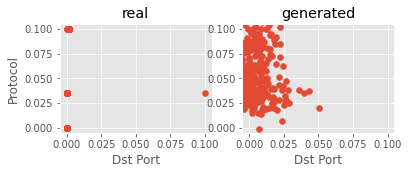

Step: 1800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0698, 0.0701, 0.0813, 0.9945
D Real - D Gen: 0.0112


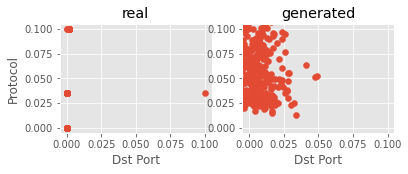

Step: 1900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0713, 0.0708, 0.0815, 0.9972
D Real - D Gen: 0.0108


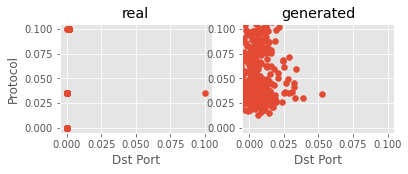

Step: 2000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0696, 0.0804, 1.0000
D Real - D Gen: 0.0109


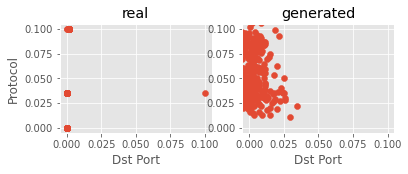

Step: 2100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0696, 0.0688, 0.0804, 1.0000
D Real - D Gen: 0.0116


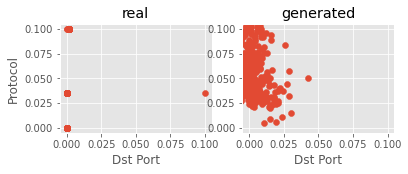

Step: 2200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0691, 0.0697, 0.0794, 0.9972
D Real - D Gen: 0.0097


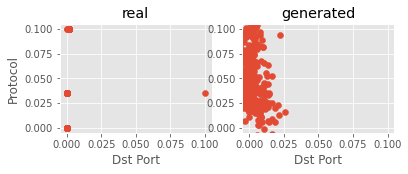

Step: 2300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0706, 0.0808, 0.9862
D Real - D Gen: 0.0103


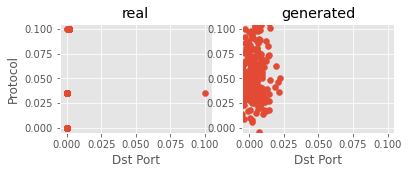

Step: 2400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0712, 0.0811, 1.0000
D Real - D Gen: 0.0099


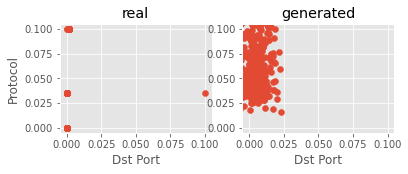

Step: 2500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0700, 0.0702, 0.0802, 0.9972
D Real - D Gen: 0.0100


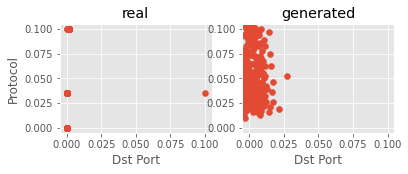

Step: 2600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0714, 0.0812, 1.0000
D Real - D Gen: 0.0098


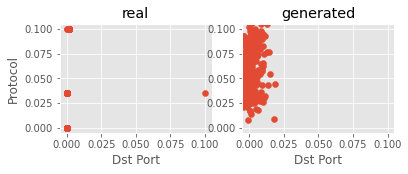

Step: 2700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0702, 0.0813, 0.9972
D Real - D Gen: 0.0110


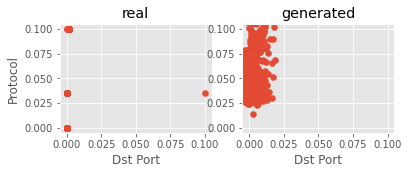

Step: 2800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0722, 0.0718, 0.0821, 0.9972
D Real - D Gen: 0.0103


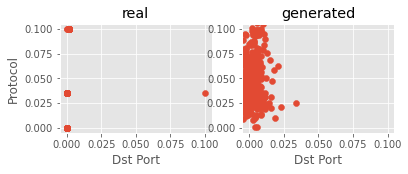

Step: 2900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0708, 0.0714, 0.0809, 0.9945
D Real - D Gen: 0.0095


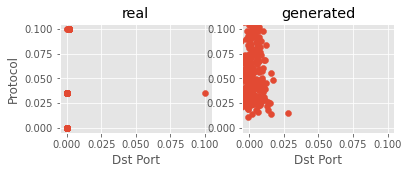

Step: 3000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0690, 0.0698, 0.0803, 1.0000
D Real - D Gen: 0.0105


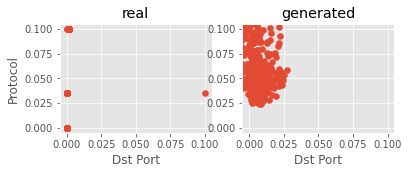

Step: 3100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0695, 0.0700, 0.0793, 0.9972
D Real - D Gen: 0.0093


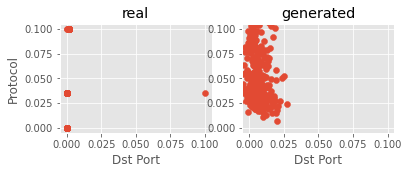

Step: 3200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0701, 0.0805, 1.0000
D Real - D Gen: 0.0104


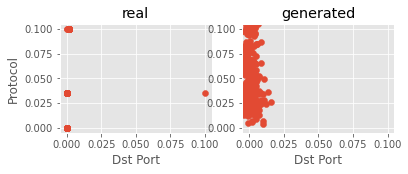

Step: 3300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0714, 0.0813, 1.0000
D Real - D Gen: 0.0099


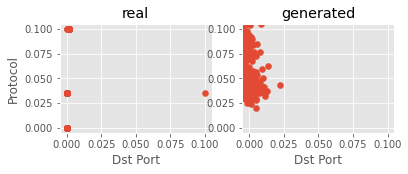

Step: 3400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0704, 0.0694, 0.0792, 1.0000
D Real - D Gen: 0.0098


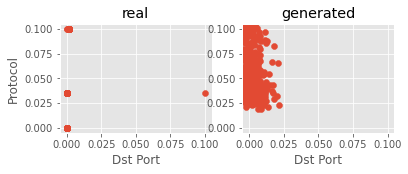

Step: 3500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0708, 0.0704, 0.0811, 1.0000
D Real - D Gen: 0.0107


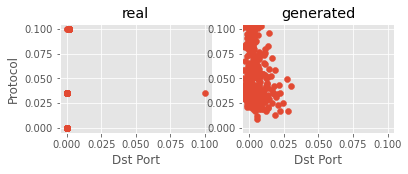

Step: 3600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0709, 0.0806, 1.0000
D Real - D Gen: 0.0097


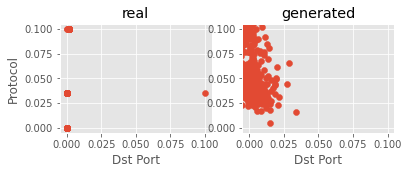

Step: 3700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0717, 0.0811, 0.9972
D Real - D Gen: 0.0094


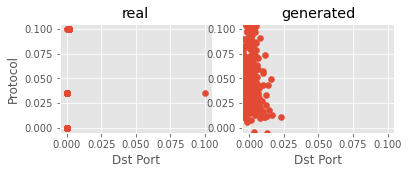

Step: 3800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0726, 0.0716, 0.0812, 1.0000
D Real - D Gen: 0.0096


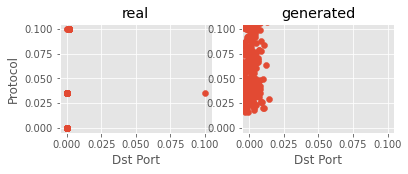

Step: 3900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0725, 0.0712, 0.0808, 1.0000
D Real - D Gen: 0.0095


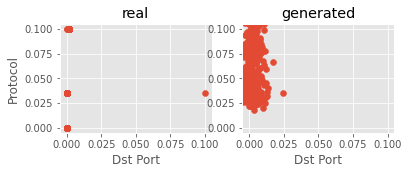

Step: 4000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0735, 0.0725, 0.0812, 0.9945
D Real - D Gen: 0.0087


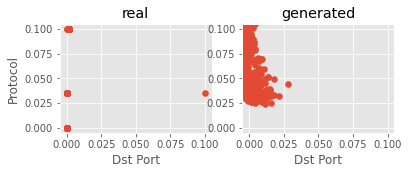

Step: 4100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0722, 0.0804, 1.0000
D Real - D Gen: 0.0082


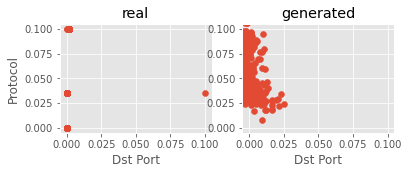

Step: 4200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0726, 0.0725, 0.0813, 1.0000
D Real - D Gen: 0.0088


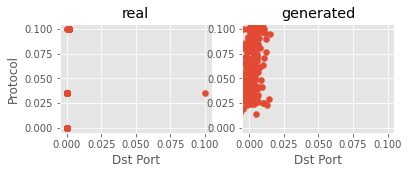

Step: 4300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0714, 0.0795, 1.0000
D Real - D Gen: 0.0081


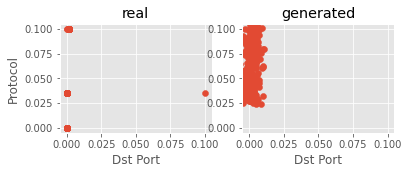

Step: 4400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0714, 0.0796, 0.9890
D Real - D Gen: 0.0082


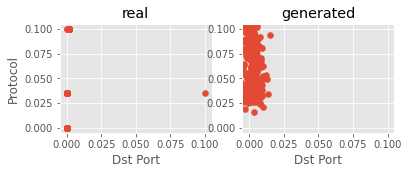

Step: 4500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0721, 0.0803, 1.0000
D Real - D Gen: 0.0081


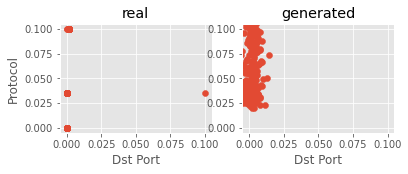

Step: 4600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0728, 0.0722, 0.0791, 0.9945
D Real - D Gen: 0.0069


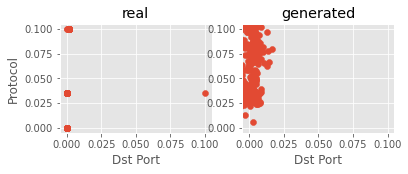

Step: 4700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0720, 0.0716, 0.0797, 0.9972
D Real - D Gen: 0.0081


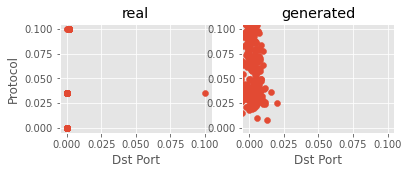

Step: 4800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0725, 0.0723, 0.0795, 0.9972
D Real - D Gen: 0.0072


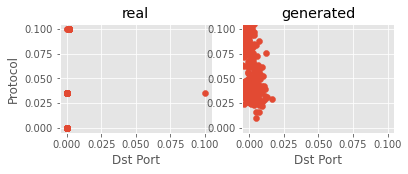

Step: 4900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0707, 0.0787, 1.0000
D Real - D Gen: 0.0080


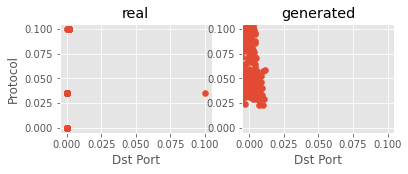

Step: 5000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0704, 0.0785, 1.0000
D Real - D Gen: 0.0081


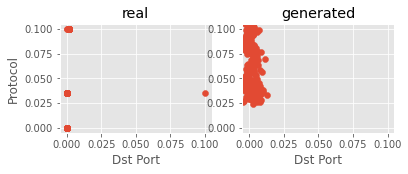

Step: 5100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0719, 0.0790, 1.0000
D Real - D Gen: 0.0071


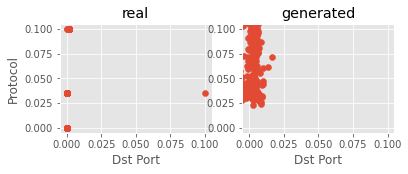

Step: 5200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0722, 0.0720, 0.0795, 0.9972
D Real - D Gen: 0.0075


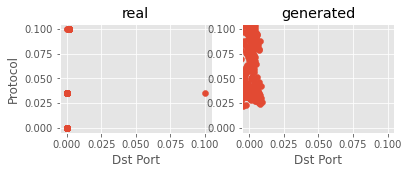

Step: 5300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0722, 0.0789, 0.9945
D Real - D Gen: 0.0067


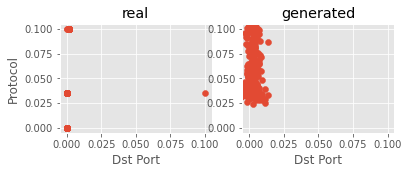

Step: 5400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0728, 0.0733, 0.0807, 1.0000
D Real - D Gen: 0.0073


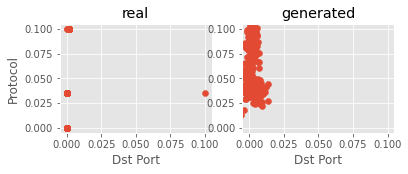

Step: 5500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0724, 0.0729, 0.0804, 0.9945
D Real - D Gen: 0.0075


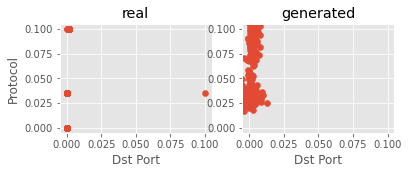

Step: 5600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0743, 0.0727, 0.0802, 0.9945
D Real - D Gen: 0.0075


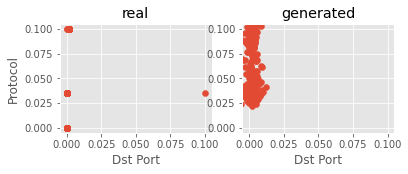

Step: 5700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0728, 0.0731, 0.0795, 1.0000
D Real - D Gen: 0.0064


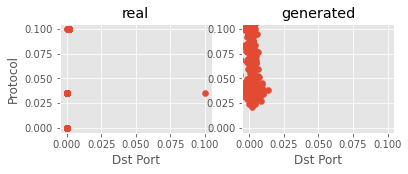

Step: 5800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0740, 0.0729, 0.0804, 1.0000
D Real - D Gen: 0.0075


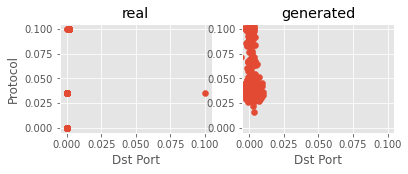

Step: 5900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0729, 0.0731, 0.0795, 0.9972
D Real - D Gen: 0.0064


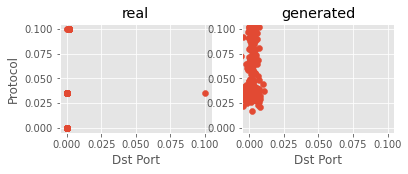

Step: 6000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0736, 0.0726, 0.0793, 0.9972
D Real - D Gen: 0.0066


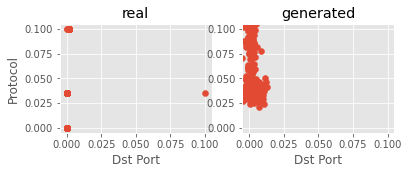

Step: 6100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0740, 0.0737, 0.0797, 1.0000
D Real - D Gen: 0.0060


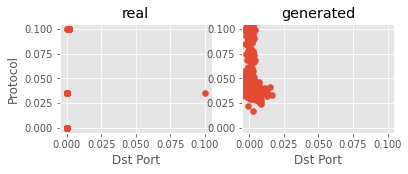

Step: 6200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0728, 0.0732, 0.0792, 0.9945
D Real - D Gen: 0.0060


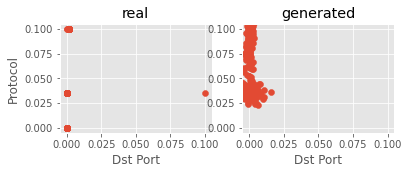

Step: 6300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0735, 0.0734, 0.0803, 1.0000
D Real - D Gen: 0.0069


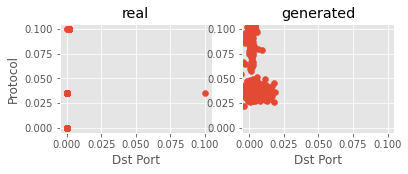

Step: 6400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0739, 0.0726, 0.0791, 0.9972
D Real - D Gen: 0.0065


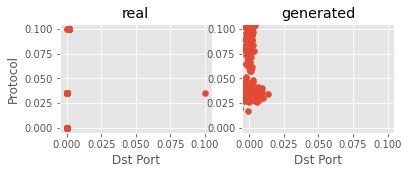

Step: 6500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0717, 0.0729, 0.0788, 0.9945
D Real - D Gen: 0.0059


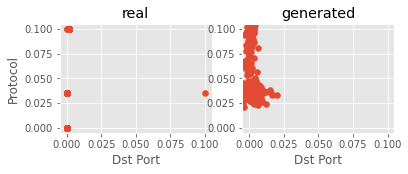

Step: 6600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0735, 0.0736, 0.0800, 1.0000
D Real - D Gen: 0.0064


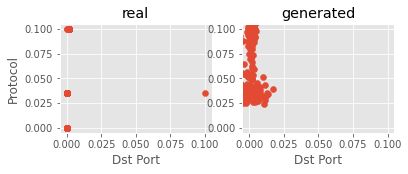

Step: 6700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0740, 0.0736, 0.0797, 0.9890
D Real - D Gen: 0.0061


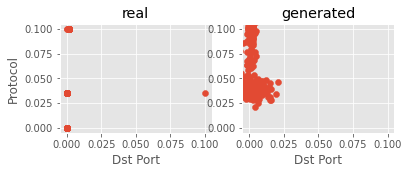

Step: 6800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0740, 0.0742, 0.0800, 1.0000
D Real - D Gen: 0.0058


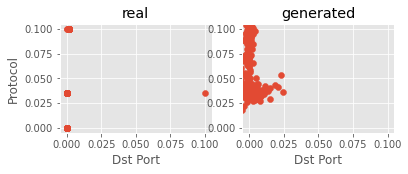

Step: 6900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0746, 0.0746, 0.0797, 0.9945
D Real - D Gen: 0.0052


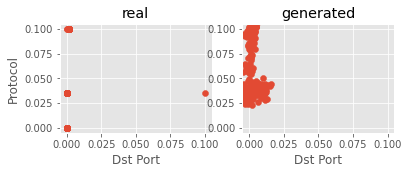

Step: 7000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0746, 0.0737, 0.0804, 1.0000
D Real - D Gen: 0.0067


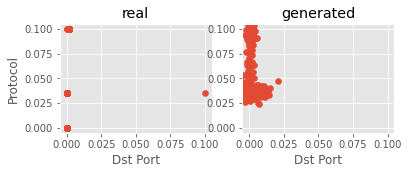

Step: 7100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0732, 0.0743, 0.0785, 1.0000
D Real - D Gen: 0.0042


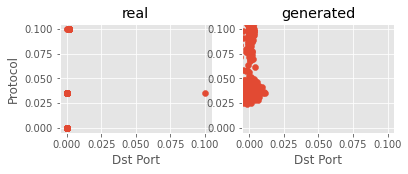

Step: 7200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0738, 0.0740, 0.0796, 1.0000
D Real - D Gen: 0.0056


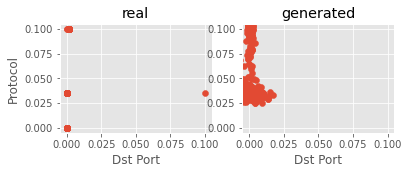

Step: 7300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0736, 0.0737, 0.0787, 0.9917
D Real - D Gen: 0.0050


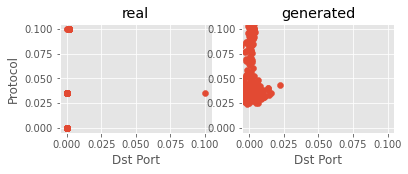

Step: 7400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0745, 0.0750, 0.0800, 1.0000
D Real - D Gen: 0.0050


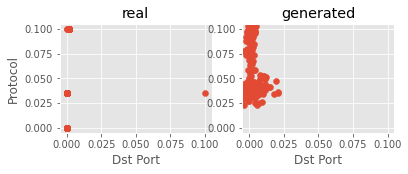

Step: 7500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0738, 0.0738, 0.0787, 1.0000
D Real - D Gen: 0.0049


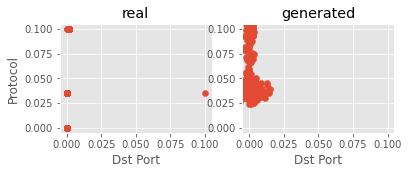

Step: 7600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0751, 0.0745, 0.0800, 1.0000
D Real - D Gen: 0.0055


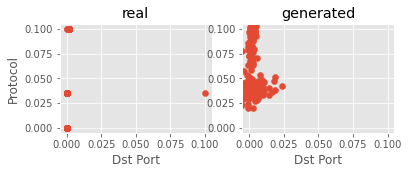

Step: 7700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0750, 0.0754, 0.0807, 0.9972
D Real - D Gen: 0.0053


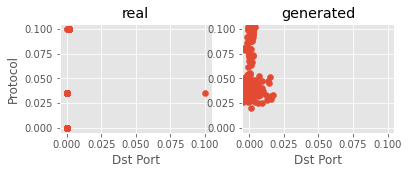

Step: 7800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0753, 0.0753, 0.0803, 0.9945
D Real - D Gen: 0.0050


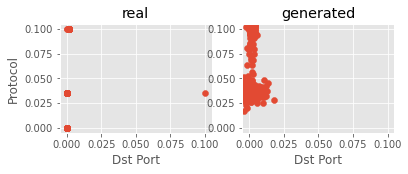

Step: 7900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0739, 0.0736, 0.0789, 1.0000
D Real - D Gen: 0.0053


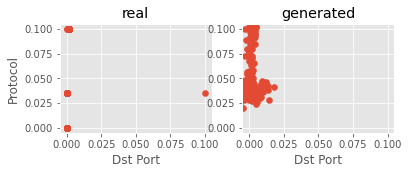

Step: 8000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0752, 0.0752, 0.0795, 1.0000
D Real - D Gen: 0.0043


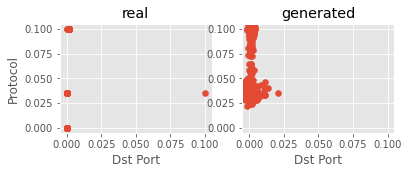

Step: 8100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0743, 0.0744, 0.0791, 0.9890
D Real - D Gen: 0.0047


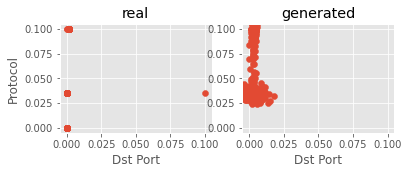

Step: 8200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0741, 0.0739, 0.0786, 1.0000
D Real - D Gen: 0.0046


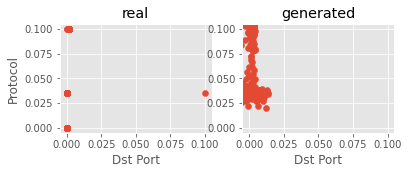

Step: 8300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0742, 0.0748, 0.0794, 0.9972
D Real - D Gen: 0.0046


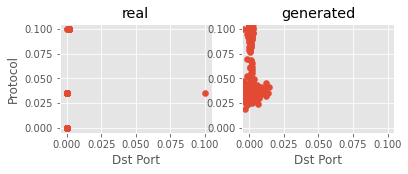

Step: 8400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0742, 0.0740, 0.0783, 1.0000
D Real - D Gen: 0.0043


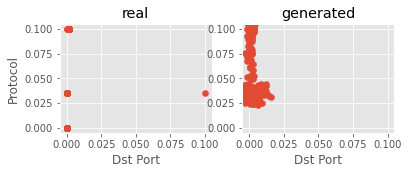

Step: 8500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0733, 0.0738, 0.0781, 1.0000
D Real - D Gen: 0.0043


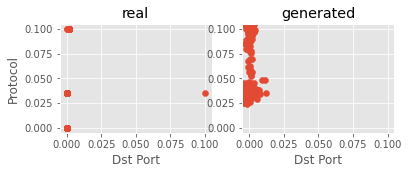

Step: 8600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0728, 0.0731, 0.0776, 0.9945
D Real - D Gen: 0.0045


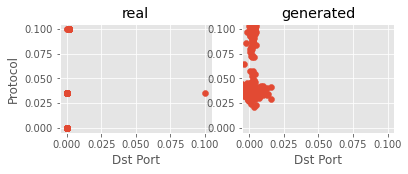

Step: 8700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0742, 0.0743, 0.0786, 1.0000
D Real - D Gen: 0.0043


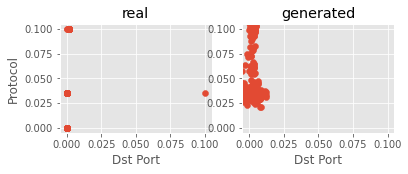

Step: 8800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0751, 0.0753, 0.0798, 0.9972
D Real - D Gen: 0.0045


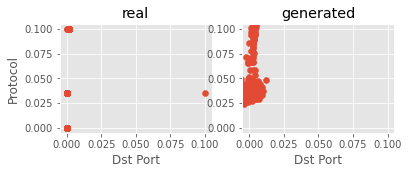

Step: 8900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0741, 0.0743, 0.0786, 0.9972
D Real - D Gen: 0.0043


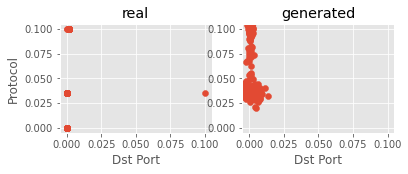

Step: 9000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0747, 0.0756, 0.0798, 0.9972
D Real - D Gen: 0.0041


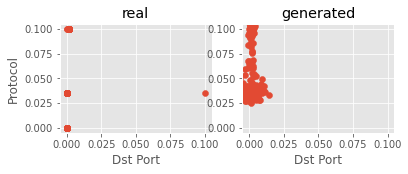

Step: 9100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0748, 0.0744, 0.0790, 0.9945
D Real - D Gen: 0.0046


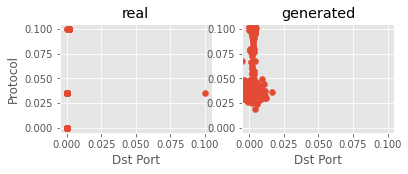

Step: 9200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0747, 0.0742, 0.0792, 0.9945
D Real - D Gen: 0.0049


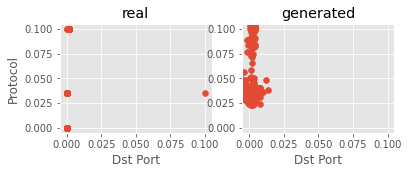

Step: 9300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0750, 0.0752, 0.0794, 1.0000
D Real - D Gen: 0.0042


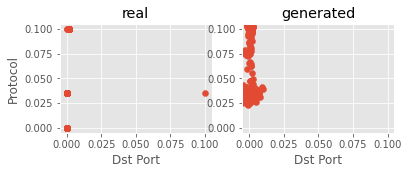

Step: 9400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0748, 0.0747, 0.0795, 0.9972
D Real - D Gen: 0.0049


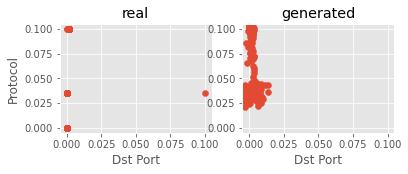

Step: 9500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0750, 0.0752, 0.0788, 1.0000
D Real - D Gen: 0.0036


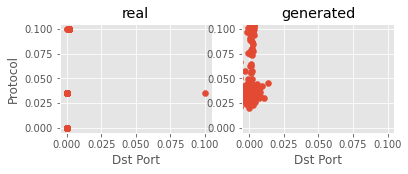

Step: 9600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0756, 0.0753, 0.0794, 0.9972
D Real - D Gen: 0.0041


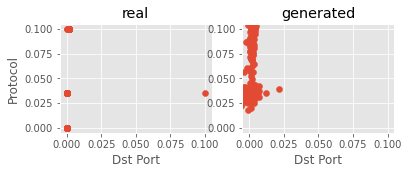

Step: 9700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0752, 0.0752, 0.0791, 1.0000
D Real - D Gen: 0.0040


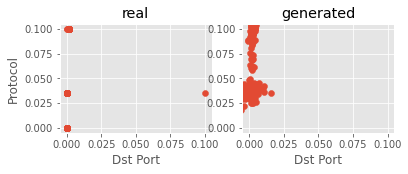

Step: 9800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0751, 0.0758, 0.0791, 1.0000
D Real - D Gen: 0.0033


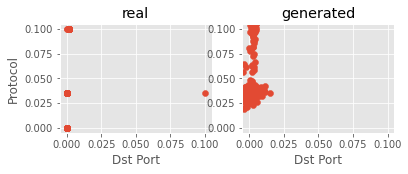

Step: 9900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0766, 0.0765, 0.0808, 1.0000
D Real - D Gen: 0.0043


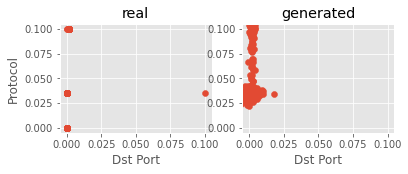

Step: 10000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0761, 0.0760, 0.0800, 1.0000
D Real - D Gen: 0.0040


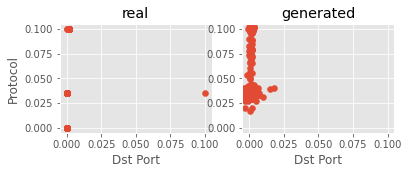

Step: 10100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0751, 0.0753, 0.0793, 0.9945
D Real - D Gen: 0.0040


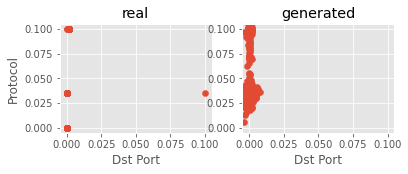

Step: 10200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0757, 0.0754, 0.0794, 0.9972
D Real - D Gen: 0.0040


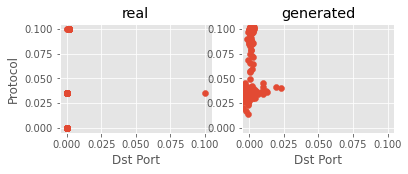

Step: 10300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0747, 0.0748, 0.0782, 0.9972
D Real - D Gen: 0.0034


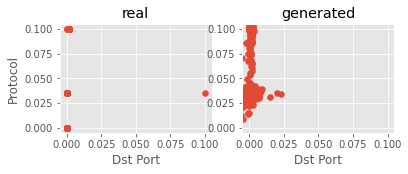

Step: 10400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0751, 0.0757, 0.0786, 1.0000
D Real - D Gen: 0.0030


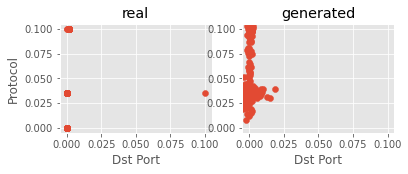

Step: 10500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0754, 0.0755, 0.0787, 1.0000
D Real - D Gen: 0.0033


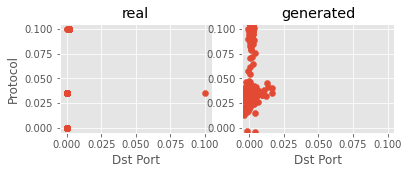

Step: 10600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0758, 0.0761, 0.0798, 0.9945
D Real - D Gen: 0.0037


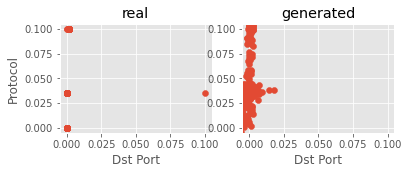

Step: 10700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0761, 0.0764, 0.0799, 0.9945
D Real - D Gen: 0.0035


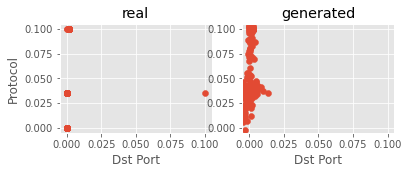

Step: 10800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0761, 0.0759, 0.0795, 0.9779
D Real - D Gen: 0.0036


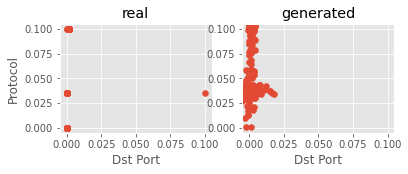

Step: 10900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0746, 0.0742, 0.0777, 1.0000
D Real - D Gen: 0.0035


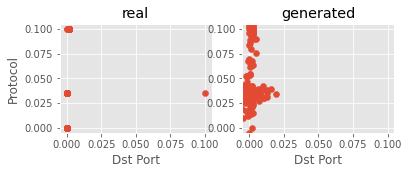

Step: 11000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0746, 0.0746, 0.0788, 0.9945
D Real - D Gen: 0.0042


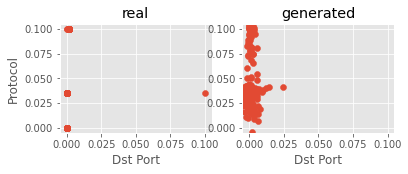

Step: 11100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0761, 0.0759, 0.0787, 0.9972
D Real - D Gen: 0.0028


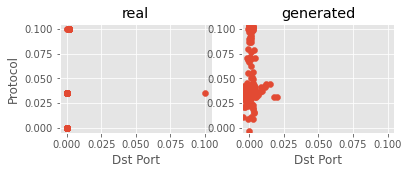

Step: 11200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0752, 0.0749, 0.0788, 0.9972
D Real - D Gen: 0.0039


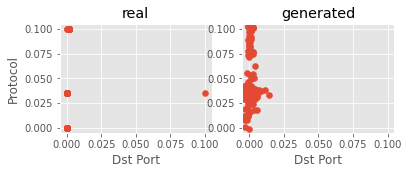

Step: 11300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0752, 0.0754, 0.0790, 0.9945
D Real - D Gen: 0.0036


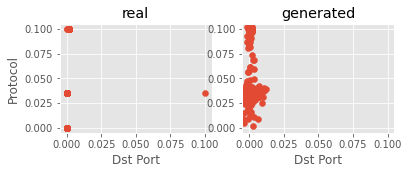

Step: 11400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0764, 0.0760, 0.0788, 1.0000
D Real - D Gen: 0.0028


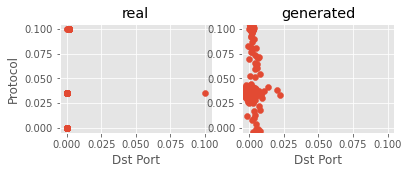

Step: 11500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0760, 0.0762, 0.0792, 0.9972
D Real - D Gen: 0.0030


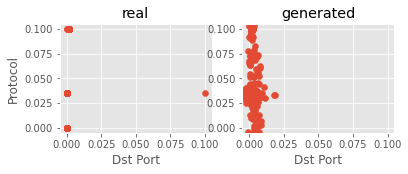

Step: 11600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0754, 0.0758, 0.0784, 0.9972
D Real - D Gen: 0.0026


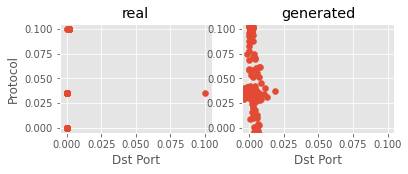

Step: 11700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0747, 0.0750, 0.0783, 1.0000
D Real - D Gen: 0.0033


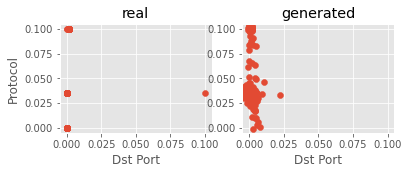

Step: 11800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0739, 0.0733, 0.0770, 1.0000
D Real - D Gen: 0.0037


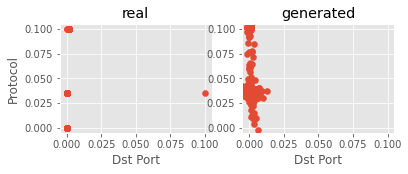

Step: 11900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0761, 0.0767, 0.0789, 1.0000
D Real - D Gen: 0.0021


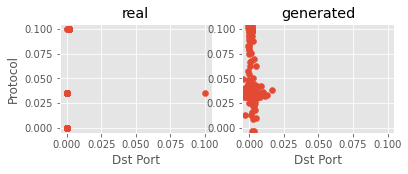

Step: 12000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0755, 0.0748, 0.0784, 0.9972
D Real - D Gen: 0.0036


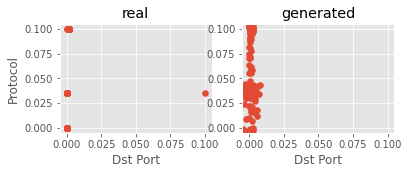

Step: 12100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0745, 0.0740, 0.0771, 1.0000
D Real - D Gen: 0.0031


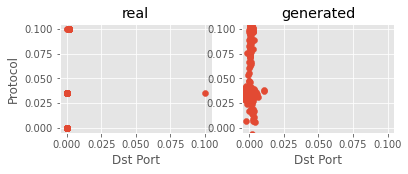

Step: 12200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0740, 0.0734, 0.0773, 1.0000
D Real - D Gen: 0.0038


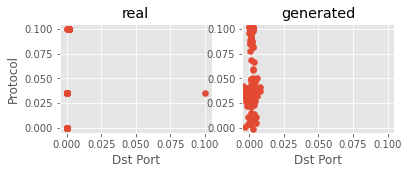

Step: 12300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0746, 0.0756, 0.0780, 1.0000
D Real - D Gen: 0.0025


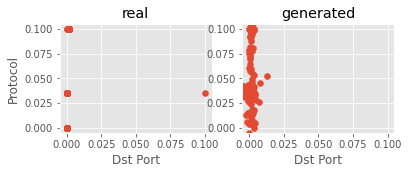

Step: 12400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0761, 0.0760, 0.0786, 0.9945
D Real - D Gen: 0.0027


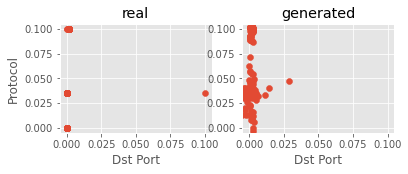

Step: 12500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0753, 0.0754, 0.0781, 0.9917
D Real - D Gen: 0.0026


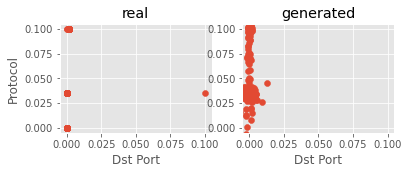

Step: 12600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0766, 0.0763, 0.0787, 0.9862
D Real - D Gen: 0.0024


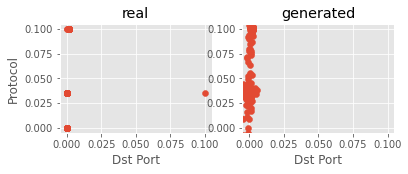

Step: 12700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0759, 0.0762, 0.0785, 0.9972
D Real - D Gen: 0.0023


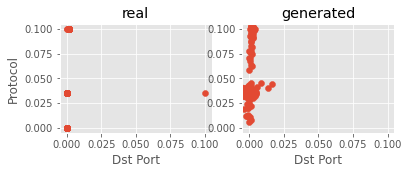

Step: 12800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0764, 0.0769, 0.0800, 0.9945
D Real - D Gen: 0.0031


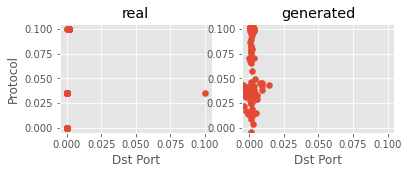

Step: 12900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0764, 0.0763, 0.0788, 1.0000
D Real - D Gen: 0.0025


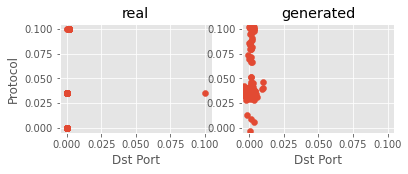

Step: 13000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0755, 0.0752, 0.0781, 0.9972
D Real - D Gen: 0.0028


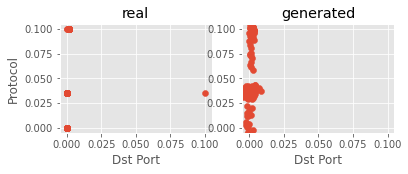

Step: 13100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0759, 0.0753, 0.0780, 0.9945
D Real - D Gen: 0.0028


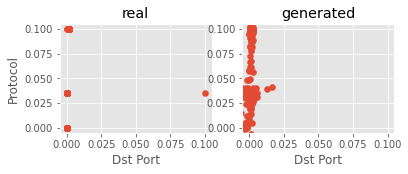

Step: 13200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0752, 0.0751, 0.0773, 1.0000
D Real - D Gen: 0.0022


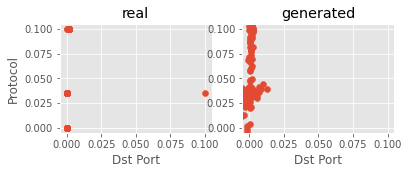

Step: 13300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0735, 0.0740, 0.0758, 0.9972
D Real - D Gen: 0.0018


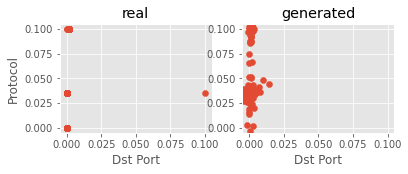

Step: 13400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0760, 0.0755, 0.0779, 0.9972
D Real - D Gen: 0.0024


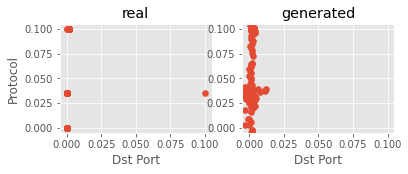

Step: 13500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0762, 0.0763, 0.0790, 1.0000
D Real - D Gen: 0.0026


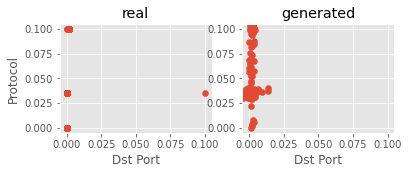

Step: 13600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0769, 0.0770, 0.0790, 0.9972
D Real - D Gen: 0.0020


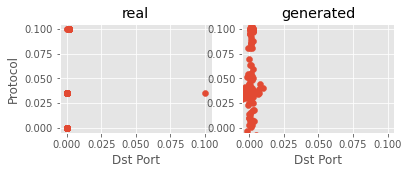

Step: 13700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0764, 0.0761, 0.0786, 1.0000
D Real - D Gen: 0.0025


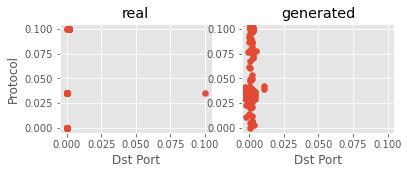

Step: 13800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0763, 0.0759, 0.0788, 1.0000
D Real - D Gen: 0.0029


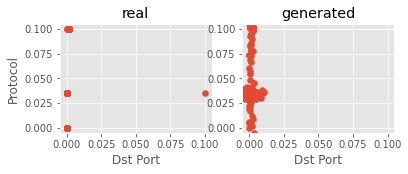

Step: 13900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0756, 0.0754, 0.0781, 0.9917
D Real - D Gen: 0.0027


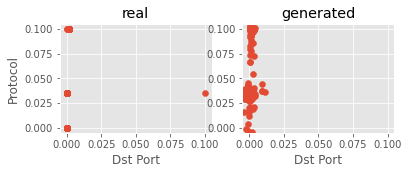

Step: 14000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0756, 0.0768, 0.0788, 0.9972
D Real - D Gen: 0.0020


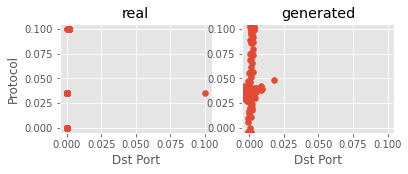

Step: 14100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0752, 0.0750, 0.0774, 1.0000
D Real - D Gen: 0.0024


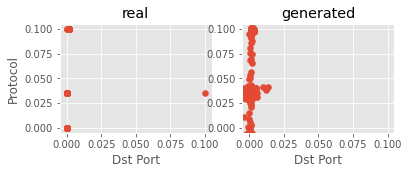

Step: 14200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0760, 0.0765, 0.0788, 0.9890
D Real - D Gen: 0.0022


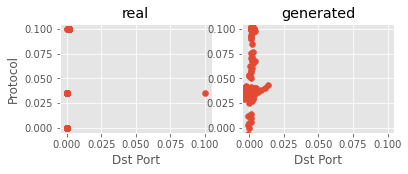

Step: 14300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0751, 0.0751, 0.0774, 0.9972
D Real - D Gen: 0.0023


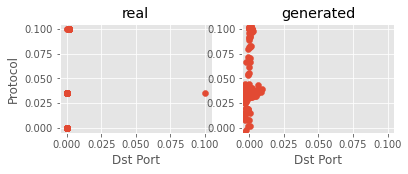

Step: 14400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0754, 0.0748, 0.0777, 1.0000
D Real - D Gen: 0.0029


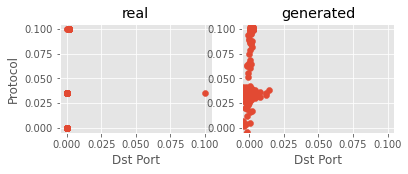

Step: 14500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0742, 0.0741, 0.0767, 1.0000
D Real - D Gen: 0.0025


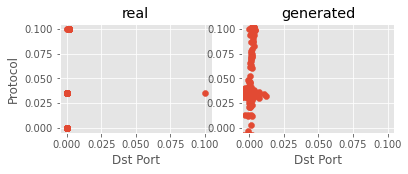

Step: 14600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0753, 0.0750, 0.0774, 1.0000
D Real - D Gen: 0.0024


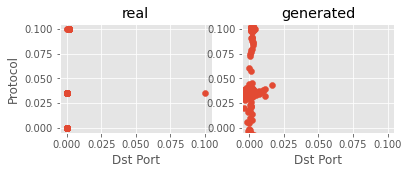

Step: 14700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0745, 0.0740, 0.0769, 0.9945
D Real - D Gen: 0.0029


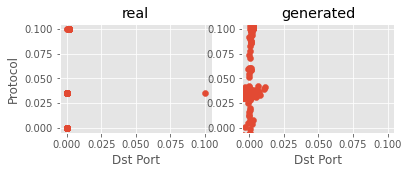

Step: 14800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0746, 0.0731, 0.0761, 0.9834
D Real - D Gen: 0.0030


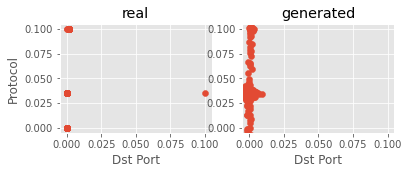

Step: 14900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0744, 0.0747, 0.0771, 1.0000
D Real - D Gen: 0.0024


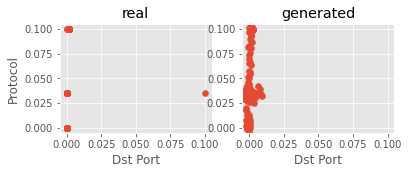

Step: 15000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0740, 0.0736, 0.0760, 0.9972
D Real - D Gen: 0.0024


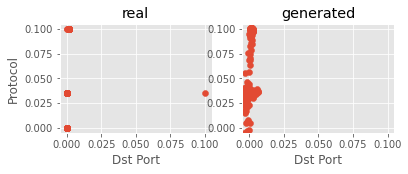

Step: 15100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0737, 0.0734, 0.0762, 1.0000
D Real - D Gen: 0.0028


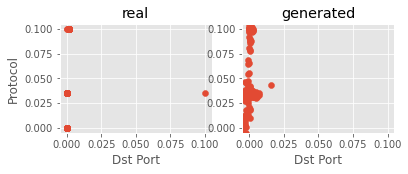

Step: 15200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0729, 0.0733, 0.0750, 1.0000
D Real - D Gen: 0.0018


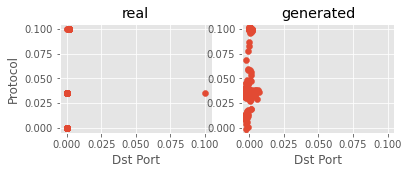

Step: 15300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0732, 0.0734, 0.0760, 1.0000
D Real - D Gen: 0.0025


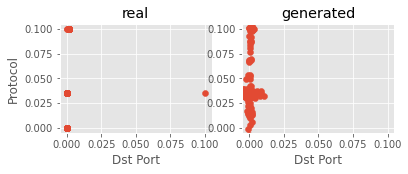

Step: 15400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0740, 0.0744, 0.0765, 0.9972
D Real - D Gen: 0.0020


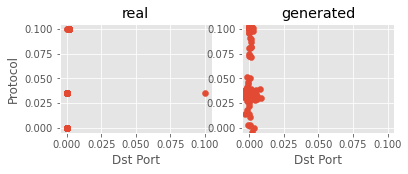

Step: 15500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0750, 0.0757, 0.0783, 1.0000
D Real - D Gen: 0.0026


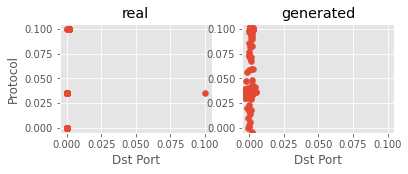

Step: 15600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0745, 0.0749, 0.0768, 0.9972
D Real - D Gen: 0.0018


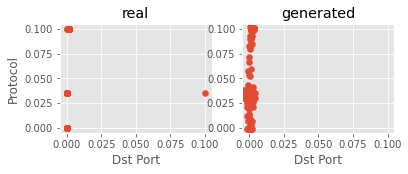

Step: 15700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0745, 0.0746, 0.0764, 1.0000
D Real - D Gen: 0.0018


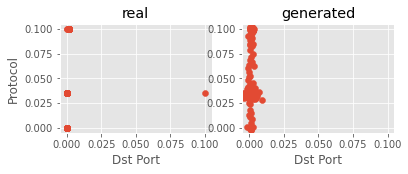

Step: 15800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0735, 0.0737, 0.0759, 1.0000
D Real - D Gen: 0.0021


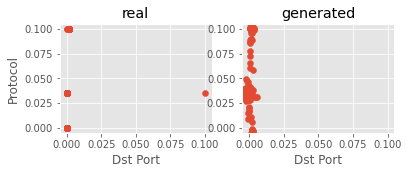

Step: 15900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0735, 0.0727, 0.0756, 1.0000
D Real - D Gen: 0.0029


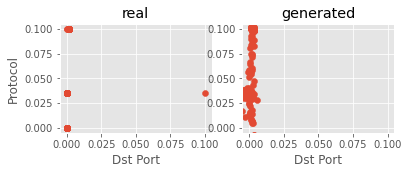

Step: 16000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0731, 0.0732, 0.0759, 1.0000
D Real - D Gen: 0.0027


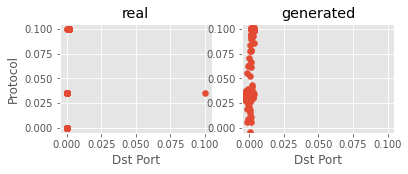

Step: 16100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0744, 0.0743, 0.0764, 1.0000
D Real - D Gen: 0.0021


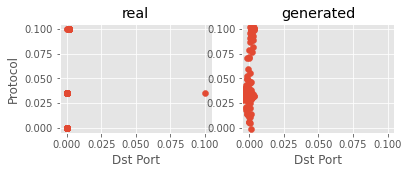

Step: 16200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0736, 0.0734, 0.0755, 1.0000
D Real - D Gen: 0.0021


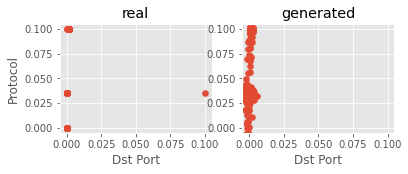

Step: 16300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0737, 0.0741, 0.0761, 0.9972
D Real - D Gen: 0.0021


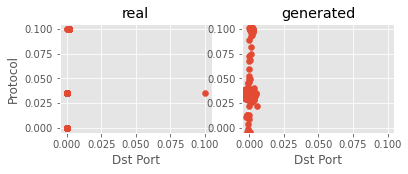

Step: 16400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0737, 0.0735, 0.0758, 1.0000
D Real - D Gen: 0.0023


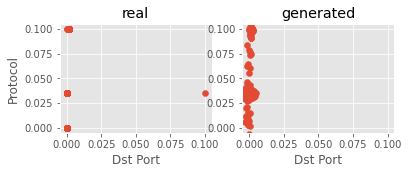

Step: 16500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0746, 0.0740, 0.0763, 0.9917
D Real - D Gen: 0.0023


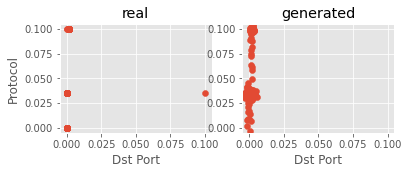

Step: 16600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0736, 0.0738, 0.0760, 1.0000
D Real - D Gen: 0.0022


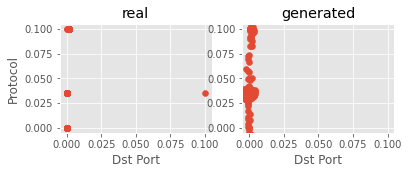

Step: 16700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0743, 0.0747, 0.0767, 0.9945
D Real - D Gen: 0.0020


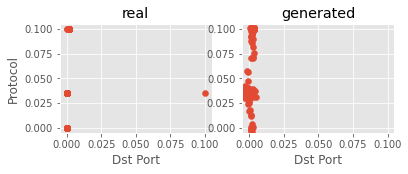

Step: 16800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0729, 0.0746, 0.9972
D Real - D Gen: 0.0017


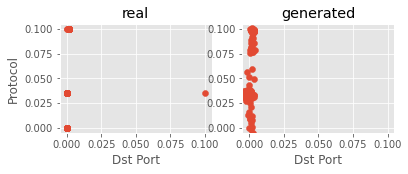

Step: 16900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0735, 0.0735, 0.0753, 0.9917
D Real - D Gen: 0.0018


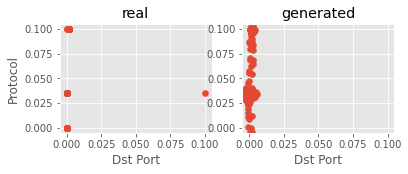

Step: 17000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0736, 0.0730, 0.0755, 0.9972
D Real - D Gen: 0.0025


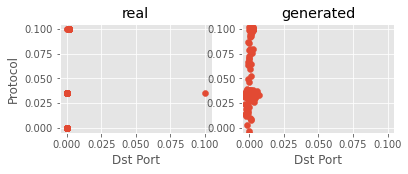

Step: 17100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0738, 0.0737, 0.0765, 1.0000
D Real - D Gen: 0.0028


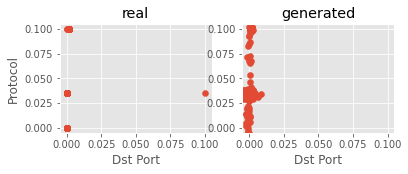

Step: 17200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0724, 0.0728, 0.0750, 1.0000
D Real - D Gen: 0.0021


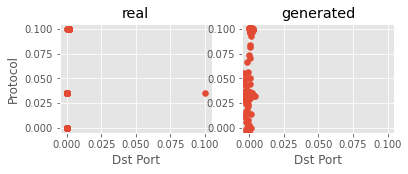

Step: 17300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0738, 0.0740, 0.0756, 1.0000
D Real - D Gen: 0.0016


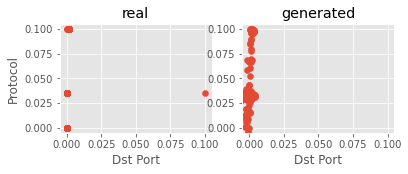

Step: 17400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0741, 0.0737, 0.0758, 0.9945
D Real - D Gen: 0.0021


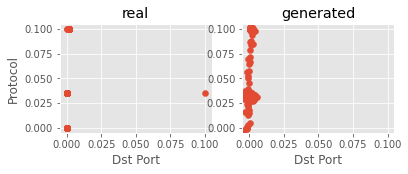

Step: 17500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0733, 0.0734, 0.0754, 0.9890
D Real - D Gen: 0.0020


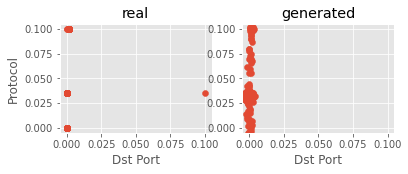

Step: 17600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0734, 0.0741, 0.0757, 0.9945
D Real - D Gen: 0.0016


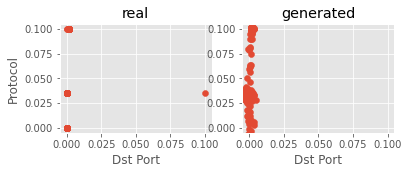

Step: 17700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0759, 0.0755, 0.0772, 1.0000
D Real - D Gen: 0.0017


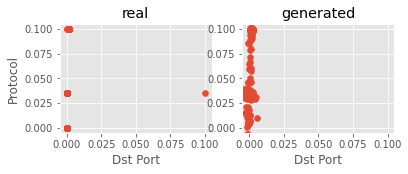

Step: 17800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0751, 0.0753, 0.0770, 0.9972
D Real - D Gen: 0.0017


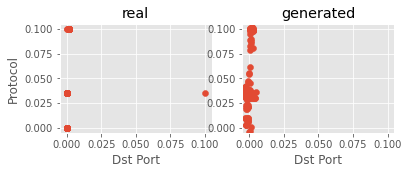

Step: 17900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0750, 0.0744, 0.0767, 1.0000
D Real - D Gen: 0.0024


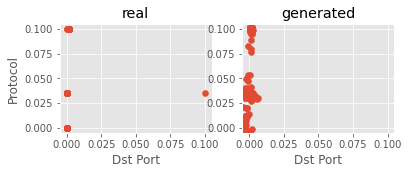

Step: 18000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0748, 0.0751, 0.0770, 0.9945
D Real - D Gen: 0.0019


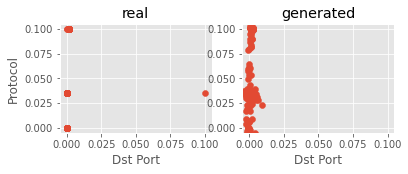

Step: 18100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0746, 0.0749, 0.0766, 1.0000
D Real - D Gen: 0.0017


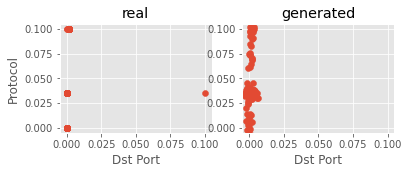

Step: 18200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0735, 0.0738, 0.0756, 1.0000
D Real - D Gen: 0.0017


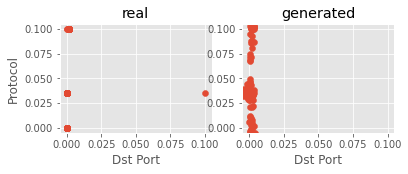

Step: 18300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0748, 0.0739, 0.0758, 1.0000
D Real - D Gen: 0.0019


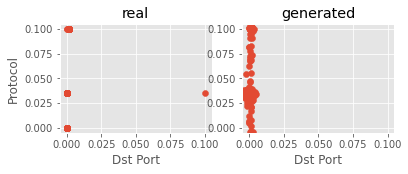

Step: 18400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0746, 0.0742, 0.0761, 0.9917
D Real - D Gen: 0.0019


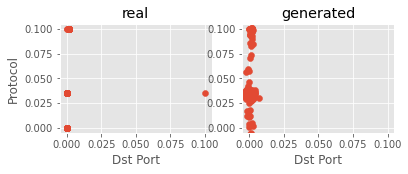

Step: 18500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0737, 0.0727, 0.0748, 1.0000
D Real - D Gen: 0.0021


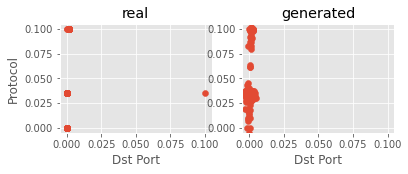

Step: 18600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0717, 0.0728, 0.0741, 0.9945
D Real - D Gen: 0.0014


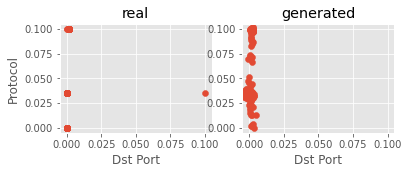

Step: 18700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0736, 0.0742, 0.0754, 0.9917
D Real - D Gen: 0.0012


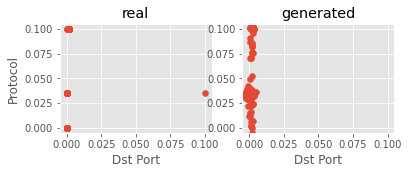

Step: 18800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0734, 0.0735, 0.0755, 0.9917
D Real - D Gen: 0.0020


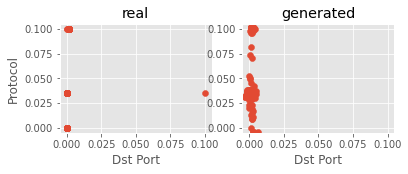

Step: 18900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0731, 0.0744, 0.9972
D Real - D Gen: 0.0013


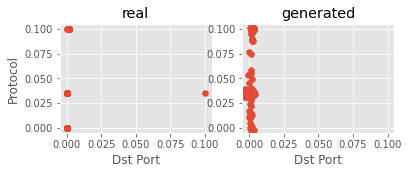

Step: 19000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0720, 0.0727, 0.0742, 0.9972
D Real - D Gen: 0.0015


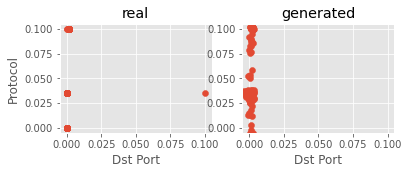

Step: 19100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0731, 0.0733, 0.0749, 0.9945
D Real - D Gen: 0.0016


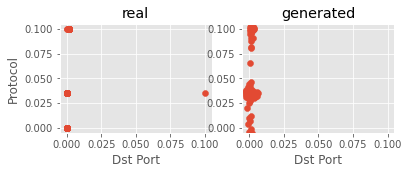

Step: 19200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0724, 0.0724, 0.0743, 1.0000
D Real - D Gen: 0.0020


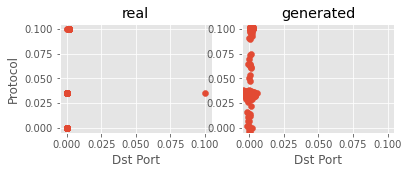

Step: 19300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0734, 0.0732, 0.0748, 1.0000
D Real - D Gen: 0.0015


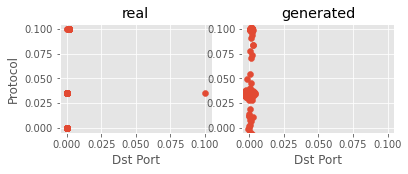

Step: 19400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0739, 0.0734, 0.0758, 1.0000
D Real - D Gen: 0.0024


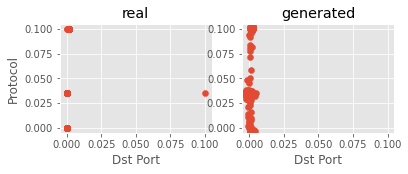

Step: 19500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0724, 0.0730, 0.0746, 0.9945
D Real - D Gen: 0.0017


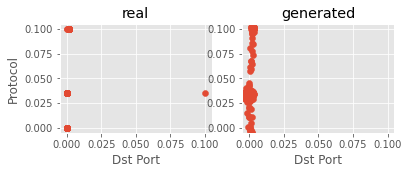

Step: 19600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0731, 0.0731, 0.0742, 0.9917
D Real - D Gen: 0.0011


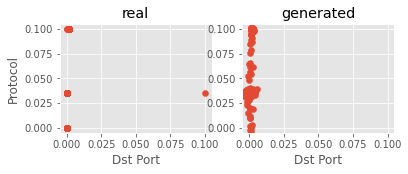

Step: 19700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0731, 0.0733, 0.0751, 1.0000
D Real - D Gen: 0.0018


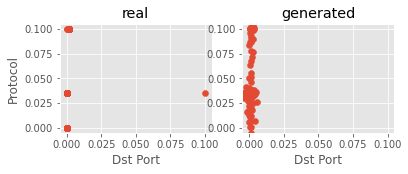

Step: 19800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0728, 0.0729, 0.0747, 0.9972
D Real - D Gen: 0.0019


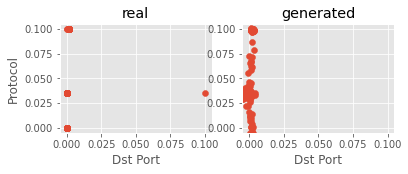

Step: 19900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0739, 0.0739, 0.0759, 1.0000
D Real - D Gen: 0.0020


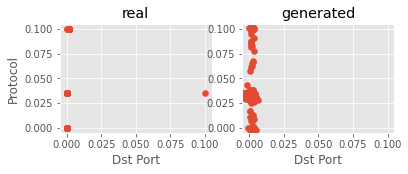

Step: 20000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0735, 0.0737, 0.0749, 1.0000
D Real - D Gen: 0.0011


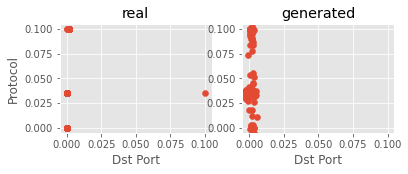

Step: 20100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0732, 0.0731, 0.0750, 0.9834
D Real - D Gen: 0.0019


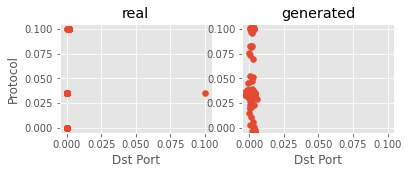

Step: 20200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0733, 0.0735, 0.0750, 0.9945
D Real - D Gen: 0.0015


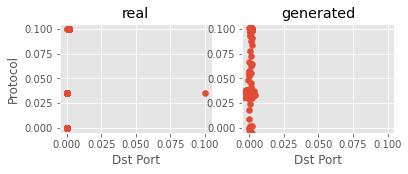

Step: 20300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0744, 0.0747, 0.0761, 0.9945
D Real - D Gen: 0.0014


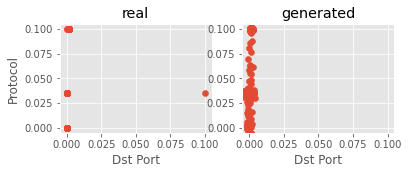

Step: 20400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0729, 0.0725, 0.0747, 0.9890
D Real - D Gen: 0.0022


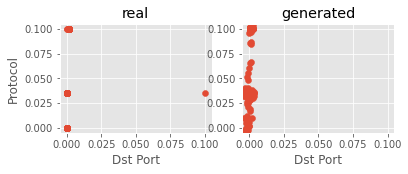

Step: 20500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0726, 0.0730, 0.0745, 0.9917
D Real - D Gen: 0.0016


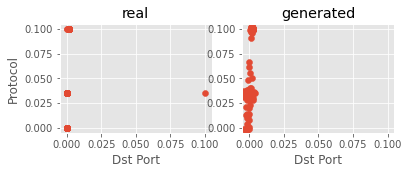

Step: 20600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0731, 0.0746, 1.0000
D Real - D Gen: 0.0015


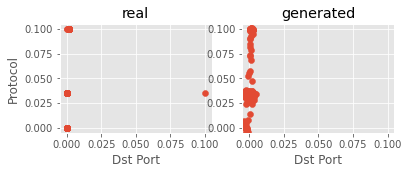

Step: 20700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0730, 0.0729, 0.0747, 0.9972
D Real - D Gen: 0.0018


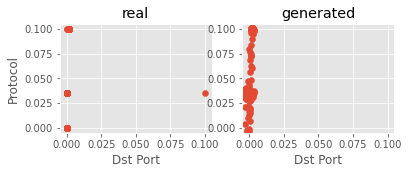

Step: 20800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0736, 0.0739, 0.0755, 1.0000
D Real - D Gen: 0.0015


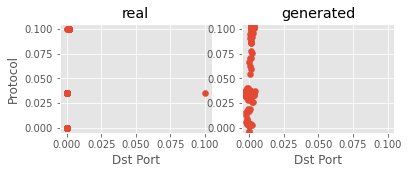

Step: 20900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0724, 0.0745, 1.0000
D Real - D Gen: 0.0020


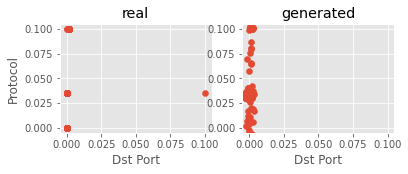

Step: 21000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0728, 0.0735, 0.0747, 1.0000
D Real - D Gen: 0.0012


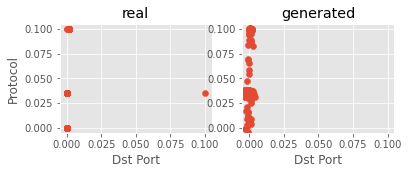

Step: 21100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0733, 0.0736, 0.0751, 1.0000
D Real - D Gen: 0.0016


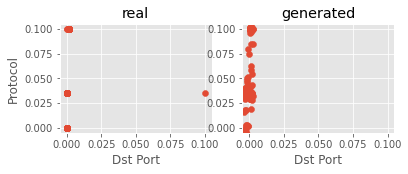

Step: 21200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0730, 0.0724, 0.0747, 0.9945
D Real - D Gen: 0.0023


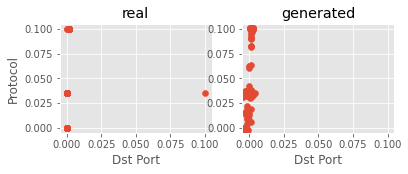

Step: 21300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0721, 0.0725, 0.0739, 1.0000
D Real - D Gen: 0.0013


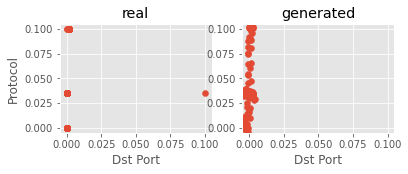

Step: 21400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0742, 0.0744, 0.0759, 0.9972
D Real - D Gen: 0.0014


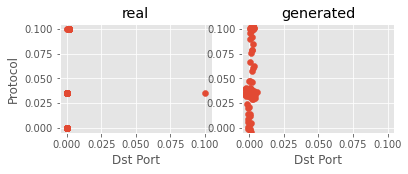

Step: 21500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0746, 0.0747, 0.0762, 0.9917
D Real - D Gen: 0.0016


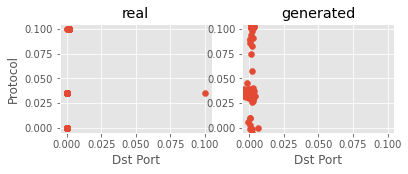

Step: 21600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0730, 0.0728, 0.0745, 0.9972
D Real - D Gen: 0.0016


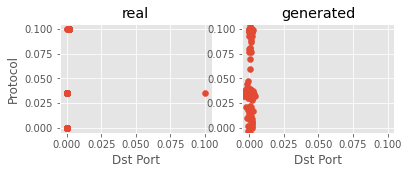

Step: 21700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0728, 0.0728, 0.0739, 0.9917
D Real - D Gen: 0.0011


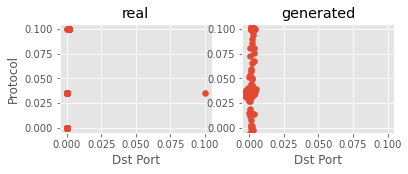

Step: 21800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0735, 0.0736, 0.0750, 0.9972
D Real - D Gen: 0.0014


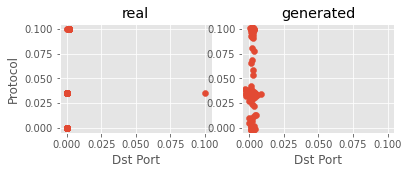

Step: 21900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0736, 0.0736, 0.0749, 0.9972
D Real - D Gen: 0.0013


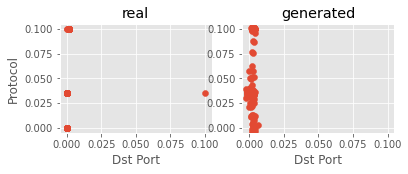

Step: 22000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0729, 0.0727, 0.0746, 0.9945
D Real - D Gen: 0.0019


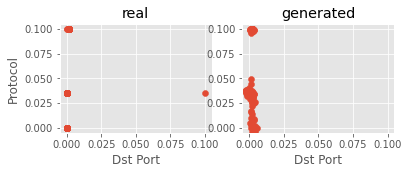

Step: 22100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0738, 0.0743, 0.0758, 1.0000
D Real - D Gen: 0.0015


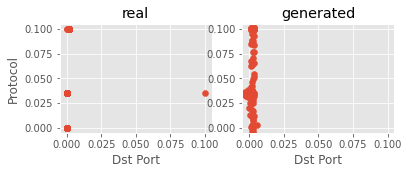

Step: 22200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0734, 0.0731, 0.0744, 0.9972
D Real - D Gen: 0.0014


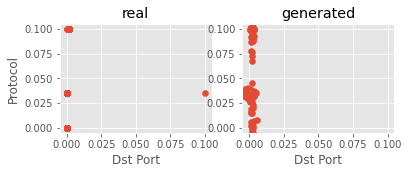

Step: 22300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0729, 0.0732, 0.0751, 0.9890
D Real - D Gen: 0.0020


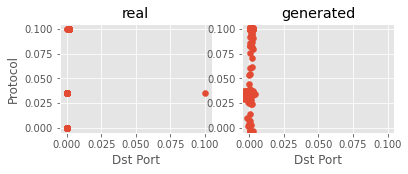

Step: 22400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0744, 0.0743, 0.0757, 0.9945
D Real - D Gen: 0.0014


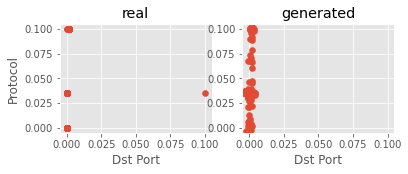

Step: 22500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0744, 0.0744, 0.0757, 1.0000
D Real - D Gen: 0.0013


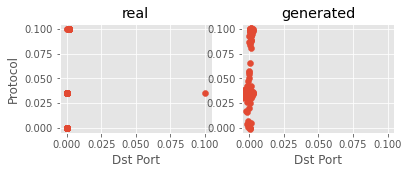

Step: 22600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0738, 0.0739, 0.0756, 1.0000
D Real - D Gen: 0.0017


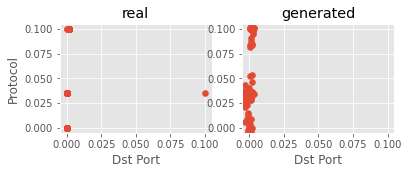

Step: 22700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0737, 0.0739, 0.0755, 1.0000
D Real - D Gen: 0.0016


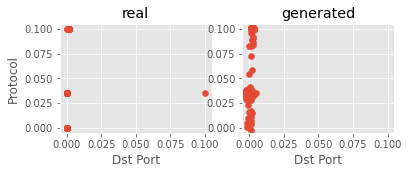

Step: 22800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0730, 0.0731, 0.0746, 1.0000
D Real - D Gen: 0.0015


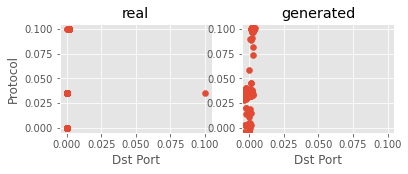

Step: 22900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0748, 0.0749, 0.0764, 0.9972
D Real - D Gen: 0.0014


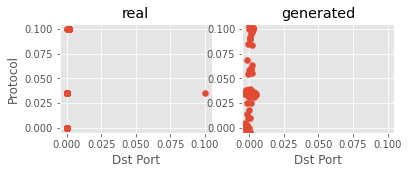

Step: 23000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0743, 0.0742, 0.0758, 0.9972
D Real - D Gen: 0.0016


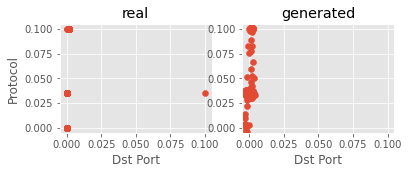

Step: 23100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0743, 0.0748, 0.0760, 1.0000
D Real - D Gen: 0.0012


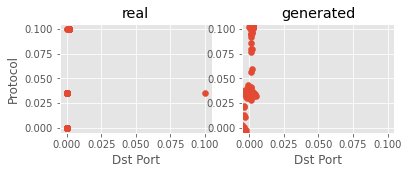

Step: 23200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0728, 0.0729, 0.0742, 0.9972
D Real - D Gen: 0.0013


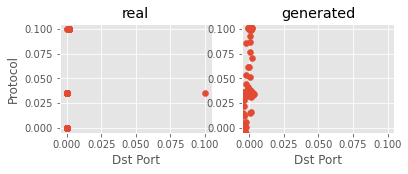

Step: 23300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0737, 0.0738, 0.0751, 0.9972
D Real - D Gen: 0.0013


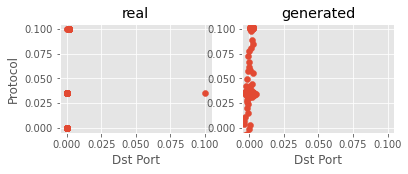

Step: 23400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0731, 0.0737, 0.0748, 1.0000
D Real - D Gen: 0.0011


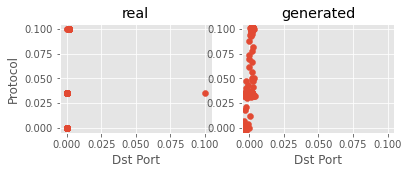

Step: 23500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0721, 0.0723, 0.0739, 0.9972
D Real - D Gen: 0.0016


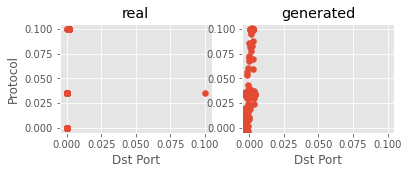

Step: 23600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0728, 0.0727, 0.0746, 1.0000
D Real - D Gen: 0.0019


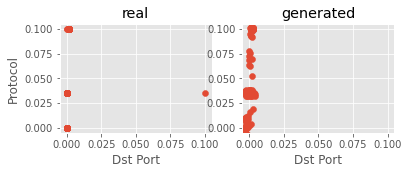

Step: 23700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0744, 0.0752, 0.0762, 0.9945
D Real - D Gen: 0.0010


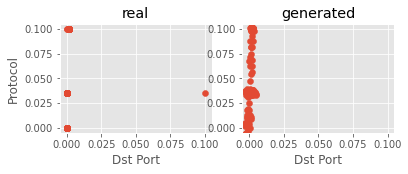

Step: 23800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0748, 0.0744, 0.0759, 0.9972
D Real - D Gen: 0.0015


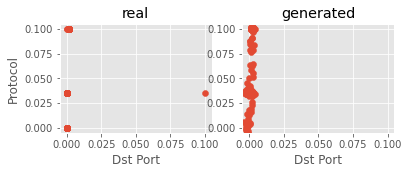

Step: 23900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0738, 0.0738, 0.0754, 0.9972
D Real - D Gen: 0.0016


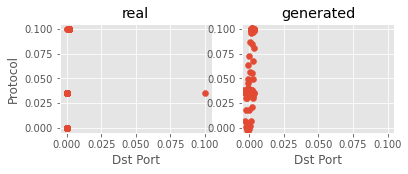

Step: 24000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0740, 0.0737, 0.0752, 0.9972
D Real - D Gen: 0.0015


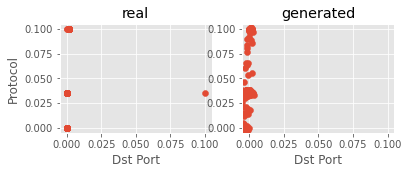

Step: 24100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0724, 0.0727, 0.0741, 1.0000
D Real - D Gen: 0.0015


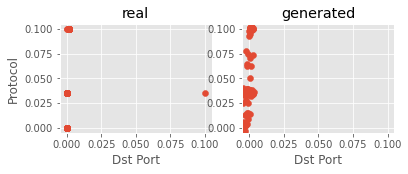

Step: 24200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0733, 0.0732, 0.0750, 0.9972
D Real - D Gen: 0.0019


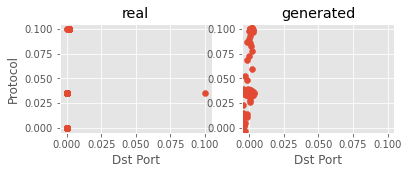

Step: 24300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0731, 0.0729, 0.0741, 0.9945
D Real - D Gen: 0.0012


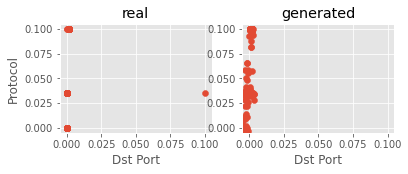

Step: 24400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0721, 0.0721, 0.0733, 1.0000
D Real - D Gen: 0.0012


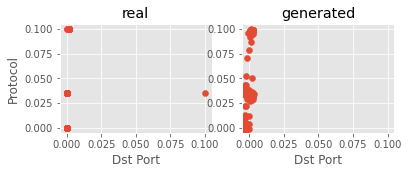

Step: 24500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0741, 0.0731, 0.0752, 0.9779
D Real - D Gen: 0.0021


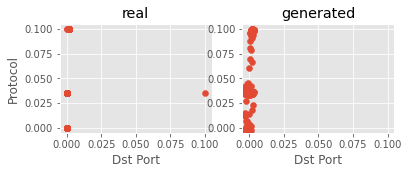

Step: 24600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0719, 0.0720, 0.0737, 1.0000
D Real - D Gen: 0.0017


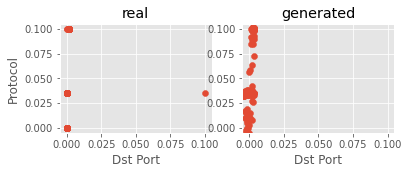

Step: 24700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0732, 0.0736, 0.0742, 1.0000
D Real - D Gen: 0.0006


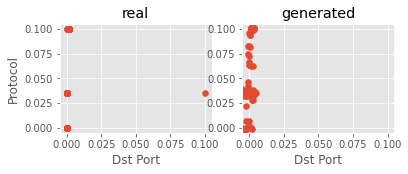

Step: 24800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0740, 0.0742, 0.0756, 1.0000
D Real - D Gen: 0.0014


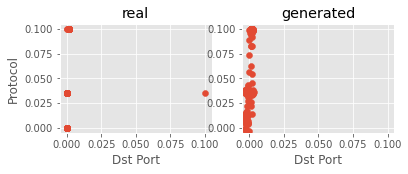

Step: 24900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0736, 0.0741, 0.0753, 0.9834
D Real - D Gen: 0.0012


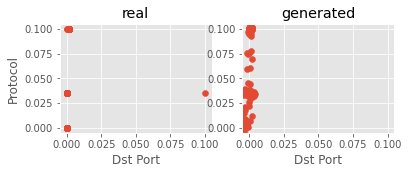

Step: 25000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0737, 0.0731, 0.0747, 1.0000
D Real - D Gen: 0.0016


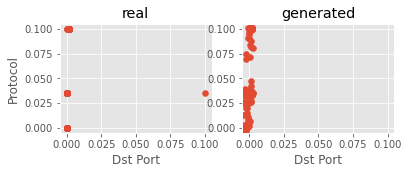

Step: 25100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0739, 0.0739, 0.0756, 1.0000
D Real - D Gen: 0.0017


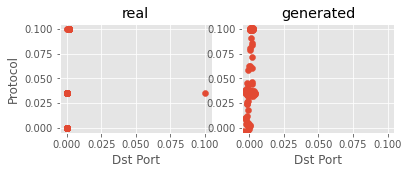

Step: 25200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0732, 0.0728, 0.0744, 1.0000
D Real - D Gen: 0.0017


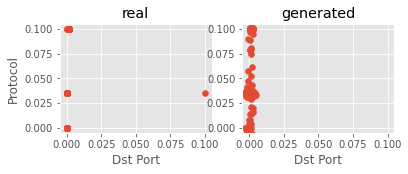

Step: 25300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0729, 0.0741, 0.9945
D Real - D Gen: 0.0012


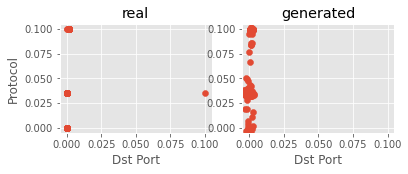

Step: 25400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0739, 0.0731, 0.0748, 1.0000
D Real - D Gen: 0.0017


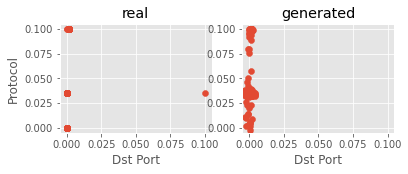

Step: 25500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0732, 0.0733, 0.0745, 0.9972
D Real - D Gen: 0.0012


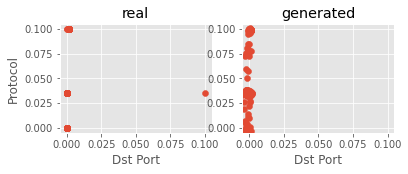

Step: 25600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0733, 0.0736, 0.0745, 1.0000
D Real - D Gen: 0.0009


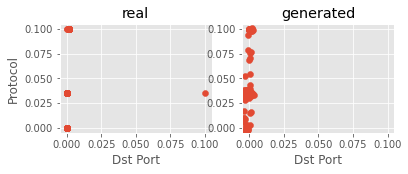

Step: 25700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0724, 0.0721, 0.0739, 1.0000
D Real - D Gen: 0.0018


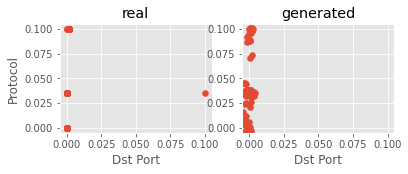

Step: 25800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0719, 0.0724, 0.0740, 1.0000
D Real - D Gen: 0.0016


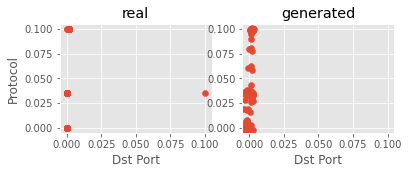

Step: 25900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0722, 0.0725, 0.0736, 0.9972
D Real - D Gen: 0.0010


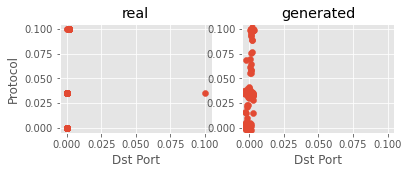

Step: 26000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0718, 0.0731, 1.0000
D Real - D Gen: 0.0013


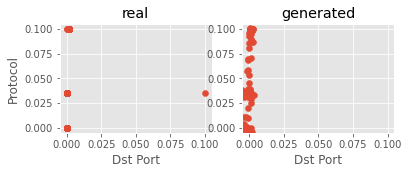

Step: 26100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0721, 0.0721, 0.0732, 0.9945
D Real - D Gen: 0.0011


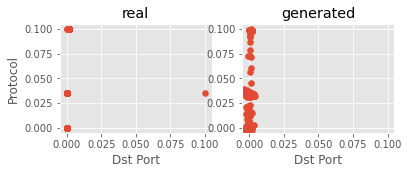

Step: 26200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0725, 0.0737, 1.0000
D Real - D Gen: 0.0012


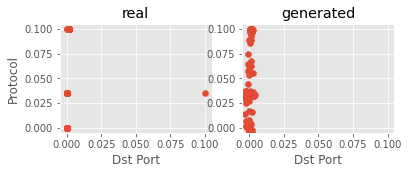

Step: 26300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0725, 0.0735, 0.9917
D Real - D Gen: 0.0010


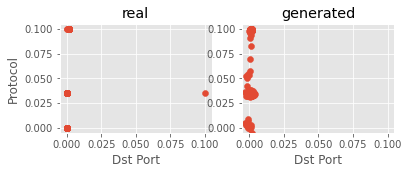

Step: 26400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0725, 0.0741, 1.0000
D Real - D Gen: 0.0016


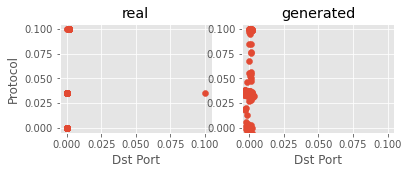

Step: 26500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0721, 0.0713, 0.0727, 1.0000
D Real - D Gen: 0.0014


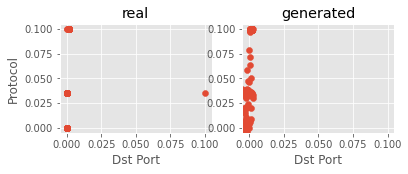

Step: 26600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0719, 0.0721, 0.0737, 1.0000
D Real - D Gen: 0.0016


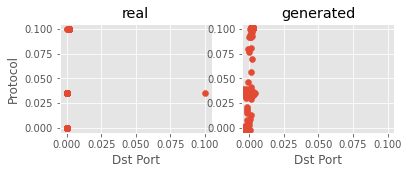

Step: 26700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0725, 0.0720, 0.0735, 1.0000
D Real - D Gen: 0.0015


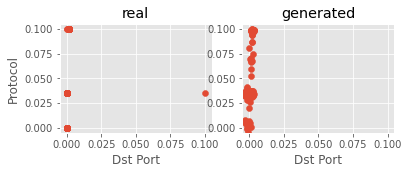

Step: 26800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0714, 0.0727, 0.9890
D Real - D Gen: 0.0014


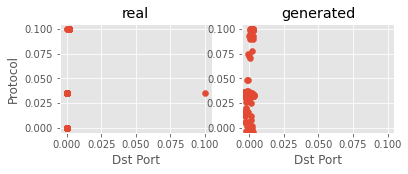

Step: 26900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0724, 0.0720, 0.0733, 1.0000
D Real - D Gen: 0.0013


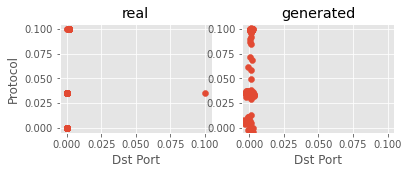

Step: 27000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0712, 0.0725, 0.9917
D Real - D Gen: 0.0013


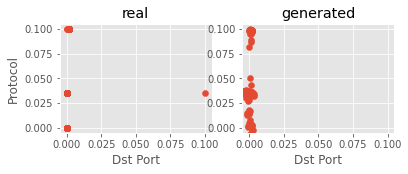

Step: 27100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0710, 0.0714, 0.0727, 0.9972
D Real - D Gen: 0.0013


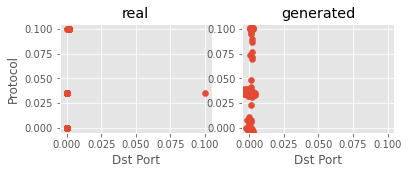

Step: 27200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0710, 0.0712, 0.0724, 0.9972
D Real - D Gen: 0.0012


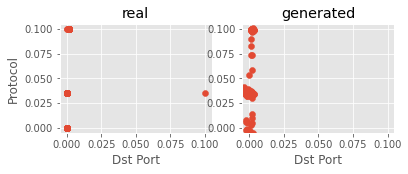

Step: 27300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0713, 0.0728, 0.9890
D Real - D Gen: 0.0015


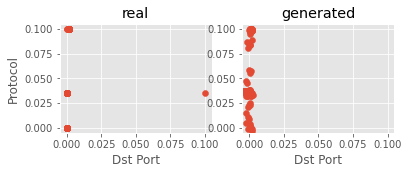

Step: 27400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0725, 0.0729, 0.0737, 0.9972
D Real - D Gen: 0.0008


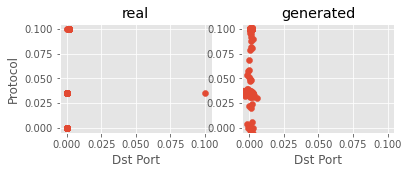

Step: 27500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0716, 0.0726, 1.0000
D Real - D Gen: 0.0010


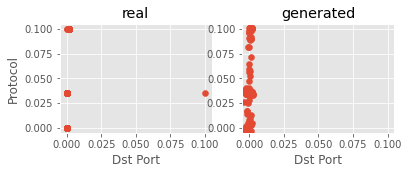

Step: 27600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0718, 0.0729, 1.0000
D Real - D Gen: 0.0011


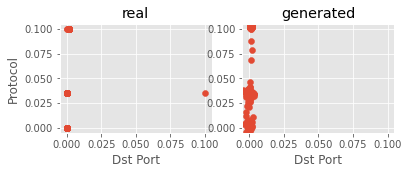

Step: 27700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0718, 0.0730, 0.9945
D Real - D Gen: 0.0012


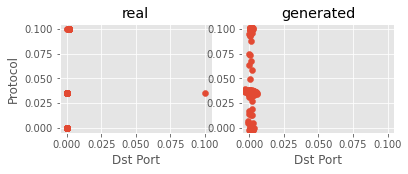

Step: 27800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0722, 0.0721, 0.0735, 0.9890
D Real - D Gen: 0.0014


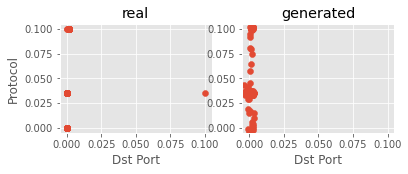

Step: 27900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0726, 0.0721, 0.0735, 1.0000
D Real - D Gen: 0.0014


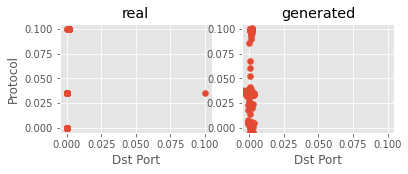

Step: 28000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0716, 0.0727, 1.0000
D Real - D Gen: 0.0012


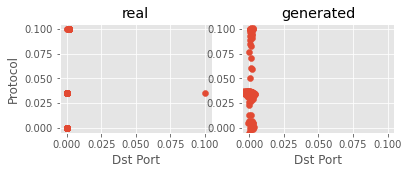

Step: 28100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0718, 0.0727, 1.0000
D Real - D Gen: 0.0009


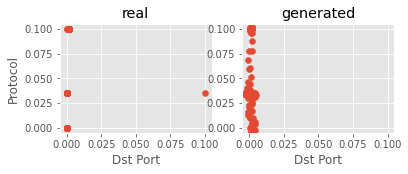

Step: 28200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0731, 0.0732, 0.0743, 0.9972
D Real - D Gen: 0.0010


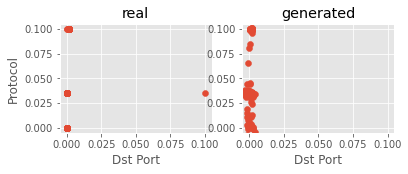

Step: 28300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0738, 0.0734, 0.0750, 1.0000
D Real - D Gen: 0.0016


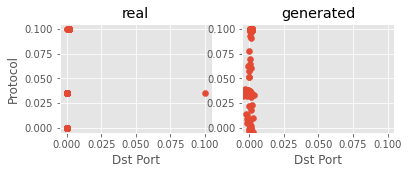

Step: 28400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0729, 0.0730, 0.0738, 0.9972
D Real - D Gen: 0.0009


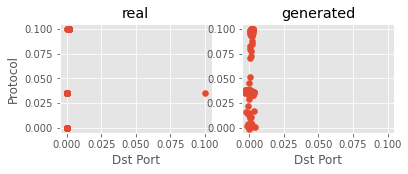

Step: 28500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0729, 0.0741, 0.9945
D Real - D Gen: 0.0012


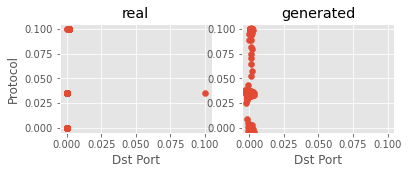

Step: 28600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0732, 0.0735, 0.0751, 1.0000
D Real - D Gen: 0.0016


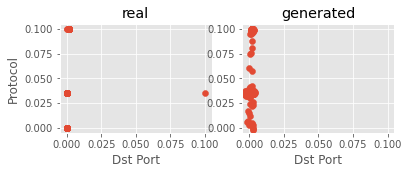

Step: 28700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0736, 0.0732, 0.0746, 1.0000
D Real - D Gen: 0.0015


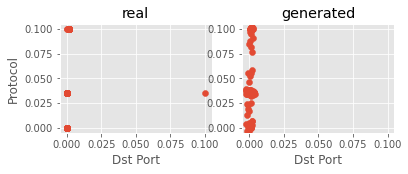

Step: 28800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0725, 0.0722, 0.0738, 0.9917
D Real - D Gen: 0.0016


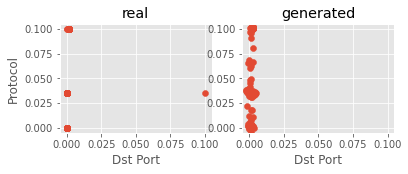

Step: 28900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0722, 0.0722, 0.0735, 0.9945
D Real - D Gen: 0.0013


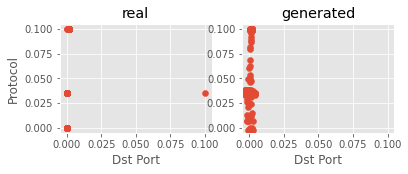

Step: 29000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0723, 0.0721, 0.0735, 0.9972
D Real - D Gen: 0.0014


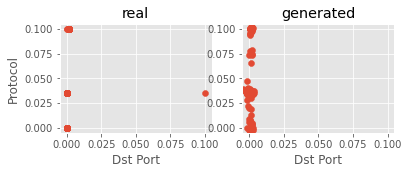

Step: 29100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0717, 0.0731, 0.9917
D Real - D Gen: 0.0014


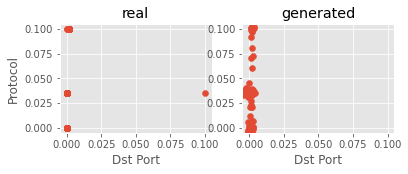

Step: 29200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0715, 0.0724, 0.9972
D Real - D Gen: 0.0008


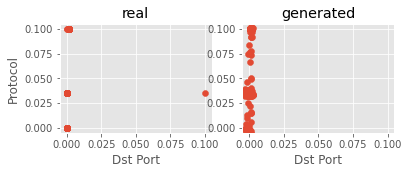

Step: 29300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0713, 0.0728, 1.0000
D Real - D Gen: 0.0015


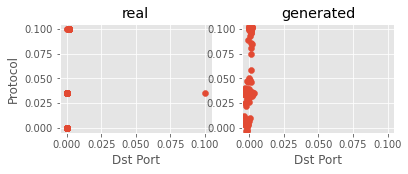

Step: 29400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0716, 0.0725, 0.9972
D Real - D Gen: 0.0009


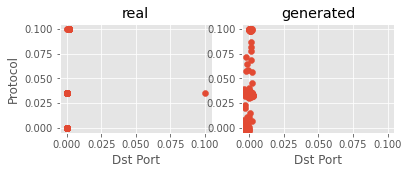

Step: 29500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0717, 0.0714, 0.0726, 0.9945
D Real - D Gen: 0.0013


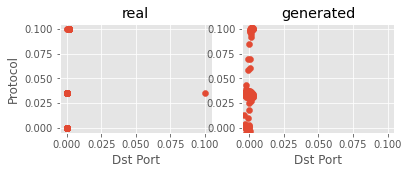

Step: 29600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0723, 0.0726, 0.0731, 1.0000
D Real - D Gen: 0.0005


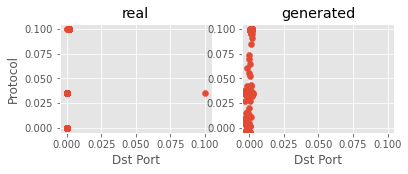

Step: 29700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0710, 0.0708, 0.0724, 0.9972
D Real - D Gen: 0.0016


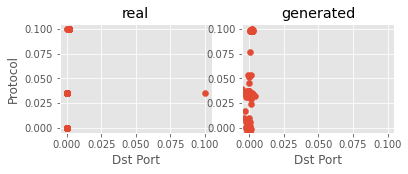

Step: 29800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0725, 0.0723, 0.0735, 0.9917
D Real - D Gen: 0.0011


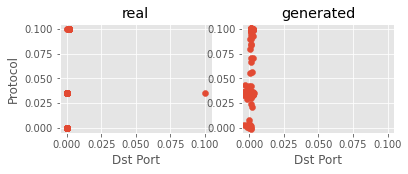

Step: 29900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0721, 0.0729, 0.9972
D Real - D Gen: 0.0007


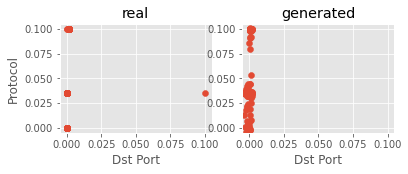

Step: 30000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0721, 0.0734, 1.0000
D Real - D Gen: 0.0012


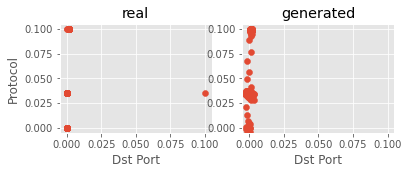

Step: 30100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0714, 0.0721, 1.0000
D Real - D Gen: 0.0008


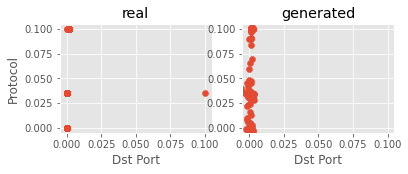

Step: 30200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0708, 0.0720, 0.9945
D Real - D Gen: 0.0012


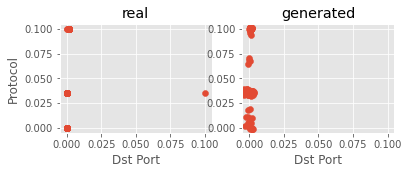

Step: 30300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0720, 0.0720, 0.0728, 1.0000
D Real - D Gen: 0.0008


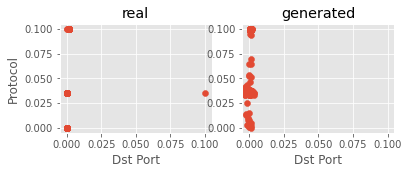

Step: 30400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0720, 0.0720, 0.0729, 0.9890
D Real - D Gen: 0.0009


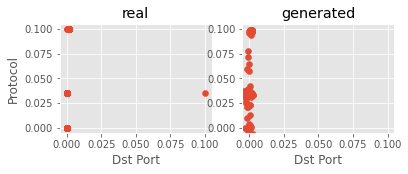

Step: 30500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0708, 0.0719, 0.9945
D Real - D Gen: 0.0012


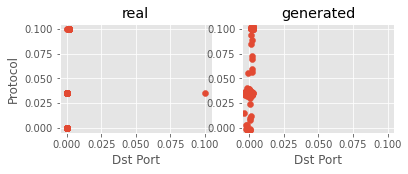

Step: 30600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0718, 0.0726, 0.9945
D Real - D Gen: 0.0008


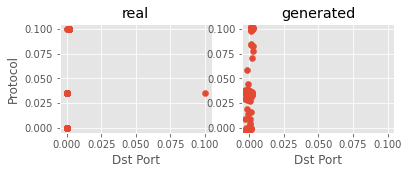

Step: 30700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0708, 0.0712, 0.0723, 0.9972
D Real - D Gen: 0.0012


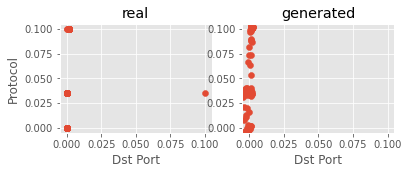

Step: 30800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0702, 0.0707, 0.0713, 0.9890
D Real - D Gen: 0.0006


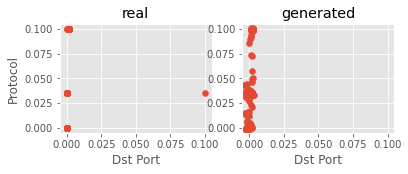

Step: 30900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0717, 0.0730, 1.0000
D Real - D Gen: 0.0013


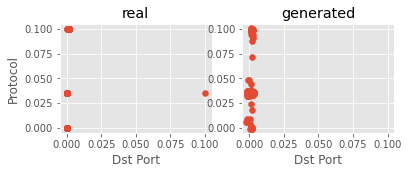

Step: 31000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0721, 0.0721, 0.0732, 1.0000
D Real - D Gen: 0.0011


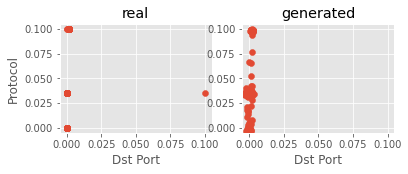

Step: 31100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0720, 0.0717, 0.0730, 0.9972
D Real - D Gen: 0.0013


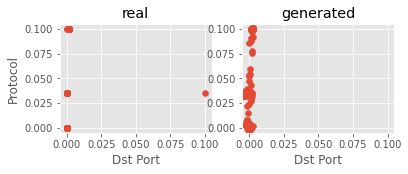

Step: 31200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0709, 0.0721, 0.9972
D Real - D Gen: 0.0012


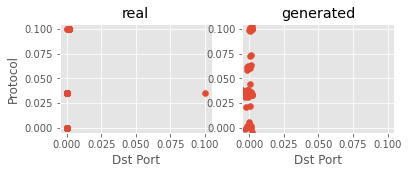

Step: 31300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0719, 0.0727, 0.0733, 1.0000
D Real - D Gen: 0.0006


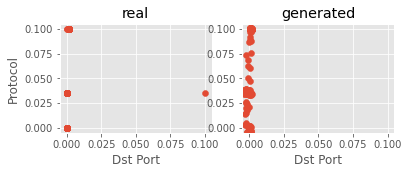

Step: 31400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0724, 0.0719, 0.0732, 1.0000
D Real - D Gen: 0.0013


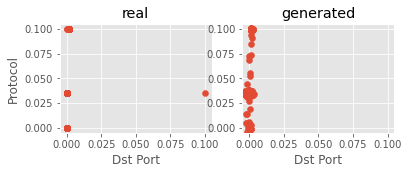

Step: 31500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0716, 0.0711, 0.0727, 0.9945
D Real - D Gen: 0.0016


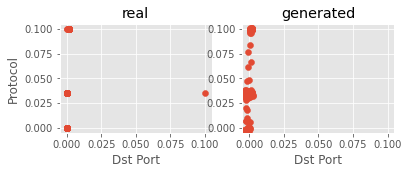

Step: 31600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0713, 0.0716, 0.0726, 0.9972
D Real - D Gen: 0.0011


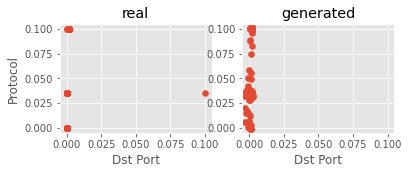

Step: 31700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0694, 0.0695, 0.0708, 0.9945
D Real - D Gen: 0.0013


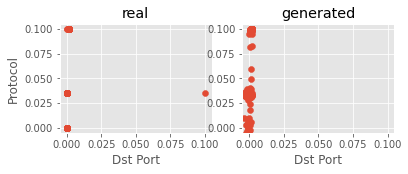

Step: 31800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0715, 0.0730, 0.9972
D Real - D Gen: 0.0015


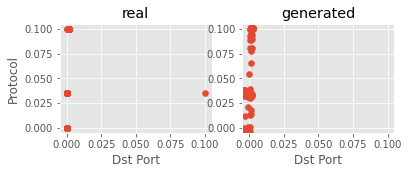

Step: 31900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0713, 0.0711, 0.0718, 1.0000
D Real - D Gen: 0.0007


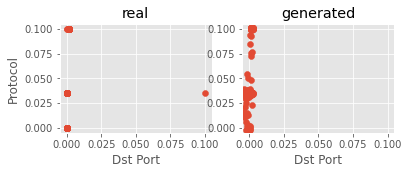

Step: 32000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0716, 0.0714, 0.0724, 1.0000
D Real - D Gen: 0.0010


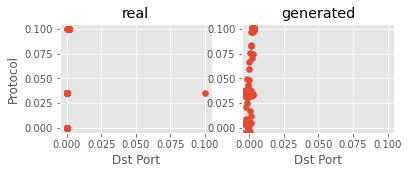

Step: 32100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0705, 0.0719, 0.9807
D Real - D Gen: 0.0014


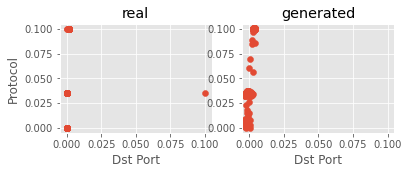

Step: 32200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0708, 0.0720, 1.0000
D Real - D Gen: 0.0012


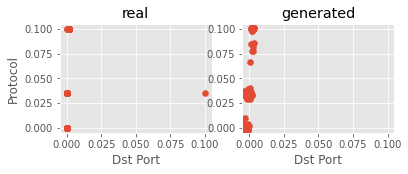

Step: 32300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0716, 0.0728, 0.9917
D Real - D Gen: 0.0012


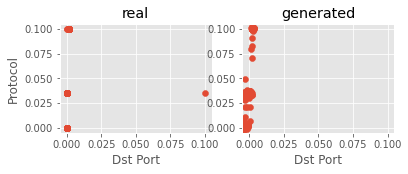

Step: 32400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0713, 0.0718, 0.0723, 1.0000
D Real - D Gen: 0.0005


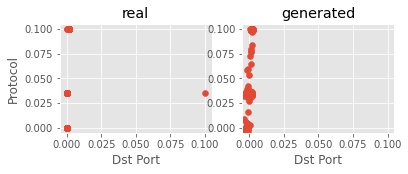

Step: 32500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0715, 0.0726, 0.9972
D Real - D Gen: 0.0012


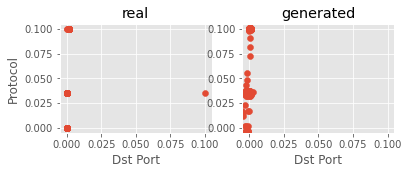

Step: 32600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0711, 0.0717, 1.0000
D Real - D Gen: 0.0006


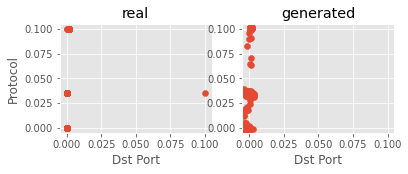

Step: 32700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0719, 0.0716, 0.0729, 1.0000
D Real - D Gen: 0.0014


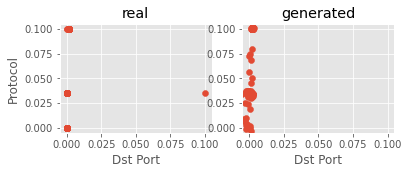

Step: 32800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0717, 0.0716, 0.0725, 0.9862
D Real - D Gen: 0.0009


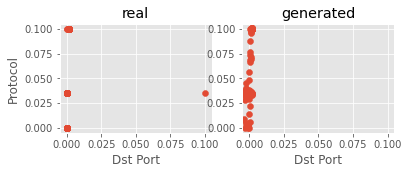

Step: 32900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0713, 0.0718, 1.0000
D Real - D Gen: 0.0006


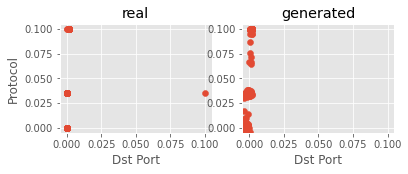

Step: 33000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0699, 0.0699, 0.0708, 0.9972
D Real - D Gen: 0.0009


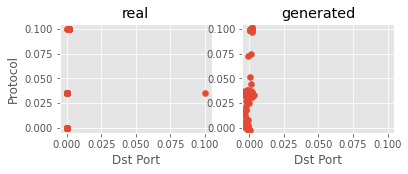

Step: 33100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0713, 0.0726, 0.9972
D Real - D Gen: 0.0012


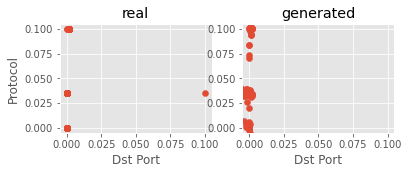

Step: 33200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0708, 0.0706, 0.0717, 0.9972
D Real - D Gen: 0.0010


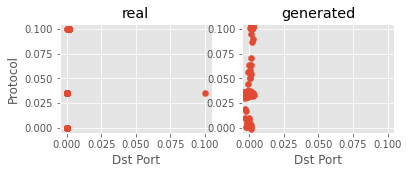

Step: 33300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0713, 0.0724, 1.0000
D Real - D Gen: 0.0011


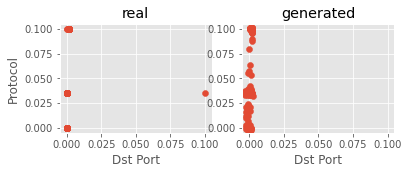

Step: 33400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0721, 0.0724, 0.0734, 0.9972
D Real - D Gen: 0.0009


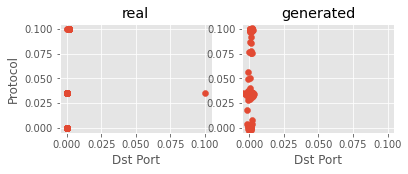

Step: 33500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0722, 0.0725, 0.0732, 0.9972
D Real - D Gen: 0.0007


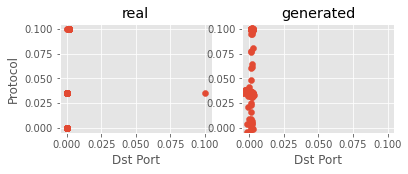

Step: 33600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0711, 0.0725, 0.9917
D Real - D Gen: 0.0014


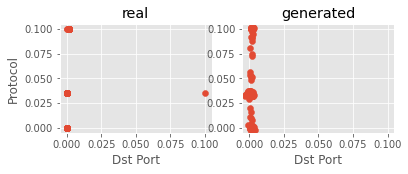

Step: 33700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0710, 0.0712, 0.0722, 0.9972
D Real - D Gen: 0.0010


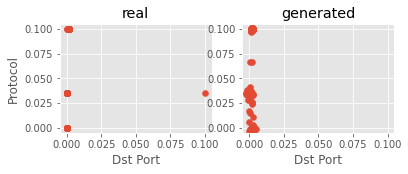

Step: 33800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0724, 0.0713, 0.0730, 0.9917
D Real - D Gen: 0.0017


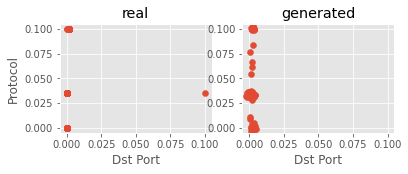

Step: 33900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0702, 0.0715, 0.9972
D Real - D Gen: 0.0013


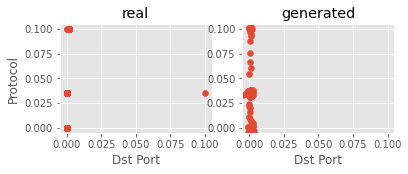

Step: 34000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0716, 0.0731, 1.0000
D Real - D Gen: 0.0015


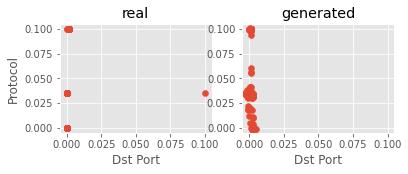

Step: 34100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0725, 0.0720, 0.0731, 1.0000
D Real - D Gen: 0.0011


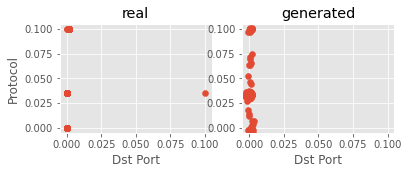

Step: 34200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0704, 0.0703, 0.0713, 0.9945
D Real - D Gen: 0.0009


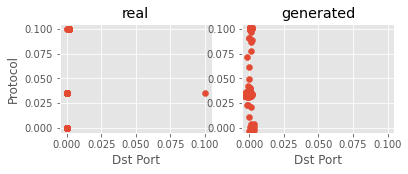

Step: 34300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0700, 0.0699, 0.0711, 1.0000
D Real - D Gen: 0.0012


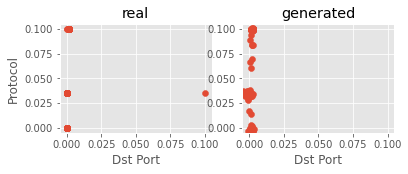

Step: 34400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0719, 0.0714, 0.0729, 0.9972
D Real - D Gen: 0.0015


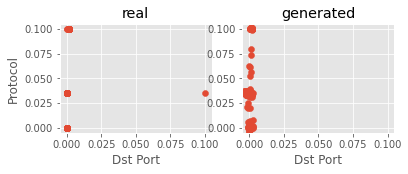

Step: 34500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0704, 0.0712, 0.9945
D Real - D Gen: 0.0007


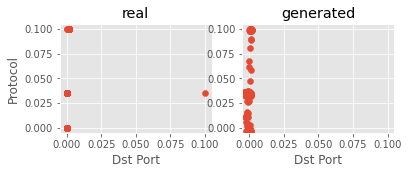

Step: 34600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0702, 0.0704, 0.0716, 0.9917
D Real - D Gen: 0.0012


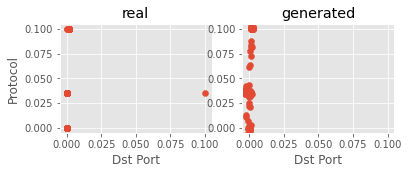

Step: 34700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0698, 0.0704, 0.0713, 1.0000
D Real - D Gen: 0.0009


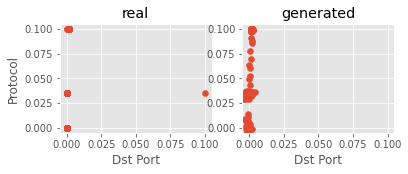

Step: 34800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0704, 0.0719, 0.9972
D Real - D Gen: 0.0015


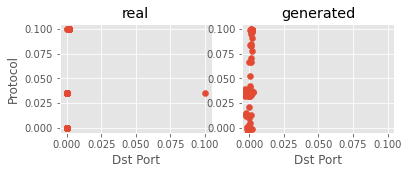

Step: 34900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0705, 0.0718, 0.9972
D Real - D Gen: 0.0012


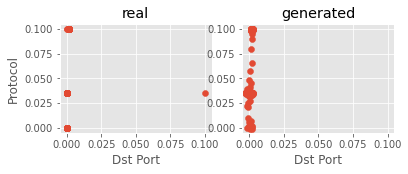

Step: 35000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0711, 0.0721, 1.0000
D Real - D Gen: 0.0011


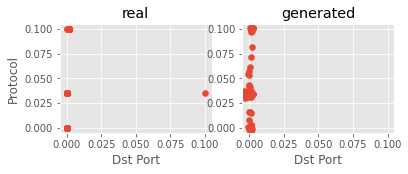

Step: 35100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0705, 0.0717, 1.0000
D Real - D Gen: 0.0012


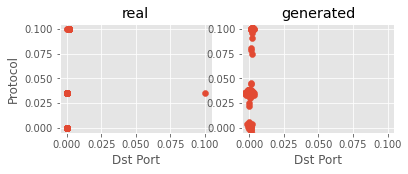

Step: 35200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0709, 0.0719, 0.9862
D Real - D Gen: 0.0010


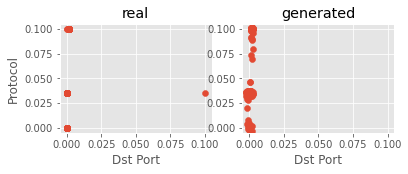

Step: 35300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0699, 0.0703, 0.0711, 1.0000
D Real - D Gen: 0.0008


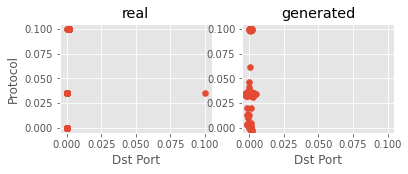

Step: 35400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0708, 0.0708, 0.0720, 0.9945
D Real - D Gen: 0.0012


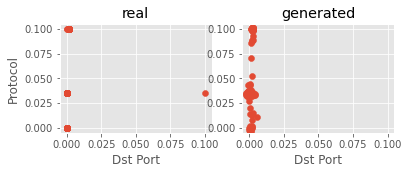

Step: 35500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0701, 0.0705, 0.0715, 1.0000
D Real - D Gen: 0.0010


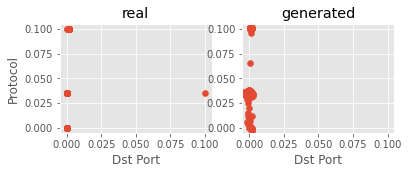

Step: 35600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0702, 0.0714, 1.0000
D Real - D Gen: 0.0012


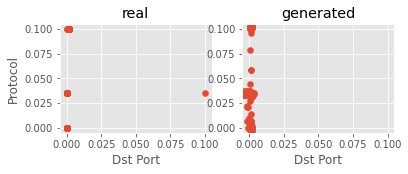

Step: 35700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0705, 0.0714, 0.9890
D Real - D Gen: 0.0009


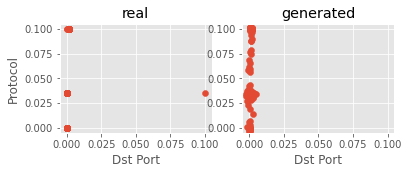

Step: 35800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0701, 0.0714, 0.9972
D Real - D Gen: 0.0013


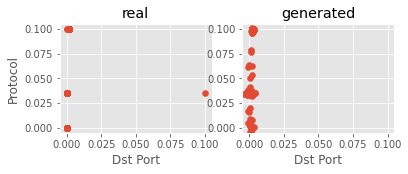

Step: 35900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0706, 0.0711, 1.0000
D Real - D Gen: 0.0005


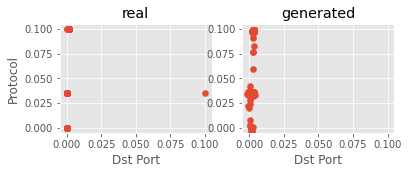

Step: 36000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0700, 0.0697, 0.0709, 0.9862
D Real - D Gen: 0.0012


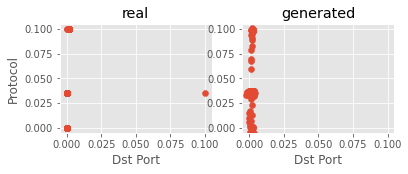

Step: 36100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0711, 0.0718, 1.0000
D Real - D Gen: 0.0007


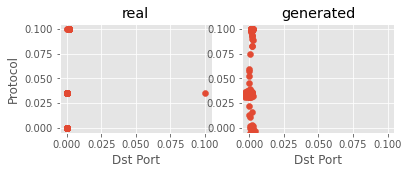

Step: 36200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0701, 0.0706, 0.0711, 0.9862
D Real - D Gen: 0.0005


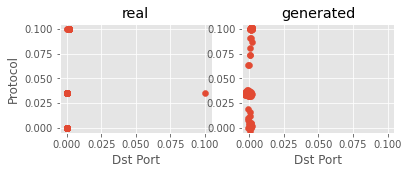

Step: 36300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0718, 0.0729, 0.9917
D Real - D Gen: 0.0011


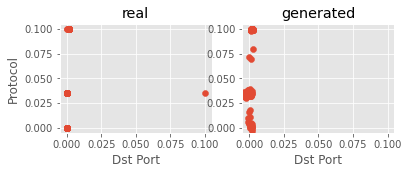

Step: 36400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0722, 0.0730, 1.0000
D Real - D Gen: 0.0008


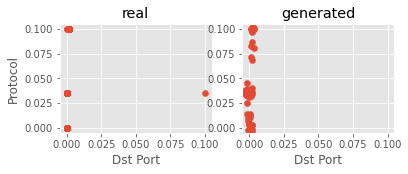

Step: 36500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0713, 0.0723, 0.9972
D Real - D Gen: 0.0011


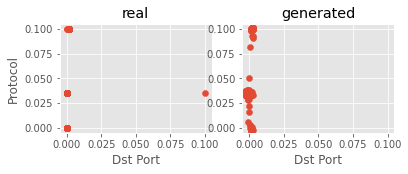

Step: 36600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0721, 0.0718, 0.0730, 0.9945
D Real - D Gen: 0.0012


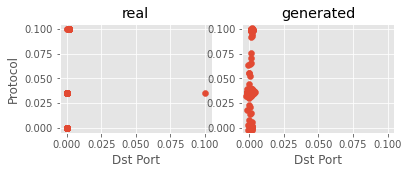

Step: 36700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0705, 0.0711, 0.9890
D Real - D Gen: 0.0005


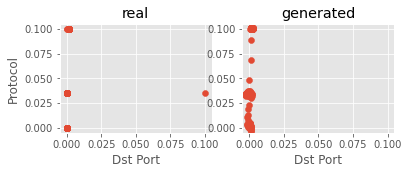

Step: 36800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0708, 0.0708, 0.0722, 0.9917
D Real - D Gen: 0.0015


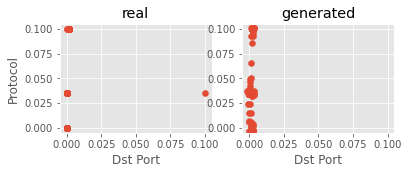

Step: 36900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0701, 0.0702, 0.0712, 0.9972
D Real - D Gen: 0.0010


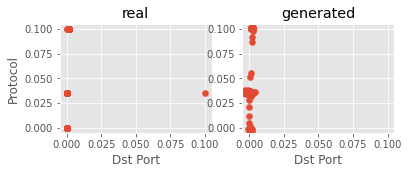

Step: 37000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0704, 0.0711, 1.0000
D Real - D Gen: 0.0006


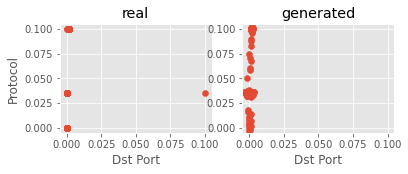

Step: 37100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0697, 0.0697, 0.0711, 0.9972
D Real - D Gen: 0.0014


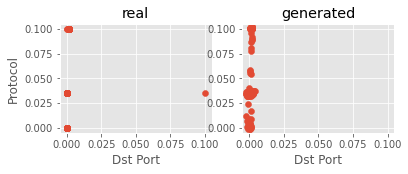

Step: 37200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0702, 0.0715, 0.9972
D Real - D Gen: 0.0013


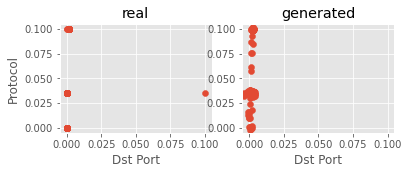

Step: 37300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0693, 0.0695, 0.0704, 1.0000
D Real - D Gen: 0.0008


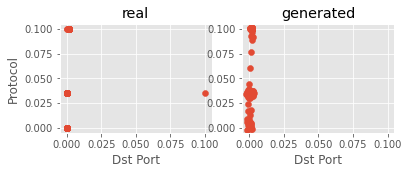

Step: 37400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0693, 0.0696, 0.0703, 0.9945
D Real - D Gen: 0.0007


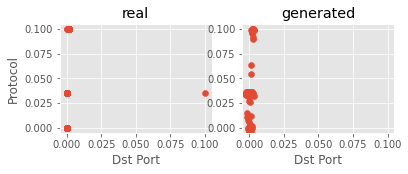

Step: 37500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0709, 0.0717, 0.9945
D Real - D Gen: 0.0009


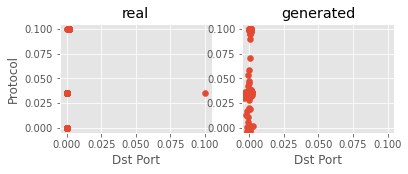

Step: 37600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0694, 0.0698, 0.0713, 0.9972
D Real - D Gen: 0.0015


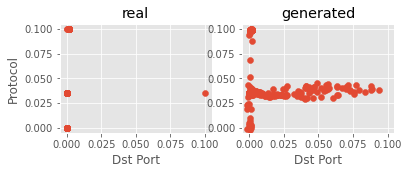

Step: 37700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0700, 0.0726, 1.0000
D Real - D Gen: 0.0026


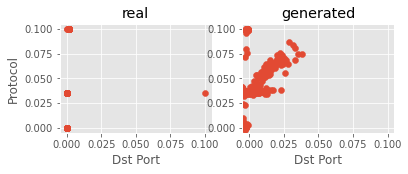

Step: 37800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0728, 0.0731, 0.0733, 1.0000
D Real - D Gen: 0.0002


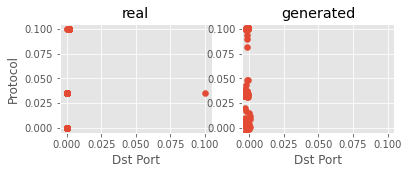

Step: 37900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0712, 0.0724, 1.0000
D Real - D Gen: 0.0012


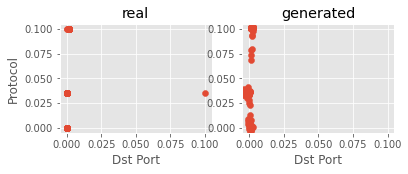

Step: 38000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0714, 0.0720, 0.9917
D Real - D Gen: 0.0006


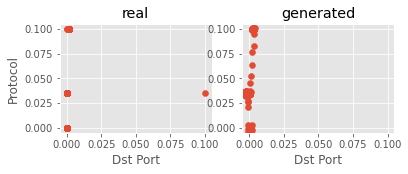

Step: 38100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0723, 0.0722, 0.0730, 0.9945
D Real - D Gen: 0.0008


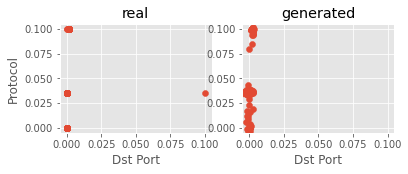

Step: 38200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0726, 0.0729, 0.0734, 1.0000
D Real - D Gen: 0.0005


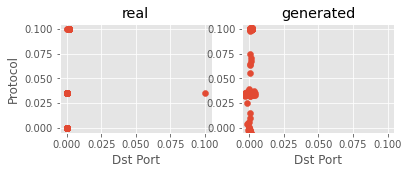

Step: 38300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0727, 0.0738, 0.9917
D Real - D Gen: 0.0011


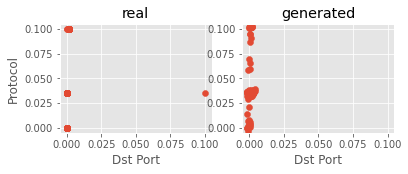

Step: 38400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0716, 0.0724, 0.9945
D Real - D Gen: 0.0008


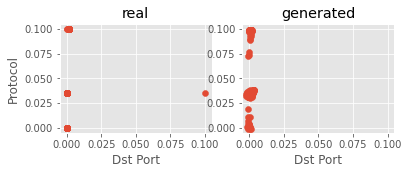

Step: 38500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0715, 0.0724, 1.0000
D Real - D Gen: 0.0009


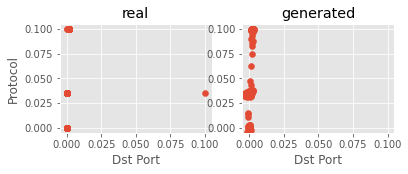

Step: 38600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0715, 0.0726, 0.9917
D Real - D Gen: 0.0011


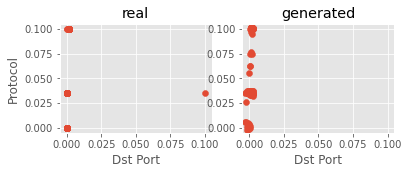

Step: 38700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0706, 0.0713, 1.0000
D Real - D Gen: 0.0007


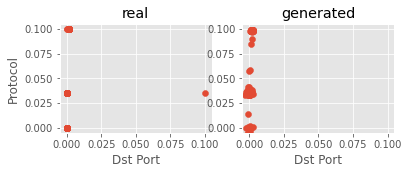

Step: 38800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0699, 0.0702, 0.0712, 1.0000
D Real - D Gen: 0.0010


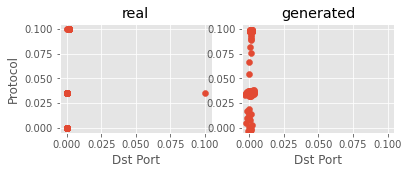

Step: 38900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0710, 0.0712, 0.0722, 0.9724
D Real - D Gen: 0.0010


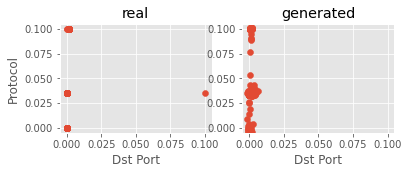

Step: 39000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0712, 0.0722, 0.9945
D Real - D Gen: 0.0010


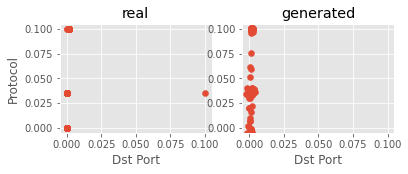

Step: 39100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0713, 0.0710, 0.0721, 0.9862
D Real - D Gen: 0.0011


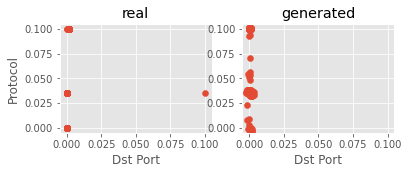

Step: 39200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0717, 0.0719, 0.0728, 0.9972
D Real - D Gen: 0.0009


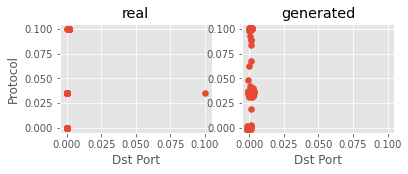

Step: 39300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0709, 0.0719, 0.9972
D Real - D Gen: 0.0010


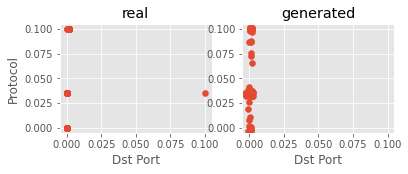

Step: 39400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0710, 0.0717, 1.0000
D Real - D Gen: 0.0007


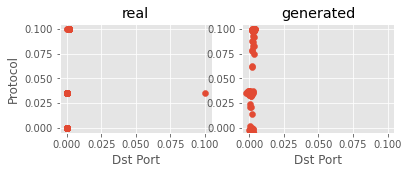

Step: 39500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0722, 0.0724, 0.0730, 0.9945
D Real - D Gen: 0.0006


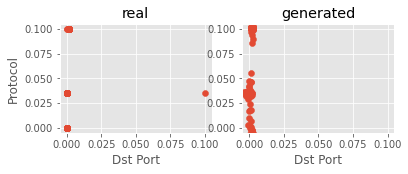

Step: 39600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0714, 0.0719, 0.9917
D Real - D Gen: 0.0006


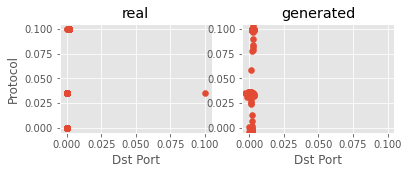

Step: 39700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0713, 0.0720, 0.0727, 1.0000
D Real - D Gen: 0.0007


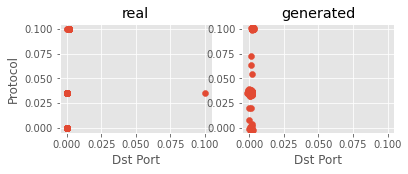

Step: 39800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0708, 0.0711, 0.0718, 0.9945
D Real - D Gen: 0.0006


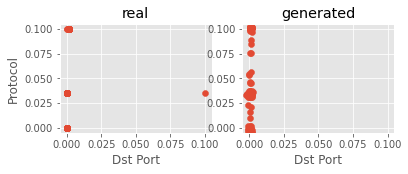

Step: 39900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0717, 0.0723, 0.0731, 0.9917
D Real - D Gen: 0.0008


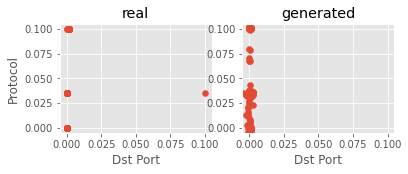

Step: 40000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0706, 0.0719, 1.0000
D Real - D Gen: 0.0013


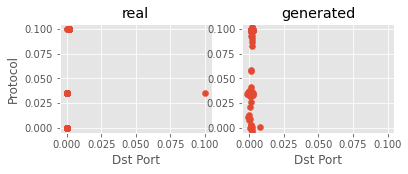

Step: 40100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0713, 0.0719, 0.9945
D Real - D Gen: 0.0005


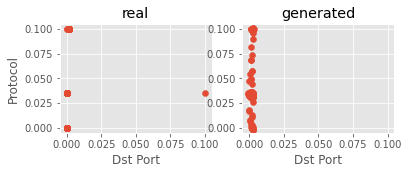

Step: 40200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0709, 0.0717, 0.9807
D Real - D Gen: 0.0009


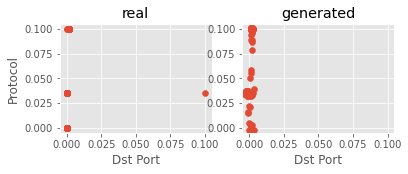

Step: 40300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0708, 0.0708, 0.0715, 0.9917
D Real - D Gen: 0.0007


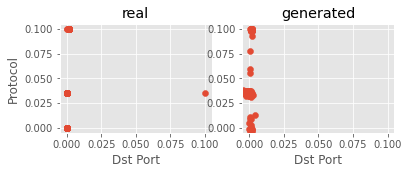

Step: 40400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0711, 0.0718, 0.9972
D Real - D Gen: 0.0008


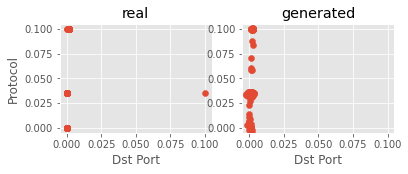

Step: 40500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0717, 0.0714, 0.0723, 1.0000
D Real - D Gen: 0.0009


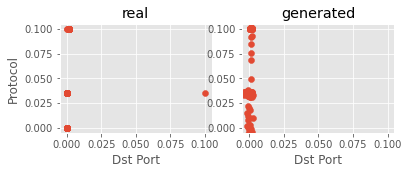

Step: 40600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0723, 0.0726, 0.0737, 1.0000
D Real - D Gen: 0.0011


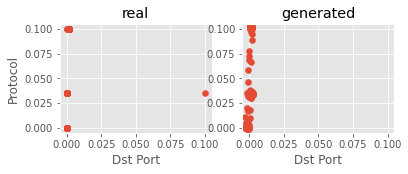

Step: 40700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0727, 0.0725, 0.0729, 0.9890
D Real - D Gen: 0.0004


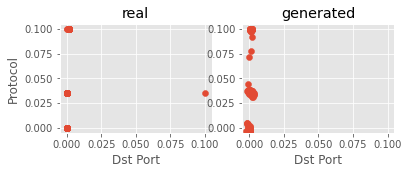

Step: 40800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0712, 0.0721, 1.0000
D Real - D Gen: 0.0010


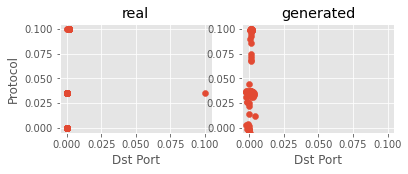

Step: 40900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0717, 0.0712, 0.0723, 1.0000
D Real - D Gen: 0.0012


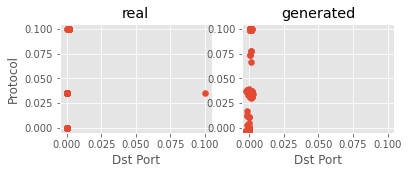

Step: 41000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0715, 0.0721, 1.0000
D Real - D Gen: 0.0006


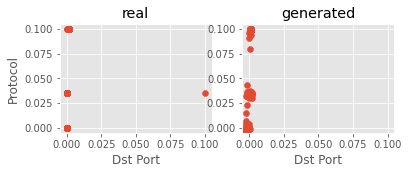

Step: 41100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0710, 0.0717, 0.9890
D Real - D Gen: 0.0007


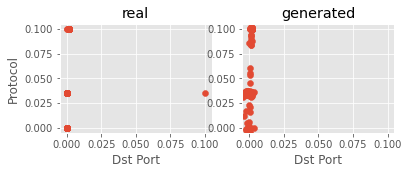

Step: 41200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0709, 0.0717, 0.9917
D Real - D Gen: 0.0008


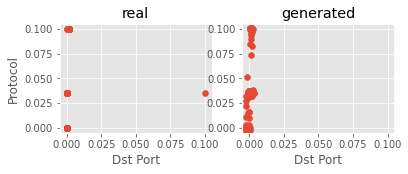

Step: 41300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0713, 0.0710, 0.0719, 1.0000
D Real - D Gen: 0.0010


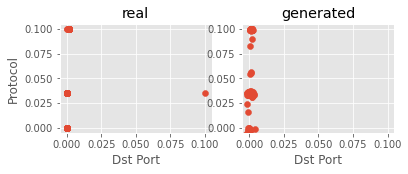

Step: 41400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0720, 0.0726, 0.9972
D Real - D Gen: 0.0006


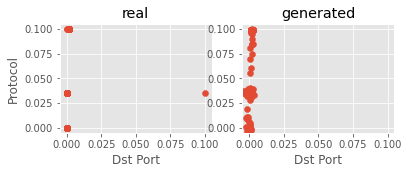

Step: 41500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0713, 0.0720, 0.9972
D Real - D Gen: 0.0007


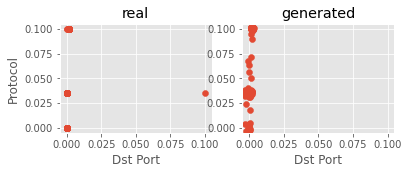

Step: 41600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0704, 0.0706, 0.0714, 0.9972
D Real - D Gen: 0.0008


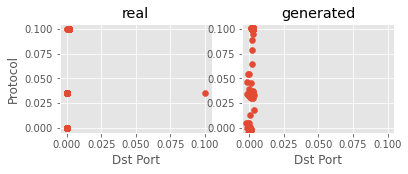

Step: 41700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0710, 0.0716, 0.9945
D Real - D Gen: 0.0006


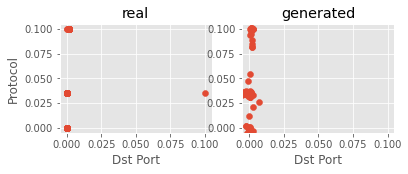

Step: 41800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0716, 0.0724, 0.9917
D Real - D Gen: 0.0008


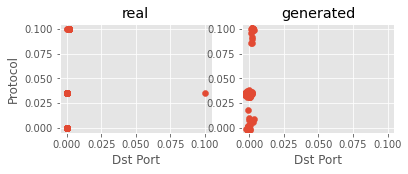

Step: 41900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0711, 0.0722, 0.9972
D Real - D Gen: 0.0011


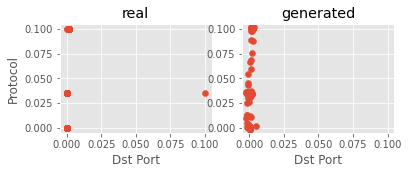

Step: 42000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0718, 0.0719, 0.0727, 1.0000
D Real - D Gen: 0.0007


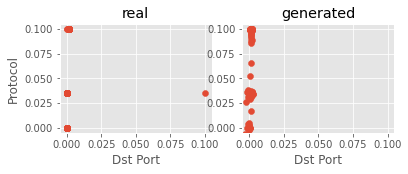

Step: 42100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0713, 0.0715, 0.0724, 0.9917
D Real - D Gen: 0.0009


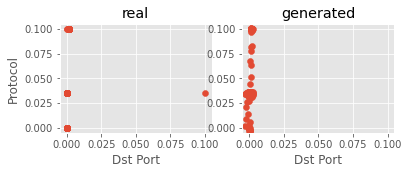

Step: 42200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0720, 0.0719, 0.0729, 1.0000
D Real - D Gen: 0.0010


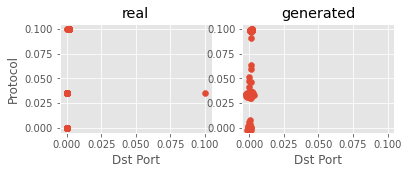

Step: 42300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0699, 0.0695, 0.0711, 0.9972
D Real - D Gen: 0.0015


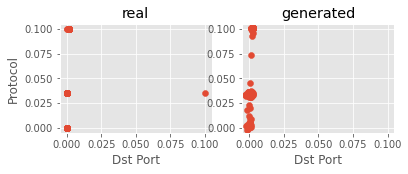

Step: 42400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0699, 0.0700, 0.0709, 0.9972
D Real - D Gen: 0.0009


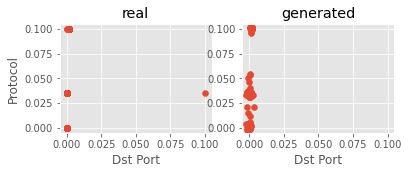

Step: 42500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0705, 0.0707, 0.0716, 1.0000
D Real - D Gen: 0.0009


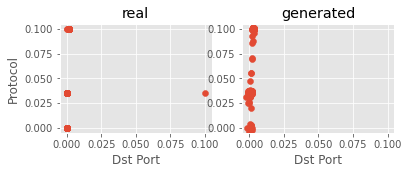

Step: 42600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0704, 0.0701, 0.0711, 1.0000
D Real - D Gen: 0.0010


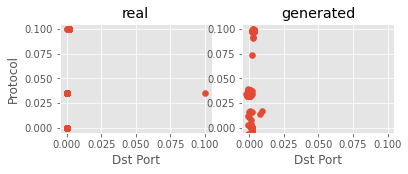

Step: 42700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0705, 0.0702, 0.0711, 0.9972
D Real - D Gen: 0.0009


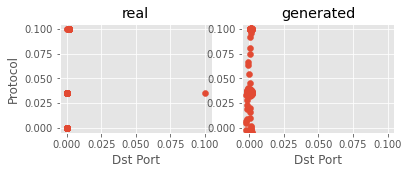

Step: 42800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0711, 0.0719, 0.9972
D Real - D Gen: 0.0008


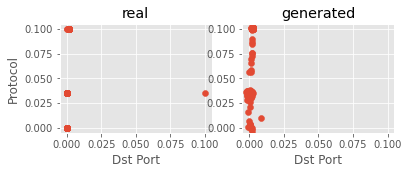

Step: 42900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0710, 0.0719, 0.9972
D Real - D Gen: 0.0009


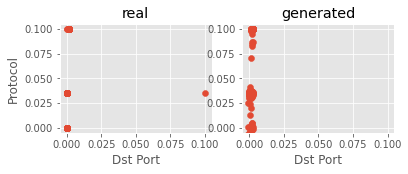

Step: 43000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0703, 0.0713, 0.9972
D Real - D Gen: 0.0010


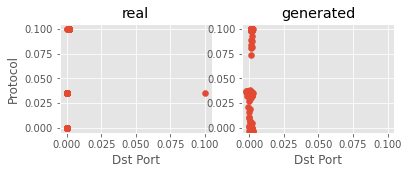

Step: 43100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0698, 0.0698, 0.0709, 1.0000
D Real - D Gen: 0.0011


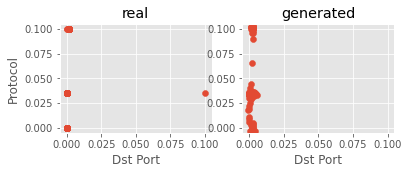

Step: 43200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0715, 0.0722, 1.0000
D Real - D Gen: 0.0006


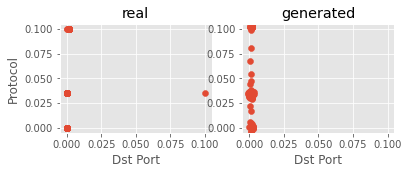

Step: 43300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0705, 0.0701, 0.0711, 1.0000
D Real - D Gen: 0.0010


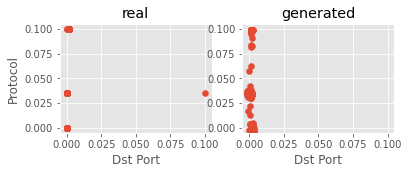

Step: 43400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0704, 0.0712, 1.0000
D Real - D Gen: 0.0008


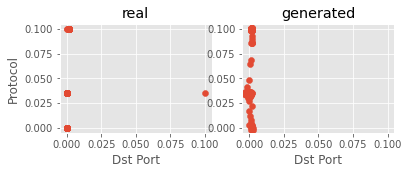

Step: 43500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0705, 0.0704, 0.0712, 1.0000
D Real - D Gen: 0.0008


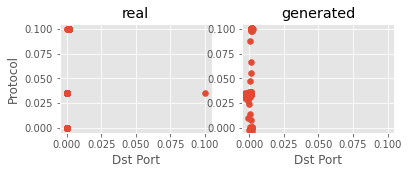

Step: 43600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0687, 0.0688, 0.0696, 1.0000
D Real - D Gen: 0.0009


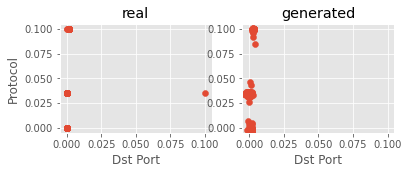

Step: 43700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0688, 0.0690, 0.0697, 0.9945
D Real - D Gen: 0.0006


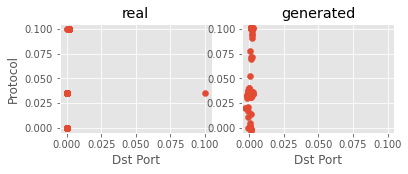

Step: 43800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0696, 0.0695, 0.0705, 0.9890
D Real - D Gen: 0.0010


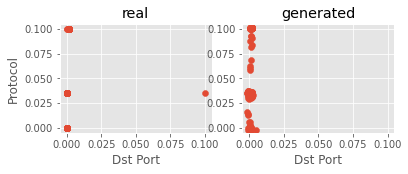

Step: 43900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0708, 0.0716, 0.9862
D Real - D Gen: 0.0008


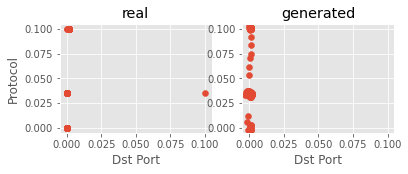

Step: 44000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0691, 0.0692, 0.0699, 0.9972
D Real - D Gen: 0.0007


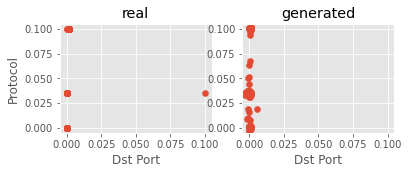

Step: 44100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0689, 0.0693, 0.0695, 0.9862
D Real - D Gen: 0.0002


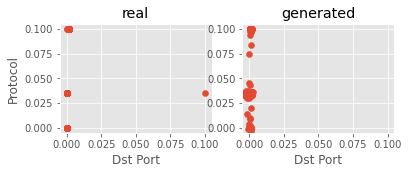

Step: 44200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0699, 0.0698, 0.0702, 0.9945
D Real - D Gen: 0.0005


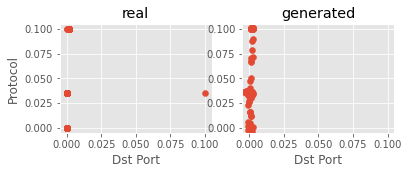

Step: 44300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0701, 0.0706, 0.9917
D Real - D Gen: 0.0005


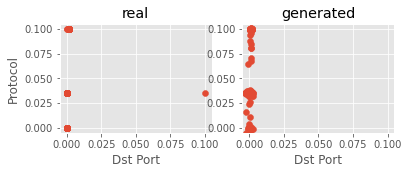

Step: 44400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0701, 0.0701, 0.0710, 0.9862
D Real - D Gen: 0.0009


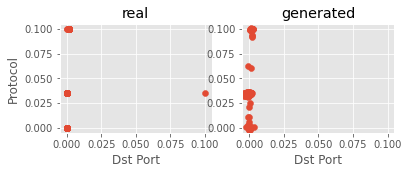

Step: 44500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0712, 0.0726, 0.9972
D Real - D Gen: 0.0014


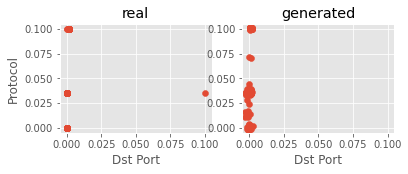

Step: 44600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0711, 0.0719, 0.9751
D Real - D Gen: 0.0008


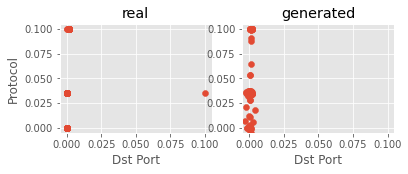

Step: 44700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0717, 0.0714, 0.0727, 0.9945
D Real - D Gen: 0.0013


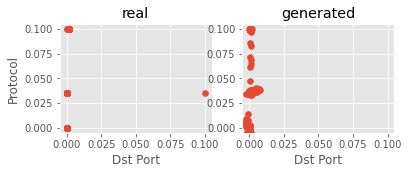

Step: 44800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0708, 0.0714, 1.0000
D Real - D Gen: 0.0006


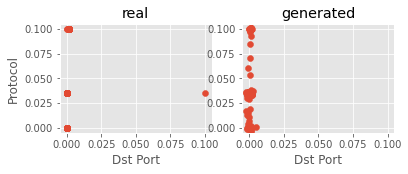

Step: 44900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0718, 0.0722, 0.9945
D Real - D Gen: 0.0005


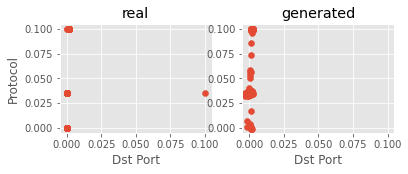

Step: 45000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0710, 0.0717, 1.0000
D Real - D Gen: 0.0007


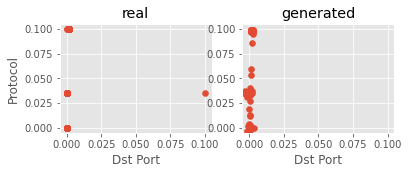

Step: 45100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0708, 0.0711, 0.0721, 0.9972
D Real - D Gen: 0.0010


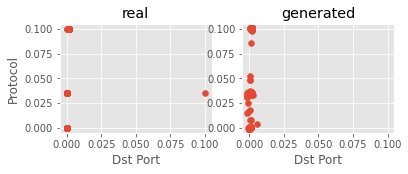

Step: 45200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0714, 0.0712, 0.0721, 0.9972
D Real - D Gen: 0.0009


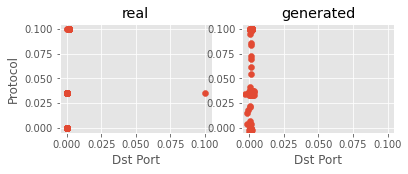

Step: 45300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0705, 0.0705, 0.0710, 1.0000
D Real - D Gen: 0.0005


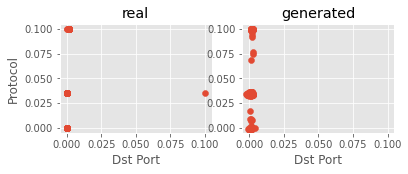

Step: 45400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0702, 0.0704, 0.0710, 1.0000
D Real - D Gen: 0.0006


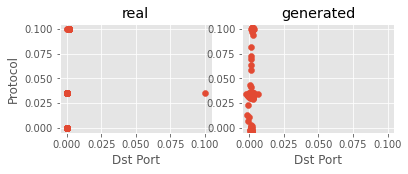

Step: 45500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0714, 0.0721, 0.9972
D Real - D Gen: 0.0006


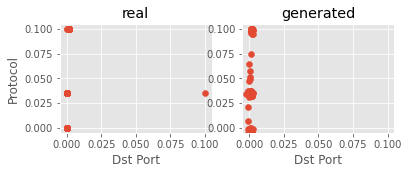

Step: 45600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0706, 0.0715, 0.9945
D Real - D Gen: 0.0009


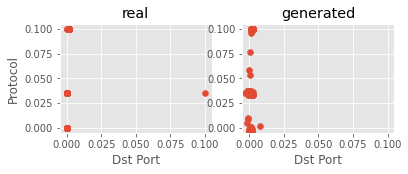

Step: 45700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0705, 0.0704, 0.0713, 1.0000
D Real - D Gen: 0.0009


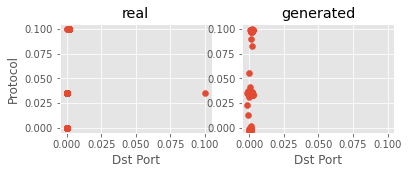

Step: 45800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0713, 0.0720, 0.9972
D Real - D Gen: 0.0007


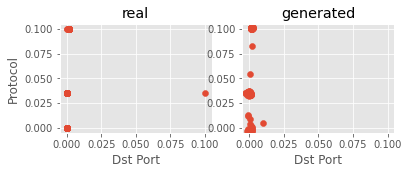

Step: 45900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0693, 0.0694, 0.0702, 1.0000
D Real - D Gen: 0.0008


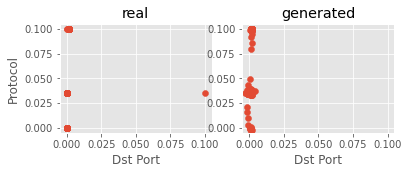

Step: 46000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0706, 0.0710, 1.0000
D Real - D Gen: 0.0004


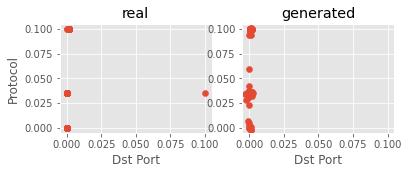

Step: 46100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0705, 0.0704, 0.0713, 0.9972
D Real - D Gen: 0.0010


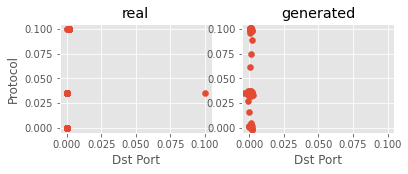

Step: 46200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0708, 0.0717, 1.0000
D Real - D Gen: 0.0008


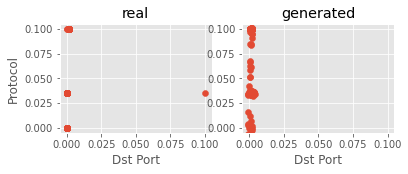

Step: 46300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0711, 0.0710, 0.0717, 0.9972
D Real - D Gen: 0.0007


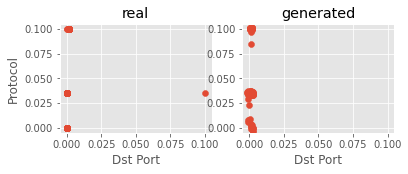

Step: 46400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0713, 0.0714, 0.0723, 0.9917
D Real - D Gen: 0.0009


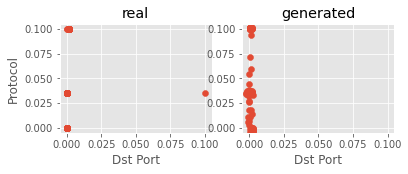

Step: 46500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0712, 0.0715, 0.0724, 1.0000
D Real - D Gen: 0.0008


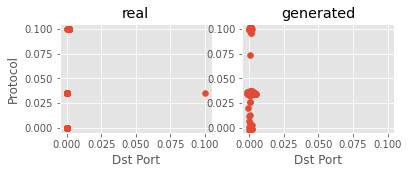

Step: 46600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0707, 0.0714, 1.0000
D Real - D Gen: 0.0007


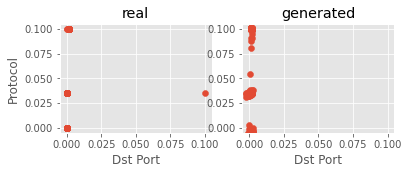

Step: 46700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0696, 0.0711, 0.9972
D Real - D Gen: 0.0014


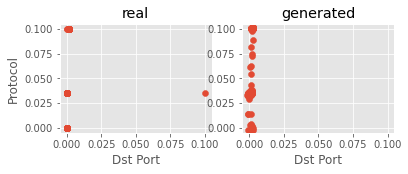

Step: 46800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0711, 0.0717, 1.0000
D Real - D Gen: 0.0006


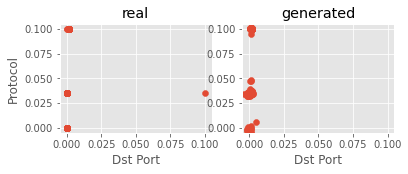

Step: 46900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0710, 0.0719, 1.0000
D Real - D Gen: 0.0009


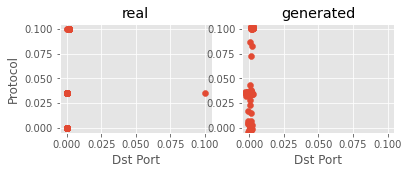

Step: 47000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0709, 0.0712, 0.0719, 0.9834
D Real - D Gen: 0.0007


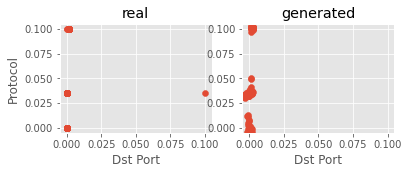

Step: 47100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0710, 0.0714, 0.0722, 0.9972
D Real - D Gen: 0.0008


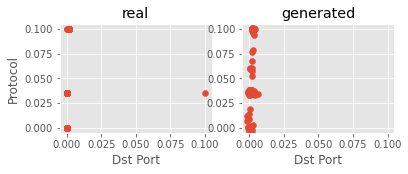

Step: 47200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0702, 0.0705, 0.0710, 1.0000
D Real - D Gen: 0.0006


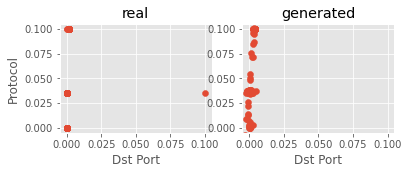

Step: 47300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0702, 0.0702, 0.0711, 0.9917
D Real - D Gen: 0.0009


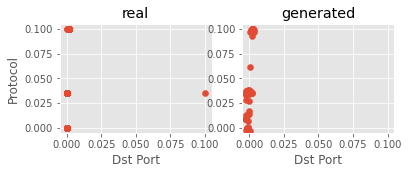

Step: 47400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0704, 0.0703, 0.0710, 0.9972
D Real - D Gen: 0.0007


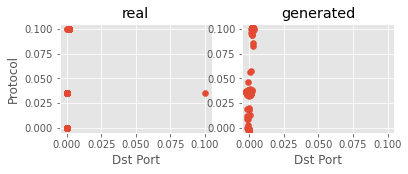

Step: 47500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0699, 0.0700, 0.0704, 0.9945
D Real - D Gen: 0.0004


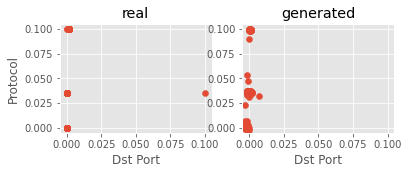

Step: 47600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0700, 0.0702, 0.0708, 0.9972
D Real - D Gen: 0.0006


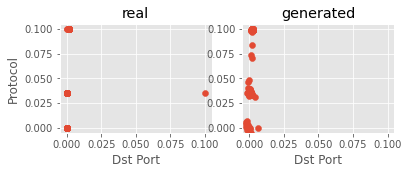

Step: 47700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0698, 0.0699, 0.0703, 0.9945
D Real - D Gen: 0.0004


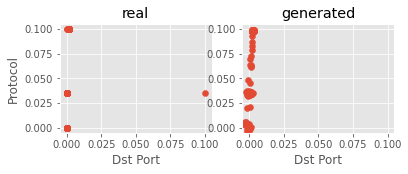

Step: 47800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0701, 0.0705, 0.0712, 0.9972
D Real - D Gen: 0.0007


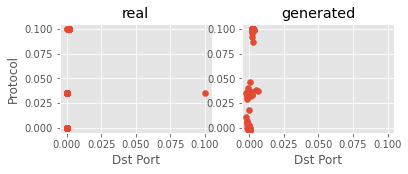

Step: 47900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0704, 0.0705, 0.0714, 0.9917
D Real - D Gen: 0.0009


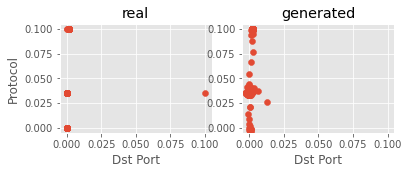

Step: 48000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0702, 0.0707, 1.0000
D Real - D Gen: 0.0005


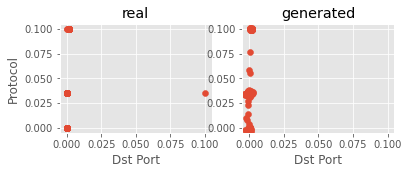

Step: 48100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0705, 0.0713, 0.0720, 1.0000
D Real - D Gen: 0.0007


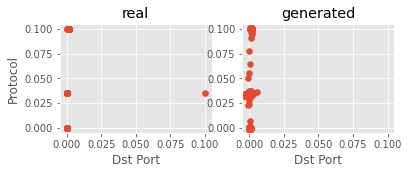

Step: 48200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0715, 0.0718, 0.0723, 0.9972
D Real - D Gen: 0.0005


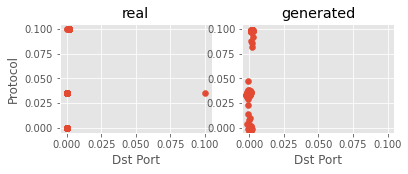

Step: 48300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0706, 0.0712, 0.9972
D Real - D Gen: 0.0006


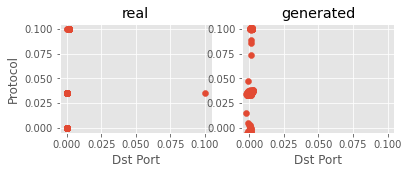

Step: 48400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0707, 0.0712, 0.9945
D Real - D Gen: 0.0004


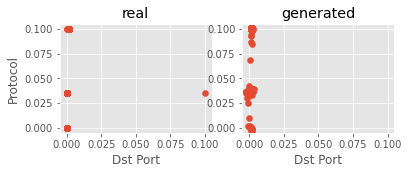

Step: 48500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0707, 0.0710, 0.0719, 0.9972
D Real - D Gen: 0.0009


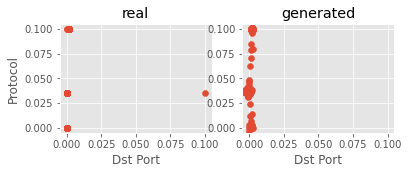

Step: 48600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0723, 0.0720, 0.0723, 0.9972
D Real - D Gen: 0.0003


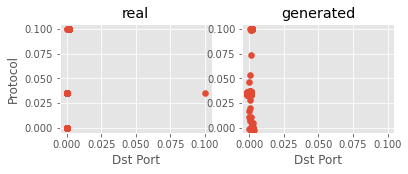

Step: 48700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0710, 0.0712, 0.0719, 0.9972
D Real - D Gen: 0.0008


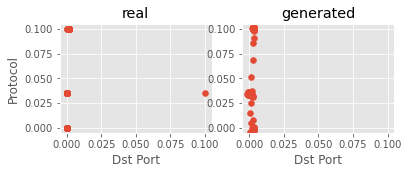

Step: 48800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0694, 0.0691, 0.0702, 1.0000
D Real - D Gen: 0.0011


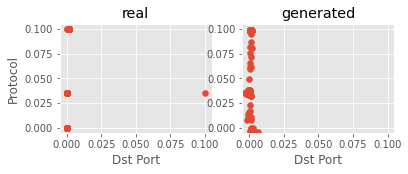

Step: 48900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0705, 0.0708, 0.0711, 1.0000
D Real - D Gen: 0.0003


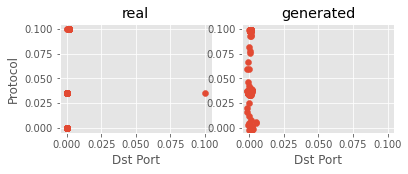

Step: 49000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0695, 0.0698, 0.0703, 1.0000
D Real - D Gen: 0.0005


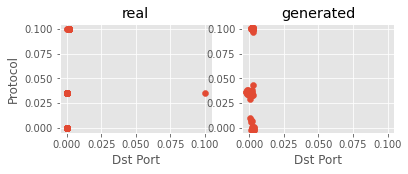

Step: 49100 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0696, 0.0695, 0.0701, 0.9972
D Real - D Gen: 0.0006


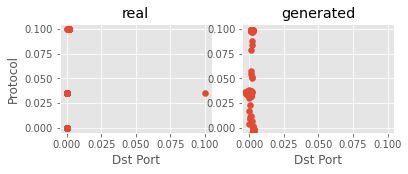

Step: 49200 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0692, 0.0694, 0.0702, 0.9917
D Real - D Gen: 0.0008


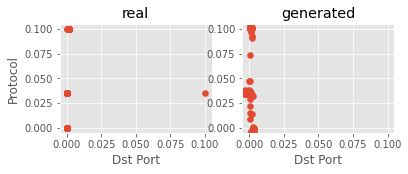

Step: 49300 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0699, 0.0701, 0.0709, 1.0000
D Real - D Gen: 0.0008


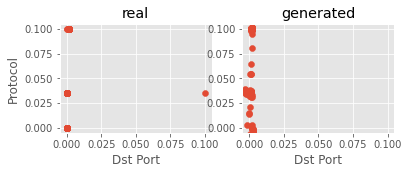

Step: 49400 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0689, 0.0690, 0.0695, 0.9917
D Real - D Gen: 0.0005


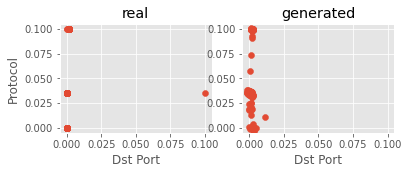

Step: 49500 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0693, 0.0690, 0.0697, 0.9890
D Real - D Gen: 0.0007


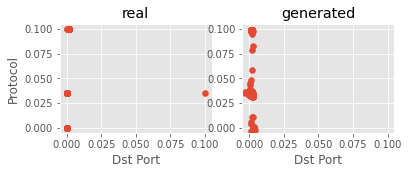

Step: 49600 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0699, 0.0698, 0.0704, 1.0000
D Real - D Gen: 0.0006


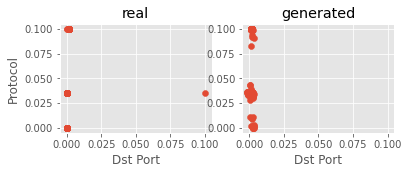

Step: 49700 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0698, 0.0699, 0.0706, 0.9972
D Real - D Gen: 0.0007


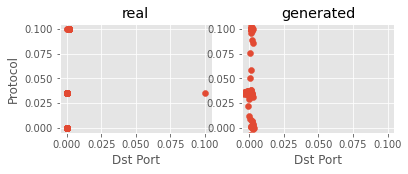

Step: 49800 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0703, 0.0701, 0.0708, 0.9972
D Real - D Gen: 0.0007


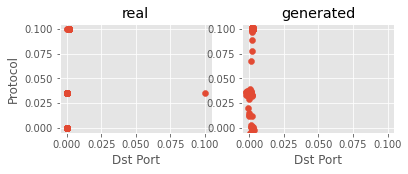

Step: 49900 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0688, 0.0690, 0.0699, 0.9972
D Real - D Gen: 0.0010


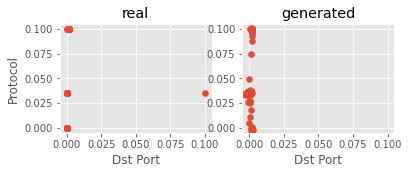

Step: 50000 of 50001.
Losses: G, D Gen, D Real, Xgb: -0.0688, 0.0688, 0.0695, 0.9890
D Real - D Gen: 0.0006


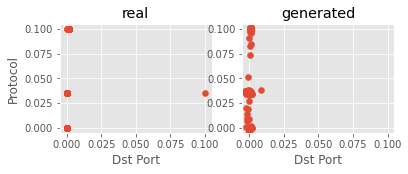

In [ ]:
adversarial_training_WGAN(arguments, train_no_label, data_cols=data_cols )

data_dim:  79
data_cols:  ['Dst Port', 'Protocol', 'Timestamp', 'Flow Duration', 'Tot Fwd Pkts', 'Tot Bwd Pkts', 'TotLen Fwd Pkts', 'TotLen Bwd Pkts', 'Fwd Pkt Len Max', 'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std', 'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean', 'Bwd Pkt Len Std', 'Flow Byts/s', 'Flow Pkts/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Len', 'Bwd Header Len', 'Fwd Pkts/s', 'Bwd Pkts/s', 'Pkt Len Min', 'Pkt Len Max', 'Pkt Len Mean', 'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt', 'SYN Flag Cnt', 'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'URG Flag Cnt', 'CWE Flag Count', 'ECE Flag Cnt', 'Down/Up Ratio', 'Pkt Size Avg', 'Fwd Seg Size Avg', 'Bwd Seg Size Avg', 'Fwd Byts/b Avg', 'Fwd Pkts/b Avg', '

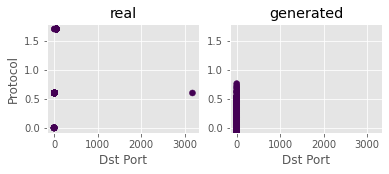

Step: 100 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.0106, 22.7899, 21235996033024.0000, 1.0000
D Real - D Gen: 21235996033001.2109


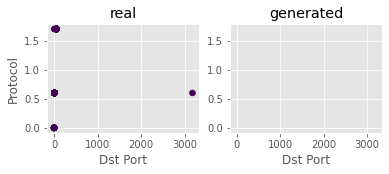

Step: 200 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.0123, 29.9378, 31791750578176.0000, 1.0000
D Real - D Gen: 31791750578146.0625


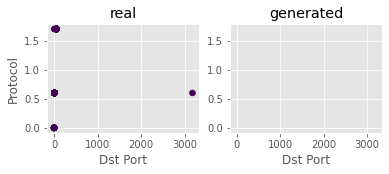

Step: 300 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.0169, 42.7907, 22895665348608.0000, 1.0000
D Real - D Gen: 22895665348565.2109


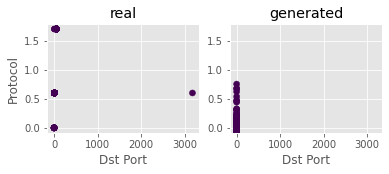

Step: 400 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.0370, 82.3662, 36004576624640.0000, 1.0000
D Real - D Gen: 36004576624557.6328


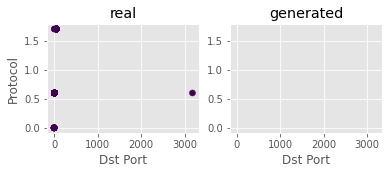

Step: 500 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.1272, 275.0866, 55631436316672.0000, 1.0000
D Real - D Gen: 55631436316396.9141


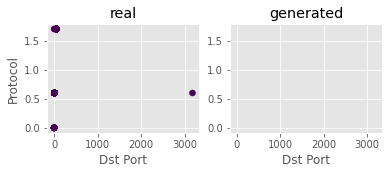

Step: 600 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.1428, 311.5105, 52002994257920.0000, 1.0000
D Real - D Gen: 52002994257608.4922


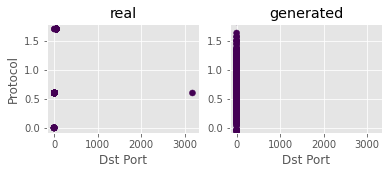

Step: 700 of 50001.
Losses: G, D Gen, D Real, Xgb: 7.5263, 25.0820, 45341030219776.0000, 1.0000
D Real - D Gen: 45341030219750.9219


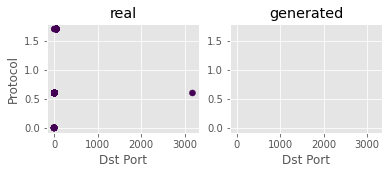

Step: 800 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.0626, 177.3714, 12916677935104.0000, 1.0000
D Real - D Gen: 12916677934926.6289


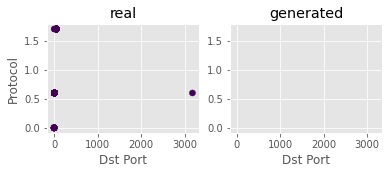

Step: 900 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.4596, 918.2255, 75332249976832.0000, 1.0000
D Real - D Gen: 75332249975913.7812


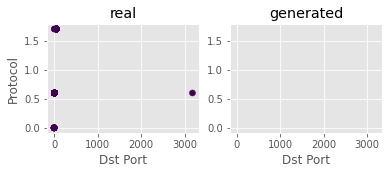

Step: 1000 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.3443, 692.9256, 85100884656128.0000, 1.0000
D Real - D Gen: 85100884655435.0781


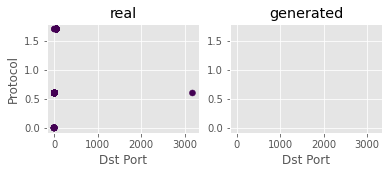

Step: 1100 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.1558, 384.3711, 84189948936192.0000, 1.0000
D Real - D Gen: 84189948935807.6250


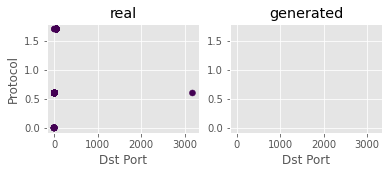

Step: 1200 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.3761, 819.3044, 99893825765376.0000, 1.0000
D Real - D Gen: 99893825764556.7031


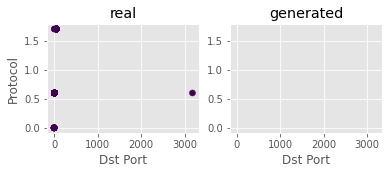

Step: 1300 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.5125, 943.9139, 98264288329728.0000, 1.0000
D Real - D Gen: 98264288328784.0938


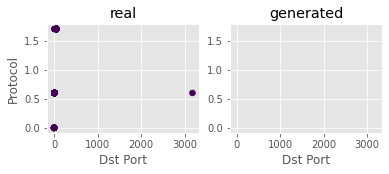

Step: 1400 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.4920, 1088.6880, 103048210808832.0000, 1.0000
D Real - D Gen: 103048210807743.3125


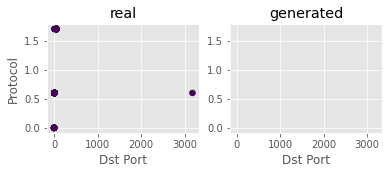

Step: 1500 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.5366, 1203.4587, 80050808422400.0000, 1.0000
D Real - D Gen: 80050808421196.5469


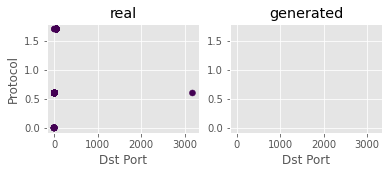

Step: 1600 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.5493, 1328.6265, 95676973187072.0000, 1.0000
D Real - D Gen: 95676973185743.3750


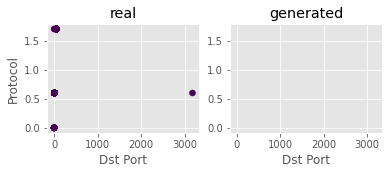

Step: 1700 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.7990, 1668.5294, 94972330115072.0000, 1.0000
D Real - D Gen: 94972330113403.4688


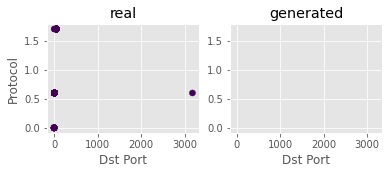

Step: 1800 of 50001.
Losses: G, D Gen, D Real, Xgb: 0.9986, 2042.1257, 96026744586240.0000, 1.0000
D Real - D Gen: 96026744584197.8750


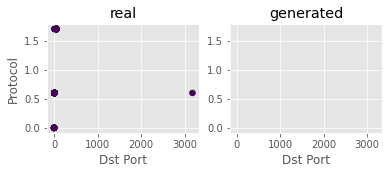

In [ ]:
adversarial_training_GAN(arguments, train, data_cols, label_cols=label_cols ) # CGAN

In [ ]:

%%time

# Training the vanilla GAN and CGAN architectures

k_d = 1  # number of critic network updates per adversarial training step
learning_rate = 5e-4 # 5e-5
arguments = [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ]

adversarial_training_GAN(arguments, train_no_label, data_cols ) # GAN
adversarial_training_GAN(arguments, train, data_cols=data_cols, label_cols=label_cols ) # CGAN

In [ ]:
seed = 17

train = df_Brute_web.copy().reset_index(drop=True) # fraud only with labels from classification

# train = pd.get_dummies(train, columns=['Class'], prefix='Class', drop_first=True)
label_cols = [ i for i in train.columns if 'Label' in i ]
data_cols = [ i for i in train.columns if i not in label_cols ]
train[ data_cols ] = train[ data_cols ] / 10 # scale to random noise size, one less thing to learn
train_no_label = train[ data_cols ]

data_dim = len(data_cols)
label_dim = len(label_cols)
with_class = False
if label_dim > 0: with_class = True
np.random.seed(seed)
#generator_model, discriminator_model, combined_model = define_models_WGAN(rand_dim, data_dim, label_dim, base_n_count)

#generator_model.load_weights('/content/weights/WGAN_generator_model_weights_step_50000.h5')

In [ ]:
generator_model, discriminator_model, combined_model = define_models_GAN(rand_dim, data_dim, base_n_count, type='Wasserstein')
generator_model.load_weights('/content/weights/WGAN_generator_model_weights_step_50000.h5')

In [ ]:
with_class=False

In [ ]:

test_size = 362 # Equal to all of the fraud cases

x = get_data_batch(train, test_size, seed=17)
print(x.shape)

print(x.shape)
z = np.random.normal(size=(test_size, rand_dim))
if with_class:
    labels = x[:,-label_dim:]
    g_z = generator_model.predict([z, labels])
else:
    g_z = generator_model.predict(z)


(362, 79)
(362, 79)


In [ ]:
print(g_z)

[[  4.595669     5.6027102  244.70067    ...  -4.7455287    0.96772456
    0.6206985 ]
 [  6.176527     6.4922585  313.37158    ...  -5.6152806    1.164313
    0.7649969 ]
 [  6.4008355    7.36648    342.3131     ...  -6.0829544    2.2628794
    1.5052074 ]
 ...
 [  5.5965624    6.7562337  303.59607    ...  -5.6382046    1.3983921
    0.6359559 ]
 [  4.617181     5.5946627  256.34442    ...  -4.4781375    1.1771954
    0.92464256]
 [  5.002727     5.8507833  268.99084    ...  -5.462904     1.2310792
    0.8030401 ]]


In [ ]:
test_samples = pd.DataFrame(g_z, columns=data_cols)
print(test_samples.head())

   Dst Port  Protocol  Timestamp  ...  Idle Std  Idle Max  Idle Min
0  0.000041  0.036514   0.070704  ...  0.001562  0.000139  0.000451
1 -0.002130  0.035722   0.083415  ...  0.000327  0.000775  0.001097
2 -0.000784  0.036047   0.087242  ...  0.000356 -0.001257  0.000237
3  0.000830  0.099884   0.055171  ...  0.100615  0.075350  0.012469
4  0.000823  0.100678   0.075089  ...  0.101372  0.074965  0.011956

[5 rows x 79 columns]


In [ ]:
print( CheckAccuracy( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim ) )

PlotData( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim )

ValueError: ignored

In [ ]:
print(train.head())

   Dst Port  Protocol            Timestamp  ...  Idle Max  Idle Min  Label
0        80         6  1519380270000000000  ...         0         0      1
1        80         6  1519380270000000000  ...         0         0      1
2        80         6  1519380325000000000  ...         0         0      1
3         0         0  1519380157000000000  ...  56320516  56320440      1
4       500        17  1519380170000000000  ...  41990219   7200399      1

[5 rows x 80 columns]


# Evaluation

In [ ]:
train = df_Brute_web.copy().reset_index(drop=True)
train.drop('Label',axis=1,inplace=True)

generated by WGAN 

In [ ]:
print(train.head())
print(test_samples.head())

   Dst Port  Protocol  Timestamp  ...  Idle Std  Idle Max  Idle Min
0  0.002515  0.352941   0.447907  ...  0.000000  0.000000  0.000000
1  0.002515  0.352941   0.447907  ...  0.000000  0.000000  0.000000
2  0.002515  0.352941   0.456563  ...  0.000000  0.000000  0.000000
3  0.000000  0.000000   0.430123  ...  0.000004  0.999996  0.999996
4  0.015719  1.000000   0.432169  ...  0.999940  0.745555  0.127847

[5 rows x 79 columns]
   Dst Port  Protocol  Timestamp  ...  Idle Std  Idle Max  Idle Min
0  0.000041  0.036514   0.070704  ...  0.001562  0.000139  0.000451
1 -0.002130  0.035722   0.083415  ...  0.000327  0.000775  0.001097
2 -0.000784  0.036047   0.087242  ...  0.000356 -0.001257  0.000237
3  0.000830  0.099884   0.055171  ...  0.100615  0.075350  0.012469
4  0.000823  0.100678   0.075089  ...  0.101372  0.074965  0.011956

[5 rows x 79 columns]


In [ ]:
test_size = 362 # Equal to all of the fraud cases


x = get_data_batch(train, test_size, seed=17)
y=get_data_batch(test_samples, test_size, seed=17)

In [ ]:
print(x.shape)
print(y.shape)

(362, 79)
(362, 79)


In [ ]:
real_samples = pd.DataFrame(x, columns=data_cols)
test_samples = pd.DataFrame(y, columns=data_cols)
real_samples['syn_label'] = 0
test_samples['syn_label'] = 1

training_fraction = 0.5
n_real, n_test = int(len(real_samples)*training_fraction), int(len(test_samples)*training_fraction)
train_df = pd.concat([real_samples[:n_real],test_samples[:n_test]],axis=0)
test_df = pd.concat([real_samples[n_real:],test_samples[n_test:]],axis=0)

# X_col = test_df.columns[:-(label_dim+1)]
X_col = test_df.columns[:-1]
y_col = test_df.columns[-1]
dtrain = xgb.DMatrix(train_df[X_col], train_df[y_col], feature_names=X_col)
dtest = xgb.DMatrix(test_df[X_col], feature_names=X_col)
y_true = test_df['syn_label']

# dtrain = np.vstack( [ x[:int(len(x)/2)], g_z[:int(len(g_z)/2)] ] )
# dlabels = np.hstack( [ np.zeros(int(len(x)/2)), np.ones(int(len(g_z)/2)) ] )
# dtest = np.vstack( [ x[int(len(x)/2):], g_z[int(len(g_z)/2):] ] )

# dtrain = xgb.DMatrix(dtrain, dlabels, feature_names=data_cols+label_cols)
# dtest = xgb.DMatrix(dtest, feature_names=data_cols+label_cols)
# y_true = dlabels

xgb_params = {
    'max_depth': 4,
    'objective': 'binary:logistic',
    'random_state': 0,
    'eval_metric': 'auc', # allows for balanced or unbalanced classes 
}
xgb_test = xgb.train(xgb_params, dtrain, num_boost_round=10)

y_pred = np.round(xgb_test.predict(dtest))

print( '{:.2f}'.format(SimpleAccuracy(y_pred, y_true)) )

1.00


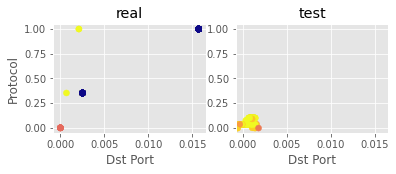

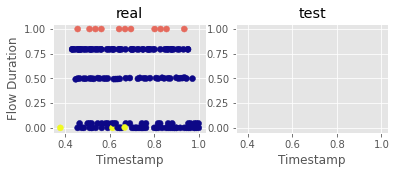

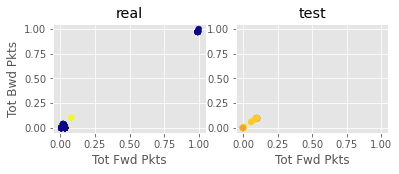

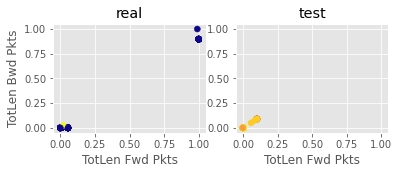

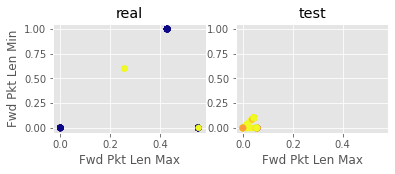

...

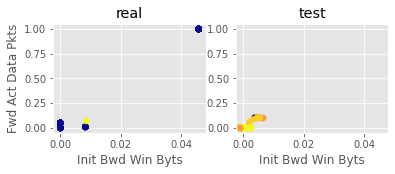

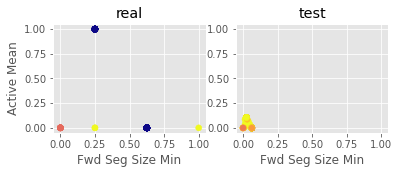

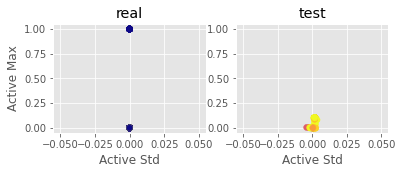

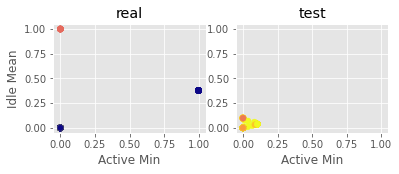

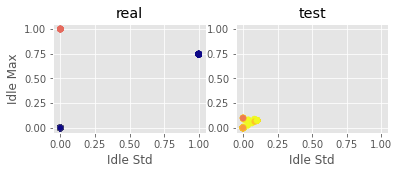

In [ ]:
y_pred0 = xgb_test.predict(dtest)

for i in range(0,len(X_col)-1, 2):

    f, axarr = plt.subplots(1, 2, figsize=(6,2) )

    axarr[0].scatter( test_df[:n_real][X_col[i]], test_df[:n_real][X_col[i+1]], c=y_pred0[:n_real], cmap='plasma'  )
    axarr[0].set_title('real')
    axarr[0].set_ylabel(X_col[i+1])

    axarr[1].scatter( test_df[n_real:][X_col[i]], test_df[n_real:][X_col[i+1]], c=y_pred0[n_real:], cmap='plasma'  )
    axarr[1].set_title('test')
    axarr[1].set_xlim(axarr[0].get_xlim()), axarr[1].set_ylim(axarr[0].get_ylim())

    for a in axarr:
        a.set_xlabel(X_col[i])

    plt.show()

In [ ]:
df_gen.reset_index(drop=True, inplace=True)

In [ ]:
print(df_gen.head())

In [ ]:
sorted_x=data_cols

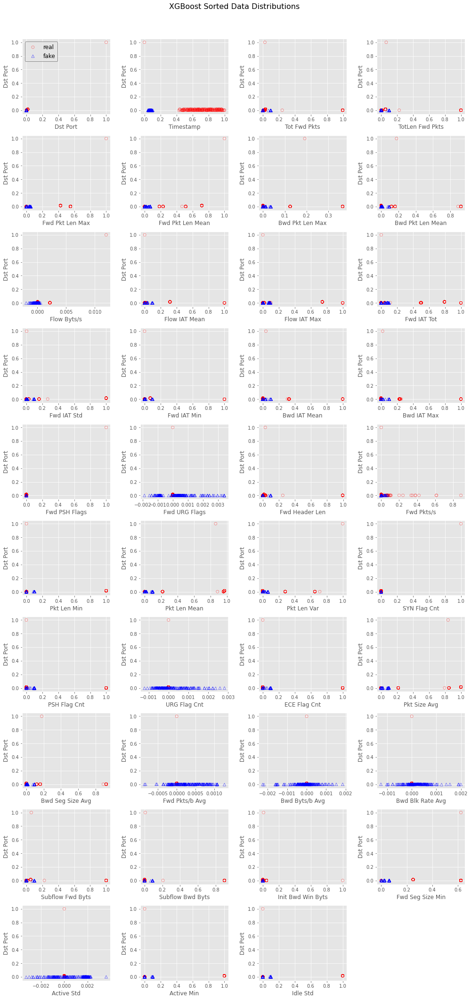

In [ ]:
# Plot all of the training data with paired features sorted by importance
# This takes a while

colors = ['red','blue']
markers = ['o','^']
labels = ['real','fake']
alphas = [0.7, 0.9]

columns = 4
rows = int( np.ceil( len(data_cols) / columns / 2 ) )
plt.figure( figsize=(columns*3.5, rows*3) )
plt.suptitle('XGBoost Sorted Data Distributions ', size=16)

train = train_df.copy()

for i in range( int(np.floor(len(sorted_x)/2)) )[:]:
    col1, col2 = sorted_x[i*2], sorted_x[0]
#     print(i,col1,col2)
    
    plt.subplot(rows,columns,i+1)  
    for group, color, marker, label, alpha in zip( train.groupby('syn_label'), colors, markers, labels, alphas ):
        plt.scatter( group[1][col1], group[1][col2], 
                         label=label, marker=marker, alpha=alpha,
                         edgecolors=color, facecolors='none' )         
    plt.xlabel(col1, size=12)
    plt.ylabel(col2, size=12)
    plt.tick_params(axis='both', labelsize=10)
    if i == 0: plt.legend(fontsize=12, edgecolor='black')

plt.tight_layout(rect=[0,0,1,0.95]) # xmin, ymin, xmax, ymax
# plt.savefig('plots/XGB_Sorted_Data_Distributions.png')
plt.show()

# Regressor evaluation 

normalisation

In [ ]:
import pickle

import numpy as np
import pandas as pd
from sklearn.exceptions import ConvergenceWarning
from sklearn.mixture import BayesianGaussianMixture
from sklearn.preprocessing import OneHotEncoder
from sklearn.utils.testing import ignore_warnings


class DataTransformer(object):
    """Data Transformer.

    Model continuous columns with a BayesianGMM and normalized to a scalar
    [0, 1] and a vector.
    Discrete columns are encoded using a scikit-learn OneHotEncoder.

    Args:
        n_cluster (int):
            Number of modes.
        epsilon (float):
            Epsilon value.
    """

    def __init__(self, n_clusters=10, epsilon=0.005):
        self.n_clusters = n_clusters
        self.epsilon = epsilon

    @ignore_warnings(category=ConvergenceWarning)
    def _fit_continuous(self, column, data):
        gm = BayesianGaussianMixture(
            self.n_clusters,
            weight_concentration_prior_type='dirichlet_process',
            weight_concentration_prior=0.001,
            n_init=1
        )
        gm.fit(data)
        components = gm.weights_ > self.epsilon
        num_components = components.sum()

        return {
            'name': column,
            'model': gm,
            'components': components,
            'output_info': [(1, 'tanh'), (num_components, 'softmax')],
            'output_dimensions': 1 + num_components,
        }

    def _fit_discrete(self, column, data):
        ohe = OneHotEncoder(sparse=False)
        ohe.fit(data)
        categories = len(ohe.categories_[0])

        return {
            'name': column,
            'encoder': ohe,
            'output_info': [(categories, 'softmax')],
            'output_dimensions': categories
        }

    def fit(self, data, discrete_columns=tuple()):
        self.output_info = []
        self.output_dimensions = 0

        if not isinstance(data, pd.DataFrame):
            self.dataframe = False
            data = pd.DataFrame(data)
        else:
            self.dataframe = True

        self.dtypes = data.infer_objects().dtypes
        self.meta = []
        for column in data.columns:
            column_data = data[[column]].values
            if column in discrete_columns:
                meta = self._fit_discrete(column, column_data)
            else:
                meta = self._fit_continuous(column, column_data)

            self.output_info += meta['output_info']
            self.output_dimensions += meta['output_dimensions']
            self.meta.append(meta)

    def _transform_continuous(self, column_meta, data):
        components = column_meta['components']
        model = column_meta['model']

        means = model.means_.reshape((1, self.n_clusters))
        stds = np.sqrt(model.covariances_).reshape((1, self.n_clusters))
        features = (data - means) / (4 * stds)

        probs = model.predict_proba(data)

        n_opts = components.sum()
        features = features[:, components]
        probs = probs[:, components]

        opt_sel = np.zeros(len(data), dtype='int')
        for i in range(len(data)):
            pp = probs[i] + 1e-6
            pp = pp / pp.sum()
            opt_sel[i] = np.random.choice(np.arange(n_opts), p=pp)

        idx = np.arange((len(features)))
        features = features[idx, opt_sel].reshape([-1, 1])
        features = np.clip(features, -.99, .99)

        probs_onehot = np.zeros_like(probs)
        probs_onehot[np.arange(len(probs)), opt_sel] = 1
        return [features, probs_onehot]

    def _transform_discrete(self, column_meta, data):
        encoder = column_meta['encoder']
        return encoder.transform(data)

    def transform(self, data):
        if not isinstance(data, pd.DataFrame):
            data = pd.DataFrame(data)

        values = []
        for meta in self.meta:
            column_data = data[[meta['name']]].values
            if 'model' in meta:
                values += self._transform_continuous(meta, column_data)
            else:
                values.append(self._transform_discrete(meta, column_data))

        return np.concatenate(values, axis=1).astype(float)

    def _inverse_transform_continuous(self, meta, data, sigma):
        model = meta['model']
        components = meta['components']

        u = data[:, 0]
        v = data[:, 1:]

        if sigma is not None:
            u = np.random.normal(u, sigma)

        u = np.clip(u, -1, 1)
        v_t = np.ones((len(data), self.n_clusters)) * -100
        v_t[:, components] = v
        v = v_t
        means = model.means_.reshape([-1])
        stds = np.sqrt(model.covariances_).reshape([-1])
        p_argmax = np.argmax(v, axis=1)
        std_t = stds[p_argmax]
        mean_t = means[p_argmax]
        column = u * 4 * std_t + mean_t

        return column

    def _inverse_transform_discrete(self, meta, data):
        encoder = meta['encoder']
        return encoder.inverse_transform(data)

    def inverse_transform(self, data, sigmas):
        start = 0
        output = []
        column_names = []
        for meta in self.meta:
            dimensions = meta['output_dimensions']
            columns_data = data[:, start:start + dimensions]

            if 'model' in meta:
                sigma = sigmas[start] if sigmas else None
                inverted = self._inverse_transform_continuous(meta, columns_data, sigma)
            else:
                inverted = self._inverse_transform_discrete(meta, columns_data)

            output.append(inverted)
            column_names.append(meta['name'])
            start += dimensions

        output = np.column_stack(output)
        output = pd.DataFrame(output, columns=column_names).astype(self.dtypes)
        if not self.dataframe:
            output = output.values

        return output

    def save(self, path):
        with open(path + "/data_transform.pl", "wb") as f:
            pickle.dump(self, f)

    def covert_column_name_value_to_id(self, column_name, value):
        discrete_counter = 0
        column_id = 0
        for info in self.meta:
            if info["name"] == column_name:
                break
            if len(info["output_info"]) == 1:  # is discrete column
                discrete_counter += 1
            column_id += 1

        return {
            "discrete_column_id": discrete_counter,
            "column_id": column_id,
            "value_id": np.argmax(info["encoder"].transform([[value]])[0])
        }

    @classmethod
    def load(cls, path):
        with open(path + "/data_transform.pl", "rb") as f:
            return pickle.load(f)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.utils. Anything that cannot be imported from sklearn.utils is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
transform=DataTransformer(2)
out=transform.fit(df_gen)
out=transform.transform(df_gen)
print(out.shape)

(1048, 237)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
df=pd.read_csv('/content/data.csv')
print(df.head())
df1=pd.to_datetime(df['Timestamp'])
df['Timestamp']=df1.astype(np.int64) 
print(df.head())
df_Brute_web=df[df['Label']=='Brute Force -Web']
print(df_Brute_web.head())
df_Brute_web['Label'].replace(['Brute Force -Web'],1,inplace=True)
data_cols = [ i for i in df_Brute_web.columns if i not in ['Label'] ]
df_Brute_web=df_Brute_web[~df_Brute_web.isin([np.nan, np.inf, -np.inf]).any(1)]
df_Brute_web=df_Brute_web.drop(['Label'],axis=1)
print(df_Brute_web.head())
print(df_Brute_web.shape)

   Dst Port  Protocol            Timestamp  ...  Idle Max  Idle Min   Label
0        22         6  23/02/2018 08:18:29  ...         0         0  Benign
1       500        17  23/02/2018 08:17:45  ...  75583006  41990849  Benign
2       500        17  23/02/2018 08:17:45  ...  75583007  41990841  Benign
3        22         6  23/02/2018 08:19:55  ...         0         0  Benign
4       500        17  23/02/2018 08:18:17  ...  41989576   7200485  Benign

[5 rows x 80 columns]
   Dst Port  Protocol            Timestamp  ...  Idle Max  Idle Min   Label
0        22         6  1519373909000000000  ...         0         0  Benign
1       500        17  1519373865000000000  ...  75583006  41990849  Benign
2       500        17  1519373865000000000  ...  75583007  41990841  Benign
3        22         6  1519373995000000000  ...         0         0  Benign
4       500        17  1519373897000000000  ...  41989576   7200485  Benign

[5 rows x 80 columns]
     Dst Port  Protocol  ...  Idle Min    

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:4569: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,


In [ ]:
df_gen=pd.read_csv('/content/Brute_Force_web.csv',index_col=0)
df_gen.reset_index(drop=True, inplace=True)
print(df_gen.head())
cols = df_gen.columns.tolist()
cols=cols[:2]+cols[-1:]+cols[2:-1]
df_gen=df_gen[cols]
print(df_gen.head())
df1=pd.to_datetime(df_gen['Timestamp'])
df_gen['Timestamp']=df1.astype(np.int64) 
print(df_gen.head())
print(df_gen.shape)

       Dst Port   Protocol  ...      Idle Min                   Timestamp
0    170.076980   5.970266  ... -4.821933e+05  2018-02-23 10:36:30.388488
1  34772.169501   3.518056  ...  3.916935e+07  2018-02-23 10:06:32.903692
2 -20652.544677  18.616043  ...  4.107296e+07  2018-02-23 10:08:07.043492
3     17.785231  17.930056  ...  1.004081e+07  2018-02-23 10:39:12.108241
4    386.530903   6.141378  ... -1.290396e+06  2018-02-23 10:10:53.672750

[5 rows x 79 columns]
       Dst Port   Protocol  ...      Idle Max      Idle Min
0    170.076980   5.970266  ...  6.732832e+07 -4.821933e+05
1  34772.169501   3.518056  ... -1.626484e+06  3.916935e+07
2 -20652.544677  18.616043  ...  3.035897e+07  4.107296e+07
3     17.785231  17.930056  ...  3.808789e+07  1.004081e+07
4    386.530903   6.141378  ... -1.664434e+05 -1.290396e+06

[5 rows x 79 columns]
       Dst Port   Protocol  ...      Idle Max      Idle Min
0    170.076980   5.970266  ...  6.732832e+07 -4.821933e+05
1  34772.169501   3.518056  ..

min-max norm.

In [ ]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
scaler = MinMaxScaler()
data_cols = [ i for i in df_Brute_web.columns if i not in ['Label'] ]
for i in data_cols:
   df_gen[[i]]=scaler.fit_transform( df_gen[[i]])
   df_Brute_web[[i]]=scaler.fit_transform(df_Brute_web[[i]])

In [ ]:
real_arr=df_Brute_web.to_numpy()
real_train=real_arr[:301,:]
real_test=real_arr[301:,:]
gen_arr=df_gen.to_numpy()
print(real_train.shape)
print(real_test.shape)
print(real_arr.shape)
print(gen_arr.shape)

(301, 79)
(61, 79)
(362, 79)
(1048, 79)


In [ ]:
real_train1=np.delete(real_train,1,1)
print(real_train1.shape)
print(real_train.shape)

(301, 78)
(301, 79)


In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
for i in range(real_arr.shape[1]):
  y_r_train=real_train[:,i] 
  X_r_train=np.delete(real_train,i,1)
  X_r_test=np.delete(real_test,i,1)
  X_gen=np.delete(gen_arr,i,1)
  reg = LinearRegression().fit(X_r_train,y_r_train)
  r_pred=reg.predict(X_r_test)
  gen_pred=reg.predict( X_gen)
  print('column :{},real_mean:{},gen_mean:{},real_std:{},gen_std:{}'.format(data_cols[i],np.mean(r_pred),np.mean(gen_pred),
                                                                            np.std(r_pred),np.std(gen_pred)))

  '''print(r_pred.shape)
  print(gen_pred.shape)
  print(np.std(gen_pred))'''

column :Dst Port,real_mean:0.008458171647070665,gen_mean:0.3649325970814615,real_std:0.01467175060813003,gen_std:0.1322549919953878
column :Protocol,real_mean:0.544930576863102,gen_mean:1.0091296552574254,real_std:0.3303405933389056,gen_std:0.3170766955129226
column :Timestamp,real_mean:-26342827907.093487,gen_mean:-1538528439915.0605,real_std:204050667557.89603,gen_std:1925699150522.5833
column :Flow Duration,real_mean:-27396.10552362004,gen_mean:-993244.7937769456,real_std:212212.5995328066,gen_std:1827307.4073468929
column :Tot Fwd Pkts,real_mean:0.1848203709956904,gen_mean:0.32044325121028194,real_std:0.3598013595571119,gen_std:0.10349005005392752
column :Tot Bwd Pkts,real_mean:0.17255787563070984,gen_mean:0.5722485450823523,real_std:0.3584660186035566,gen_std:0.39543711569929746
column :TotLen Fwd Pkts,real_mean:0.18723802150758206,gen_mean:0.15084338684538298,real_std:0.36130481812629484,gen_std:0.30893086619634563
column :TotLen Bwd Pkts,real_mean:0.13327589614773058,gen_mean:0.